# Changelog

## Prior to 12/24/2016

- Copied from the ALife CE Paper notebook
- Updated with new seaborn figures where appropriate (Figures 5, 6, and 7)

## 12/23/2016

- Reorganized with headers and things.
- Added bullets for Stoch Env Figures 8, 9, and 10.
- Generated figure 9, minus the D_p and D_g that is still needed.


## 12/24/2016 

- Slight reorganization, to integrate new 201_CE data rather than old 082 data.

# TODO

- Add D_g and D_p to figures 6 and 7 somehow.

# Init

In [2]:
import collections


## Dataset-specific -- edit me
data_number = "082"
data_name = "Final"

treatments = collections.OrderedDict()
treatments['control'] = 'control'
treatments['noreward'] = 'benign'
treatments['punish'] = 'harsh'

## basic config
#base_path = "/home/rosiec/Dropbox/School_Docs/Papers/ALife\ CE\ Paper/alife2016/evo_mod/"
base_path = "/home/rosiec/Dropbox/School_Docs/Papers/Journal\ CE\ Paper/data_analysis/"
raw_data_directory = "raw_data"
analysis_directory = "intermediate_data"
scripts_path = "~/Dropbox/School_Docs/Research/research_scripts/"

## generated
data_directory = data_number + "_" + "_".join(data_name.split(" "))
data_path = base_path + raw_data_directory + "/" + data_directory
analysis_path = base_path + analysis_directory

print (data_path)
print (analysis_path)



/home/rosiec/Dropbox/School_Docs/Papers/Journal\ CE\ Paper/data_analysis/raw_data/082_Final
/home/rosiec/Dropbox/School_Docs/Papers/Journal\ CE\ Paper/data_analysis/intermediate_data


In [3]:
%cd {data_path}
%mkdir {analysis_path}
%cd {analysis_path}
%pwd


/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final
mkdir: cannot create directory ‘/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data’: File exists
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data


u'/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data'

In [4]:
import glob


import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy  
import scikits.bootstrap as bootstrap
from scipy import stats
import matplotlib.gridspec as gridspec
#from IPython.display import Image
from PIL import Image
from IPython.display import Image as ipyImage

%matplotlib inline
%rehashx
pd.__version__

u'0.19.1'

In [5]:
import sys
sys.path.append({scripts_path})
%run {scripts_path}/quickplot.py --help

Usage: quickplot.py [options] outfile [input_file1 column1 "directory_glob1" name1 .. input_fileN columnN "directory_globN" nameN] 
          


Options:
  -h, --help            show this help message and exit
  -v, --verbose         print extra messages to stdout
  -d, --debug_messages  print debug messages to stdout
  --plotonly            Skip the aggregation step, and plot only, using
                        existing data files.
  --noplot              Skip the plotting step, only aggregate the data files.
  -t TITLE, --title=TITLE
                        set a different title than outfile (default)
  -x XLABEL, --xlabel=XLABEL
                        X-axis Label
  -y YLABEL, --ylabel=YLABEL
                        Y-axis Label
  --include_chevrons    Include line marker glyphs in addition to color
  --chevrons_by_members
                        Make the chevrons track by members, along with line
                        style
  --data_members=MEMBER_COUNT
                        N

# Flame Graphs - Figure 2

#### Generated the distances on the hpcc
```bash
caninoko@dev-intel07:/mnt/scratch/caninoko/082/populations$ for i in c*_i*_??????; do echo $i; if [ ! -e $i/phylo_depth_abundances_over_time.csv ] ; then cd $i; python ~/scripts/population_phylogenetic_distance_over_time.py -v -o phylo_depth_abundances_over_time.csv detail-?.spop* detail-??.spop* detail-???.spop* detail-????.spop* detail-?????.spop* detail-??????.spop* ; cd ../; else ; echo "Skipping." ; fi ; done
```

#### Actually produce the flame graphs
```bash
rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/populations/control_intertwined_820001$ python ../../../../../scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --title "Control Treatment" --most_recent_coalescence="../../INTERTWINED/control_intertwined_820001/data/stats.dat,10" --show phylo_depth_abundance_over_time__coalescence__control__forposter.png phylo_depth_abundances_over_time.csv

rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/populations/noreward_intertwined_820001$ python ../../../../../scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --title "Benign Treatment" --most_recent_coalescence="../../INTERTWINED/noreward_intertwined_820001/data/stats.dat,10" --show phylo_depth_abundance_over_time__coalescence__benign__forposter.png phylo_depth_abundances_over_time.csv

rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/populations/punish_intertwined_820001$ python ../../../../../scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --title "Hostile Treatment" --most_recent_coalescence="../../INTERTWINED/punish_intertwined_820001/data/stats.dat,10" --show phylo_depth_abundance_over_time__coalescence__hostile__forposter.png phylo_depth_abundances_over_time.csv
```

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --xsize 1950 --ysize 600 --ylabel " " --xlabel " " --most_recent_coalescence="../control_intertwined_820001/data/stats.dat,10" --title "Phylogenetic Depth and Last Coalescence

Control (Static) Environment" control__phylodepth_with_coalescense.png ../populations/control_intertwined_820001/phylo_depth_abundances_over_time.csv


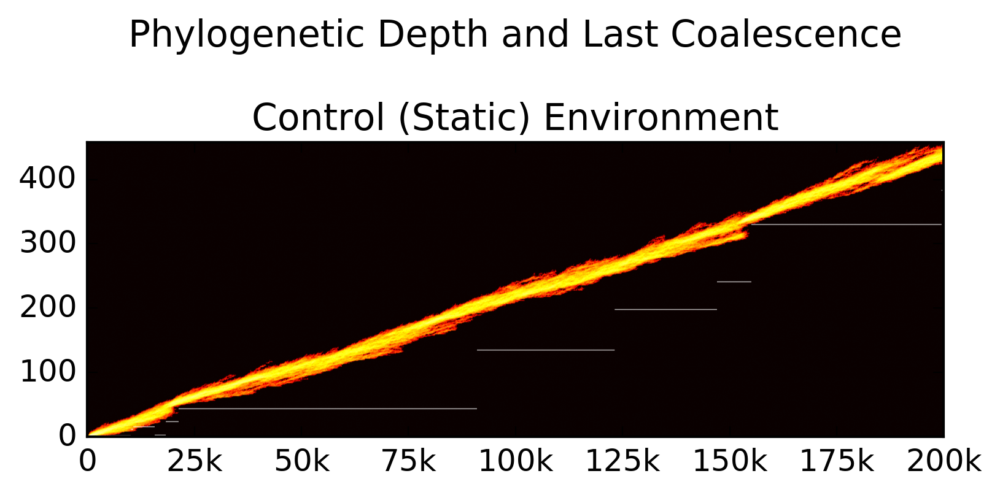

In [26]:
datafiles = ""
subdir = "../populations/control_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_phylogenetic_depth_abundances_over_time.py '
#script += '--horizontal '
script += '--xsize 1950 --ysize 600 '
#script += '--legend '
script += '--ylabel " " '
script += '--xlabel " " '
#script += '--ylim 1000 '
script += '--most_recent_coalescence="../control_intertwined_820001/data/stats.dat,10" '
script += '--title "Phylogenetic Depth and Last Coalescence\n\nControl (Static) Environment" '
script += 'control__phylodepth_with_coalescense.png '
script += subdir + "phylo_depth_abundances_over_time.csv" 



print (script)

!python2 $script

ipyImage('control__phylodepth_with_coalescense.png') 

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --xsize 1950 --ysize 600 --ylabel "Steps from Ancestor
(Phylogenetic Depth)" --xlabel " " --most_recent_coalescence="../noreward_intertwined_820001/data/stats.dat,10" --title "Benign Environment" benign__phylodepth_with_coalescense.png ../populations/noreward_intertwined_820001/phylo_depth_abundances_over_time.csv


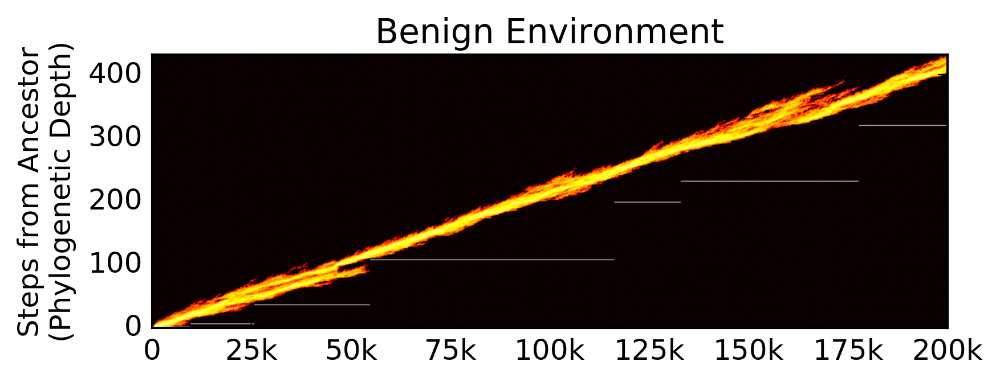

In [25]:
datafiles = ""
subdir = "../populations/noreward_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_phylogenetic_depth_abundances_over_time.py '
#script += '--horizontal '
script += '--xsize 1950 --ysize 600 '
#script += '--legend '
script += '--ylabel "Steps from Ancestor\n(Phylogenetic Depth)" '
script += '--xlabel " " '
#script += '--ylim 1000 '
script += '--most_recent_coalescence="../noreward_intertwined_820001/data/stats.dat,10" '
script += '--title "Benign Environment" '
script += 'benign__phylodepth_with_coalescense.png '
script += subdir + "phylo_depth_abundances_over_time.csv" 



print (script)

!python2 $script

ipyImage('benign__phylodepth_with_coalescense.png') 

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_phylogenetic_depth_abundances_over_time.py --xsize 1950 --ysize 1000 --ylabel " " --xlabel "Time (Updates)" --most_recent_coalescence="../punish_intertwined_820001/data/stats.dat,10" --title "Harsh Environment" harsh__phylodepth_with_coalescense.png ../populations/punish_intertwined_820001/phylo_depth_abundances_over_time.csv


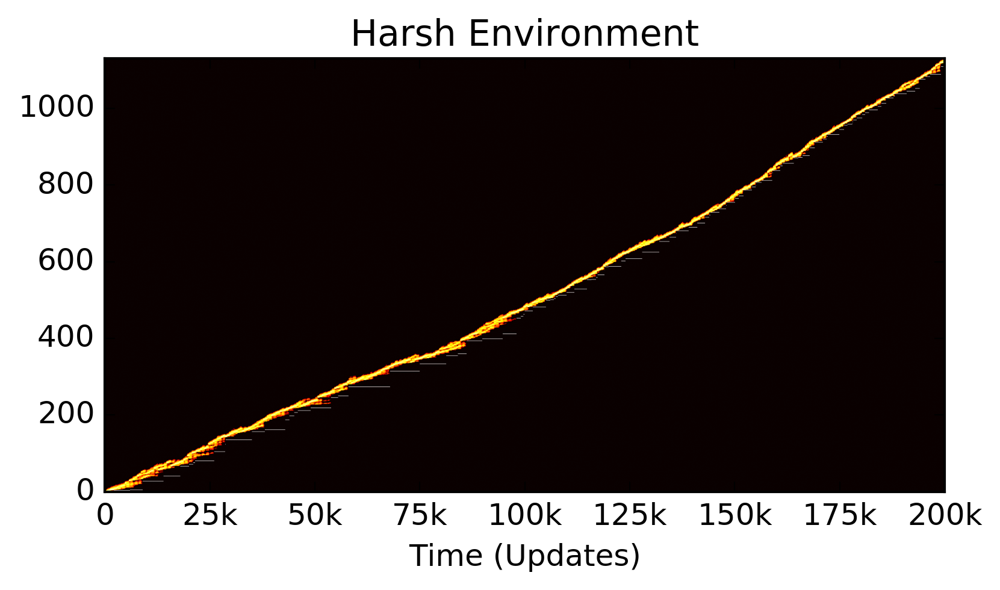

In [27]:
datafiles = ""
subdir = "../populations/punish_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_phylogenetic_depth_abundances_over_time.py '
#script += '--horizontal '
#script += '--xsize 1300 --ysize 800 '
script += '--xsize 1950 --ysize 1000 '
#script += '--legend '
script += '--ylabel " " '
script += '--xlabel "Time (Updates)" '
#script += '--ylim 1000 '
script += '--most_recent_coalescence="../punish_intertwined_820001/data/stats.dat,10" '
script += '--title "Harsh Environment" '
script += 'harsh__phylodepth_with_coalescense.png '
script += subdir + "phylo_depth_abundances_over_time.csv" 



print (script)

!python2 $script

ipyImage('harsh__phylodepth_with_coalescense.png') 

# Population Per Site Entropy - Figure 3

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/populations/punish_intertwined_820001$ python ../../../../../scripts/graph_generation/plot_by_site_entropy.py --show --title "Hostile Treatment" by_site_entropy__hostile__for_poster.png by_site_entropy.csv

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/populations/noreward_intertwined_820001$ python ../../../../../scripts/graph_generation/plot_by_site_entropy.py --show --title "Benign Treatment" by_site_entropy__benign__for_poster.png by_site_entropy.csv

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_by_site_entropy.py --xsize 1560 --ysize 900 --title "Population Entropy by Site and Genotype

Control (Static) Environment" control__entropy.png ../populations/control_intertwined_820001/by_site_entropy.csv


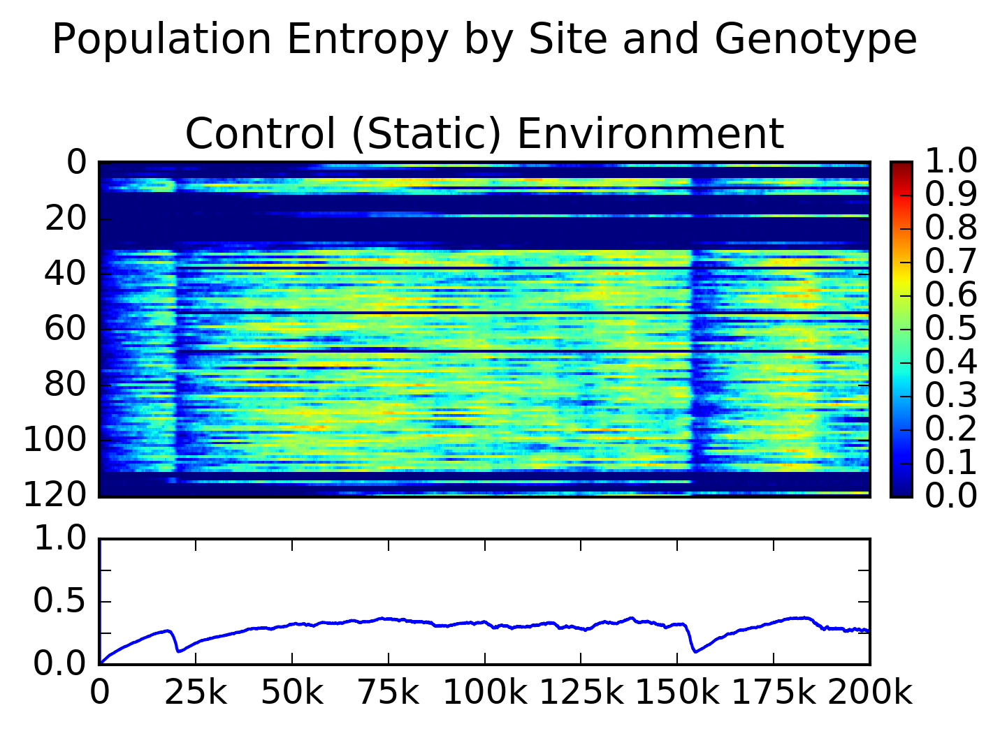

In [20]:
datafiles = ""
subdir = "../populations/control_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_by_site_entropy.py '
#script += '--horizontal '
script += '--xsize 1560 --ysize 900 '
#script += '--legend '
#script += '--ylabel1 "Genome Site" '
#script += '--ylabel2 "Mean\nEntropy" '
#script += '--xlabel "Updates" '
#script += '--ylim 1000 '
script += '--title "Population Entropy by Site and Genotype\n\nControl (Static) Environment" '
script += 'control__entropy.png '
script += subdir + "by_site_entropy.csv" 

print (script)

!python2 $script

ipyImage('control__entropy.png') 

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_by_site_entropy.py --xsize 1560 --ysize 900 --ylabel1 "Genome Locus
(Instruction Site)" --ylabel2 "Mean
Entropy" --title "Benign Environment" benign__entropy.png ../populations/noreward_intertwined_820001/by_site_entropy.csv


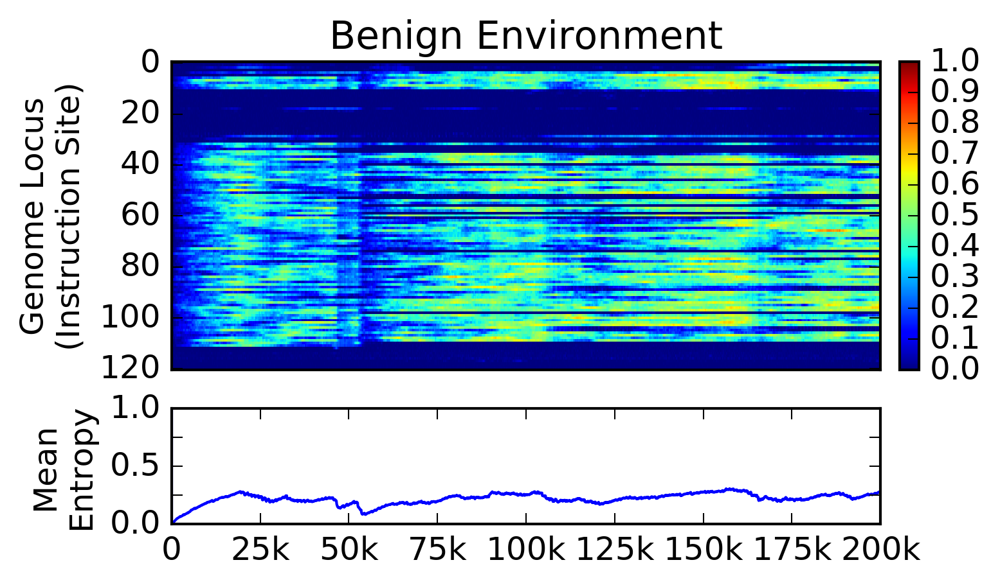

In [19]:
datafiles = ""
subdir = "../populations/noreward_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_by_site_entropy.py '
#script += '--horizontal '
script += '--xsize 1560 --ysize 900 '
#script += '--legend '
script += '--ylabel1 "Genome Locus\n(Instruction Site)" '
script += '--ylabel2 "Mean\nEntropy" '
#script += '--xlabel "Updates" '
#script += '--ylim 1000 '
script += '--title "Benign Environment" '
script += 'benign__entropy.png '
script += subdir + "by_site_entropy.csv" 

print (script)

!python2 $script

ipyImage('benign__entropy.png') 

~/Dropbox/School_Docs/Research/research_scripts/graph_generation/plot_by_site_entropy.py --xsize 1560 --ysize 900 --xlabel "Time (Updates)" --title "Harsh Environment" harsh__entropy.png ../populations/punish_intertwined_820001/by_site_entropy.csv


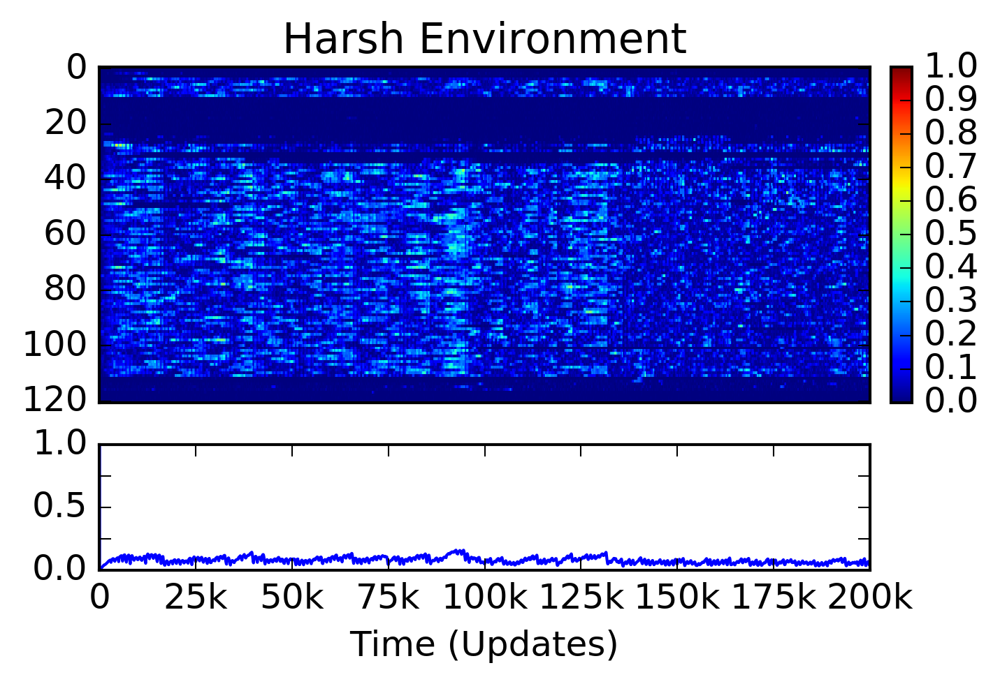

In [20]:
datafiles = ""
subdir = "../populations/punish_intertwined_820001/"

script = scripts_path + 'graph_generation/plot_by_site_entropy.py '
#script += '--horizontal '
script += '--xsize 1560 --ysize 900 '
#script += '--legend '
#script += '--ylabel1 "Genome Site" '
#script += '--ylabel2 "Mean\nEntropy" '
script += '--xlabel "Time (Updates)" '
#script += '--ylim 1000 '
script += '--title "Harsh Environment" '
script += 'harsh__entropy.png '
script += subdir + "by_site_entropy.csv" 

print (script)

!python2 $script

ipyImage('harsh__entropy.png') 

In [1]:
%pwd

'/home/rosiec/Dropbox/School_Docs/Papers/ALife CE Paper/alife2016'

# Lineage Task Maps - Figure 4

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/INTERTWINED/control_intertwined_820001/task_mappings$ python ../../../../../../scripts/analysis/extract_task_mappings.py --lineage_map -a complete_lineage_map.csv -v 5 6 8 ../data/lineage.dat ../data/phenotype/

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/INTERTWINED/control_intertwined_820001/task_mappings$ python ../../../../../../scripts/graph_generation/draw_map_task.py whole_taskmap.png lineage_map__complete_lineage_map.csv__values_only.csv

~/Dropbox/School_Docs/Research/research_scripts/analysis/extract_task_mappings.py --lineage_map -a control_complete_lineage_map.csv 5 6 8 ../control_intertwined_820001//data/lineage.dat ../control_intertwined_820001//data/phenotype/ 
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/draw_map_task.py --horizontal --xsize 2000 --ysize 525 --title "Lineage Task-Sites

Control (Static) Environment" control__whole_taskmap.png lineage_map__control_complete_lineage_map.csv__values_only.csv 


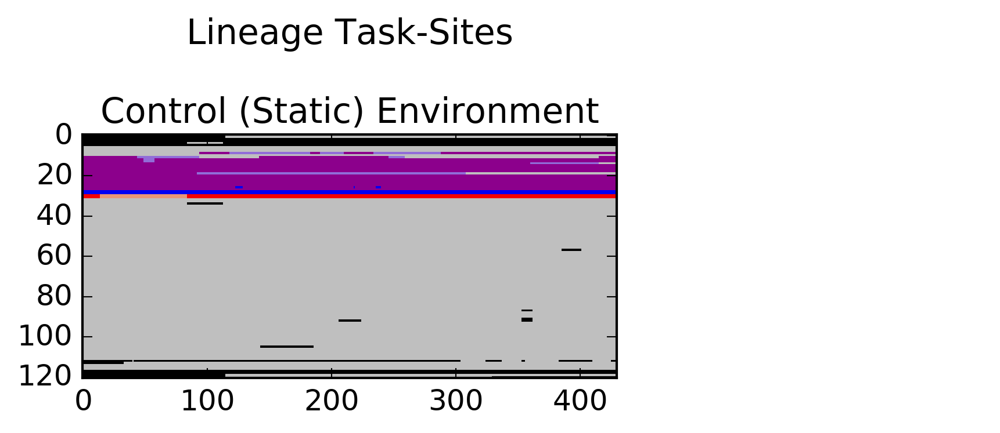

In [9]:
datafiles = ""
glob = "control_intertwined_82*"
#subdir = "../control_intertwined_820001/"


script = scripts_path + 'analysis/extract_task_mappings.py '
script += '--lineage_map -a control_complete_lineage_map.csv '
script += '5 6 8 ' + subdir + '/data/lineage.dat ' + subdir + '/data/phenotype/ '
print (script)
print
!python2 $script

script = scripts_path + 'graph_generation/draw_map_task.py '
script += '--horizontal '
script += '--xsize 2000 --ysize 525 '
#script += '--legend '
#script += '--ylabel "Genome Sites" '
#script += '--xlabel "Steps from Ancestor" '
script += '--title "Lineage Task-Sites\n\nControl (Static) Environment" '
script += 'control__whole_taskmap.png '
script += "lineage_map__control_complete_lineage_map.csv__values_only.csv " 

print (script)

!python2 $script

ipyImage('control__whole_taskmap.png') 

~/Dropbox/School_Docs/Research/research_scripts/analysis/extract_task_mappings.py --lineage_map -a control_complete_lineage_map.csv 5 6 8 ../control_intertwined_820001/data/lineage.dat ../control_intertwined_820001/data/phenotype/ 
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/draw_map_task.py --horizontal --xsize 2000 --ysize 750 --legend legend__whole_taskmap.png lineage_map__control_complete_lineage_map.csv__values_only.csv 


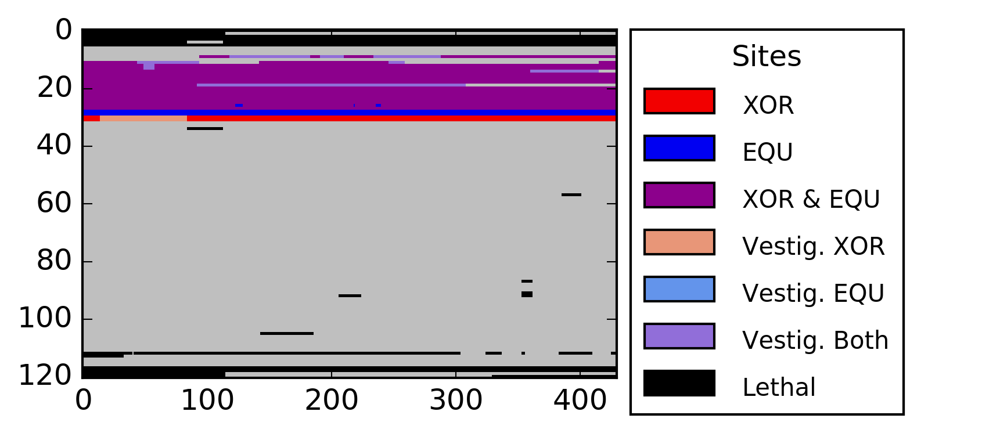

In [7]:
datafiles = ""
subdir = "../control_intertwined_820001"

script = scripts_path + 'analysis/extract_task_mappings.py '
script += '--lineage_map -a control_complete_lineage_map.csv '
script += '5 6 8 ' + subdir + '/data/lineage.dat ' + subdir + '/data/phenotype/ '
print (script)
print
!python2 $script

script = scripts_path + 'graph_generation/draw_map_task.py '
script += '--horizontal '
script += '--xsize 2000 --ysize 750 '
script += '--legend '
#script += '--ylabel "Genome Sites" '
#script += '--xlabel "Steps from Ancestor" '
#script += '--title "Lineage Task-Sites\n\nControl (Static) Environment" '
script += 'legend__whole_taskmap.png '
script += "lineage_map__control_complete_lineage_map.csv__values_only.csv " 

print (script)

!python2 $script

ipyImage('legend__whole_taskmap.png') 

~/Dropbox/School_Docs/Research/research_scripts/analysis/extract_task_mappings.py --lineage_map -a noreward_complete_lineage_map.csv 5 6 8 ../noreward_intertwined_820001/data/lineage.dat ../noreward_intertwined_820001/data/phenotype/ 
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/draw_map_task.py --horizontal --xsize 2000 --ysize 525 --ylabel "Genome Locus
(Instruction Site)" --title "Benign Environment" benign__whole_taskmap.png lineage_map__noreward_complete_lineage_map.csv__values_only.csv 


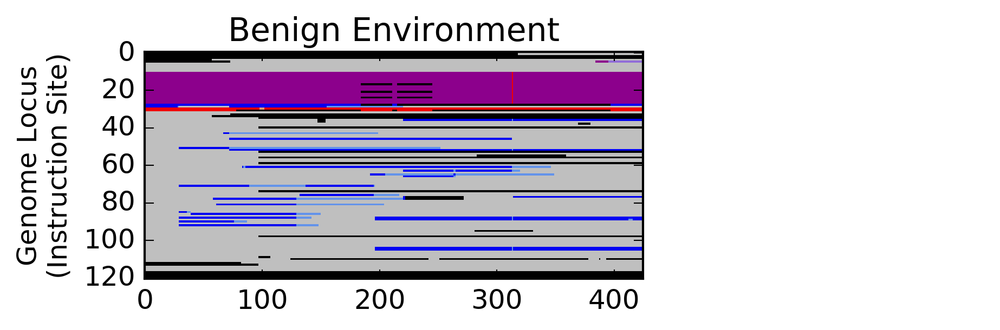

In [10]:
datafiles = ""
subdir = "../noreward_intertwined_820001"

script = scripts_path + 'analysis/extract_task_mappings.py '
script += '--lineage_map -a noreward_complete_lineage_map.csv '
script += '5 6 8 ' + subdir + '/data/lineage.dat ' + subdir + '/data/phenotype/ '
print (script)
print
!python2 $script

script = scripts_path + 'graph_generation/draw_map_task.py '
script += '--horizontal '
script += '--xsize 2000 --ysize 525 '
script += '--ylabel "Genome Locus\n(Instruction Site)" '
#script += '--xlabel "Steps from Ancestor" '
script += '--title "Benign Environment" '
script += 'benign__whole_taskmap.png '
script += "lineage_map__noreward_complete_lineage_map.csv__values_only.csv " 

print (script)

!python2 $script

ipyImage('benign__whole_taskmap.png') 

~/Dropbox/School_Docs/Research/research_scripts/analysis/extract_task_mappings.py --lineage_map -a punish_complete_lineage_map.csv 5 6 8 ../punish_intertwined_820001/data/lineage.dat ../punish_intertwined_820001/data/phenotype/ 
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/draw_map_task.py --horizontal --xsize 2350 --ysize 525 --xlabel "Steps from Ancestor
(Phylogenetic Depth)" --title "Harsh Environment" harsh__whole_taskmap.png lineage_map__punish_complete_lineage_map.csv__values_only.csv 


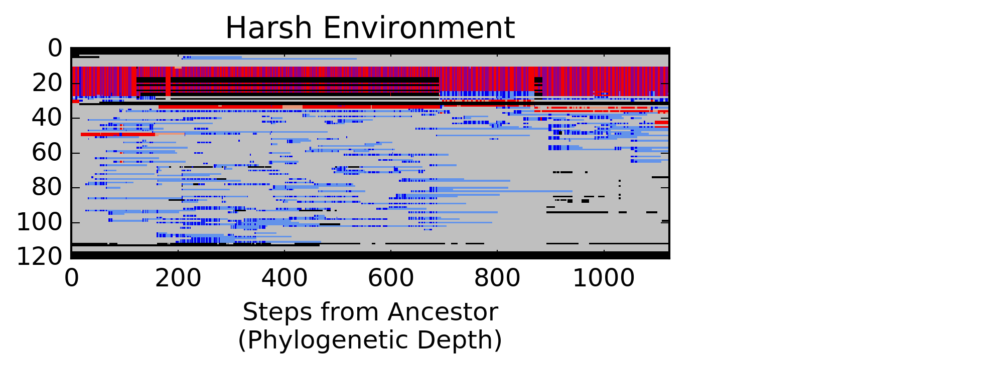

In [11]:
datafiles = ""
subdir = "../punish_intertwined_820001"

script = scripts_path + 'analysis/extract_task_mappings.py '
script += '--lineage_map -a punish_complete_lineage_map.csv '
script += '5 6 8 ' + subdir + '/data/lineage.dat ' + subdir + '/data/phenotype/ '
print (script)
print
!python2 $script

script = scripts_path + 'graph_generation/draw_map_task.py '
script += '--horizontal '
script += '--xsize 2350 --ysize 525 '
#script += '--ylabel "Genome Sites" '
script += '--xlabel "Steps from Ancestor\n(Phylogenetic Depth)" '
script += '--title "Harsh Environment" '
script += 'harsh__whole_taskmap.png '
script += "lineage_map__punish_complete_lineage_map.csv__values_only.csv " 

print (script)

!python2 $script

ipyImage('harsh__whole_taskmap.png') 

# Functional vs Vestigial Sites - Figure 5

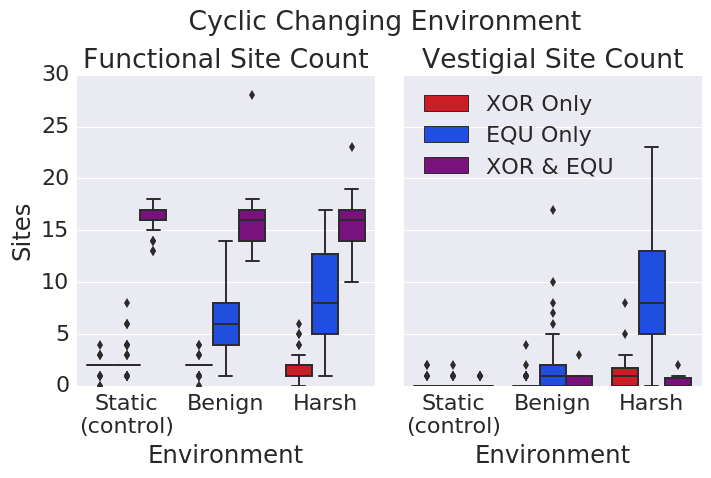

In [166]:
subdir = "../201_CyclicCE/"

dfs = []

tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

for treatment in treatments:
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    filepath = sorted(glob.glob(filepath))[0]    
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],comment="#",skip_blank_lines=True,
                names=["EQU Only", "XOR Only", "XOR & EQU"])
    
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Active"] * len(df)
    dfs.append(df)
    
actives = pd.concat(dfs)

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    filepath = sorted(glob.glob(filepath))[0]
            
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Vestigial"] * len(df)
    dfs.append(df)
    
vestigials = pd.concat(dfs)

combined = pd.concat([actives, vestigials])

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="bright"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Sites",
                   hue="Type",
                   col="Site",
                   data=combined, 
                   hue_order=["XOR Only", "EQU Only", "XOR & EQU"],
                   size=5, aspect=.75, #
                   palette={"EQU Only": "b", 
                            "XOR Only": "r",
                            "XOR & EQU": "#89008E"},
                   kind="box", 
                   legend=False)        

plt.subplots_adjust(top=0.85)
g.fig.suptitle("       Cyclic Changing Environment") # can also get the figure from plt.gcf()   

titles = ["Functional Site Count", "Vestigial Site Count"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    
L=plt.legend(loc="upper left")

#plt.subplots_adjust(top=0.85)
#g.fig.suptitle("       Cyclic Changing Environment") # can also get the figure from plt.gcf()   

# Mutational Landscaping - 1 Step Loss - Figure 6

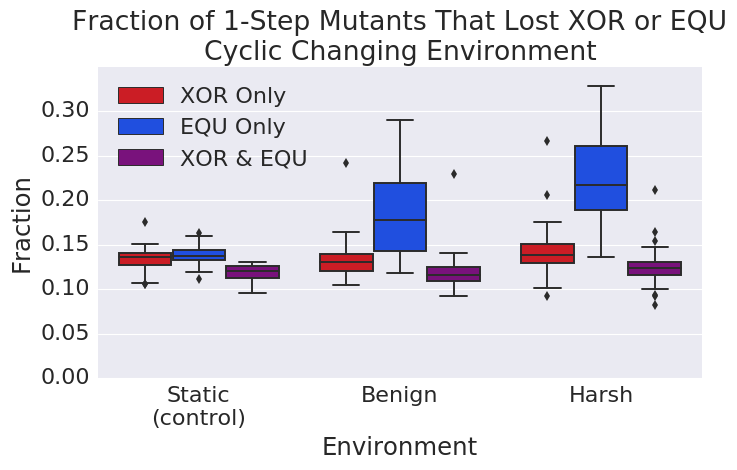

In [157]:
subdir = "../203_CyclicCE__MutLandscape_1Step/"


tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + treatment + "/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[10, 11,
                                                              12],
                names=["XOR Only", "EQU Only"
                       , "XOR & EQU"
                      ],
                comment="#",
                skip_blank_lines=True,
                )
    
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    dfs.append(df)
    
combined = pd.concat(dfs)

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="bright"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Fraction",
                   hue="Type",
                   data=combined,
                   size=5, aspect=1.5, #
                   palette={"EQU Only": "b", 
                            "XOR Only": "r",
                            "XOR & EQU": "#89008E"},
                   kind="box", 
                   legend=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Fraction of 1-Step Mutants That Lost XOR or EQU\nCyclic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    ax.set_ylim([0,0.35])
    
L=plt.legend(loc="upper left")


# Mutational Landscaping  - 2 Step Regain - Figure 7

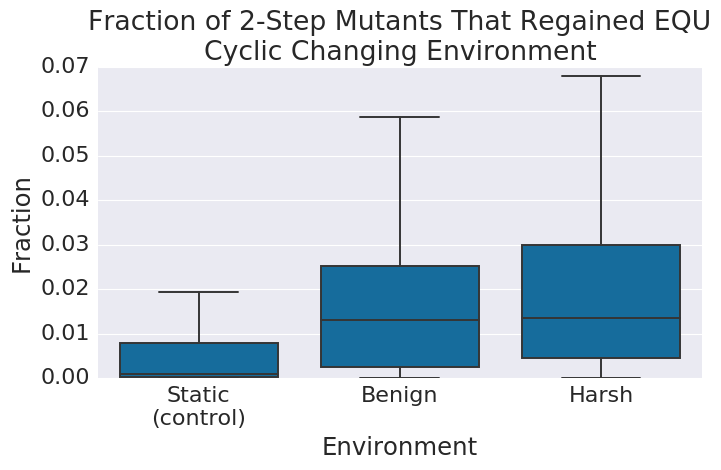

In [160]:
subdir = "../205_CyclicCE__MutLandscape_2ndStep/"


tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + treatment + "__mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[8], comment="#",skip_blank_lines=True,
                names=["Regained EQU"])
    
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    dfs.append(df)
    
combined = pd.concat(dfs)

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="colorblind"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Fraction",
                   hue="Type",
                   data=combined,
                   size=5, aspect=1.5, #
                   palette={"Regained EQU": "b"},
                   kind="box", 
                   legend=False,
                   showfliers=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Fraction of 2-Step Mutants That Regained EQU\nCyclic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)


# D_g and D_p - Figure 8

## Now to plot out the mutational landscapes
The below items were pre-generated using the collect_and_analyze_mut_networks.py script, which calls Avida with a bunch of parameters. These will, in future, be generated as part of the HPCC data-collection process as an after-step in the population generation. But for now, I generated some by hand.   
    
    
First, we generate the mutational networks.

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment.cfg $i ../networks/$(basename $i).s1_dominant_rewarded.xml; done

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*noreward*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment_noreward.cfg $i ../networks/$(basename $i).s1_dominant_noreward.xml; done

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*punish*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment_punish.cfg $i ../networks/$(basename $i).s1_dominant_punished.xml; done

Then, we extract he network metrics that we use to calculate D_p and D_g

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/metrics$ for i in ../networks/*xml; do echo $i; time python ../../../../../scripts/project_specific/mutational_landscapes/collect_network_metrics.py $i > $(basename $i).network_metrics.csv; done    

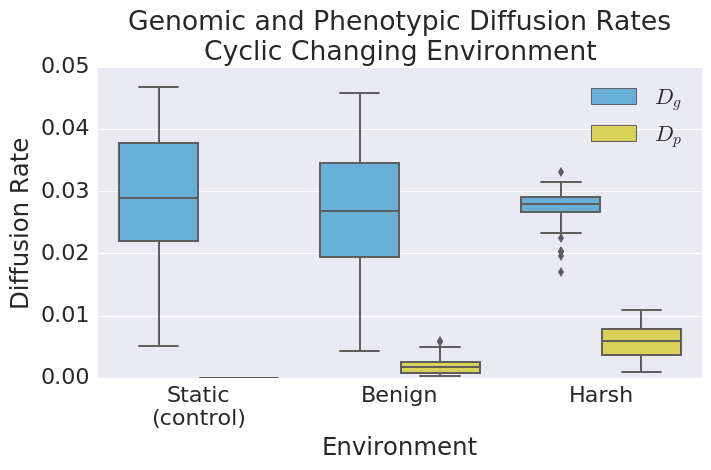

In [163]:
subdir = "../201_CyclicCE/"

tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial"]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_wholepop/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2010" + bit + '_*.network_metrics.csv'
        
        dfiles = sorted(glob.glob(final))

        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
            dta = pd.read_csv(item, header=None, comment="#", 
                              delimiter=",",
                              skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
            
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = [r'$D_g$']*len(D_gs)
    dta['Environment'] = [tname[t]]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = [r'$D_p$']*len(D_ps)
    dta['Environment'] = [tname[t]]*len(D_ps)
    dfs.append(dta)
    
diffusion_rates_201_wholepop = pd.concat(dfs, axis=0)
#print diffusion_rates_201_wholepop.head()  
#print diffusion_rates_201_wholepop.tail()  

sns.set(#style="whitegrid", 
    color_codes=True, 
    palette="colorblind")

sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Diffusion Rate",
                   hue="Metric",
                   data=diffusion_rates_201_wholepop,
                   size=5, aspect=1.5, #
                   palette={r'$D_g$': "c", 
                            r'$D_p$': "y"},
                   kind="box", 
                   legend=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Genomic and Phenotypic Diffusion Rates\nCyclic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    
L=plt.legend(loc="upper right")


# Stoch Env - Vestigial and Active Sites - Figure 9

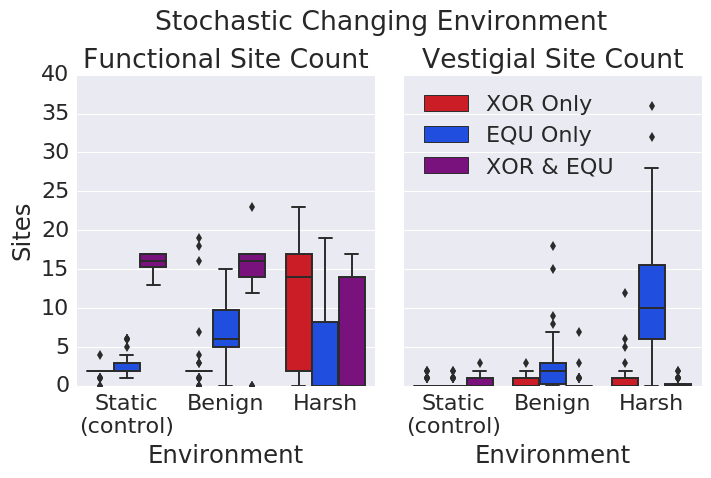

In [168]:
subdir = "../200_StochasticCE/"

dfs = []

tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

for treatment in treatments:
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    filepath = sorted(glob.glob(filepath))[0]    
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],comment="#",skip_blank_lines=True,
                names=["EQU Only", "XOR Only", "XOR & EQU"])
    
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Active"] * len(df)
    dfs.append(df)
    
actives = pd.concat(dfs)

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    filepath = sorted(glob.glob(filepath))[0]
            
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Vestigial"] * len(df)
    dfs.append(df)
    
vestigials = pd.concat(dfs)

combined = pd.concat([actives, vestigials])

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="bright"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Sites",
                   hue="Type",
                   col="Site",
                   data=combined, 
                   hue_order=["XOR Only", "EQU Only", "XOR & EQU"],
                   size=5, aspect=.75, #
                   palette={"EQU Only": "b", 
                            "XOR Only": "r",
                            "XOR & EQU": "#89008E"},
                   kind="box", 
                   legend=False)              

plt.subplots_adjust(top=0.85)
g.fig.suptitle("      Stochastic Changing Environment") # can also get the figure from plt.gcf()   

titles = ["Functional Site Count", "Vestigial Site Count"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    
L=plt.legend(loc="upper left")

# Stoch Env - 1-Step Loss XOR and EQU - Figure 10

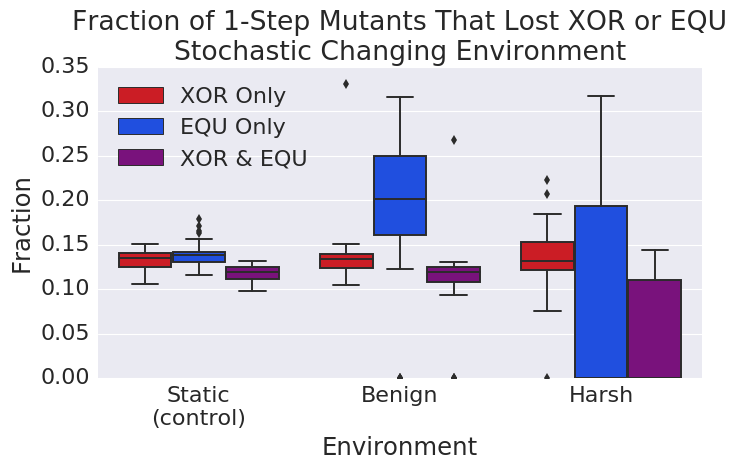

In [172]:
subdir = "../202_StochasticCE__MutLandscape_1Step/"


tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + treatment + "_env/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")

    df = pd.read_csv(filepath, sep=",", header=None, comment="#", skip_blank_lines=True,                
                     usecols=[10, 11, 12],                
                     names=["XOR Only", "EQU Only", "XOR & EQU"])
    
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    dfs.append(df)
    
combined = pd.concat(dfs)

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="bright"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Fraction",
                   hue="Type",
                   data=combined,
                   size=5, aspect=1.5, #
                   palette={"EQU Only": "b", 
                            "XOR Only": "r",
                            "XOR & EQU": "#89008E"},
                   kind="box", 
                   legend=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Fraction of 1-Step Mutants That Lost XOR or EQU\nStochastic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    #ax.set_ylim([-0.01,0.35])
    #ax.set_ylim([0,0.35])
    
L=plt.legend(loc="upper left")#, bbox_to_anchor=(1.05, 1))#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


# Stoch Env - 2-Step Regain EQU - Figure 11

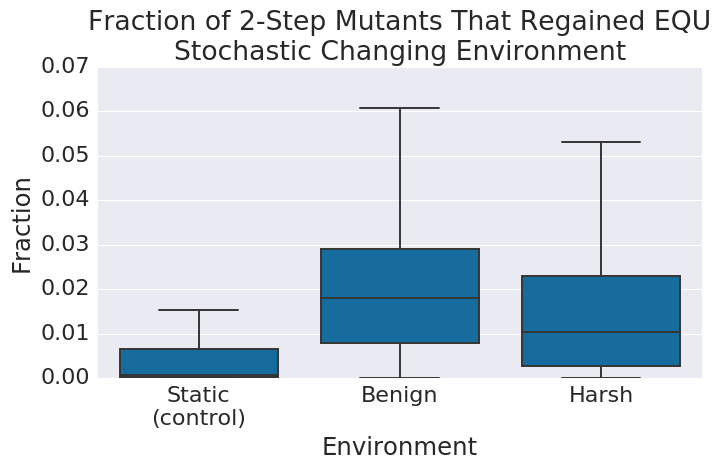

In [174]:
subdir = "../204_StochasticCE__MutLandscape_2ndStep/"


tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

dfs = []
for treatment in treatments:
    filepath = data_path + "/" + subdir + treatment + "__mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[8],
                names=["Regained EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    dfs.append(df)
    
combined = pd.concat(dfs)

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="colorblind"
)
sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Fraction",
                   hue="Type",
                   data=combined,
                   size=5, aspect=1.5, #
                   palette={"Regained EQU": "b"},
                   kind="box", 
                   legend=False,
                   showfliers=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Fraction of 2-Step Mutants That Regained EQU\nStochastic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)


# Stoch D_g and D_p - Figure 12

## Now to plot out the mutational landscapes
The below items were pre-generated using the collect_and_analyze_mut_networks.py script, which calls Avida with a bunch of parameters. These will, in future, be generated as part of the HPCC data-collection process as an after-step in the population generation. But for now, I generated some by hand.   
    
    
First, we generate the mutational networks.

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment.cfg $i ../networks/$(basename $i).s1_dominant_rewarded.xml; done

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*noreward*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment_noreward.cfg $i ../networks/$(basename $i).s1_dominant_noreward.xml; done

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/avida_edi$ for i in ../pops/*punish*spop; do time python ../../../../../scripts/project_specific/mutational_landscapes/collect_and_analyze_mut_network.py --verbose --complete -s1 --interconnect -d --environment environment_punish.cfg $i ../networks/$(basename $i).s1_dominant_punished.xml; done

Then, we extract he network metrics that we use to calculate D_p and D_g

    rosiec@edi:/Core/home/rosiec/__research/mutational_landscapes/raw_data/201_CyclicCE/network_metrics_dominant/metrics$ for i in ../networks/*xml; do echo $i; time python ../../../../../scripts/project_specific/mutational_landscapes/collect_network_metrics.py $i > $(basename $i).network_metrics.csv; done    

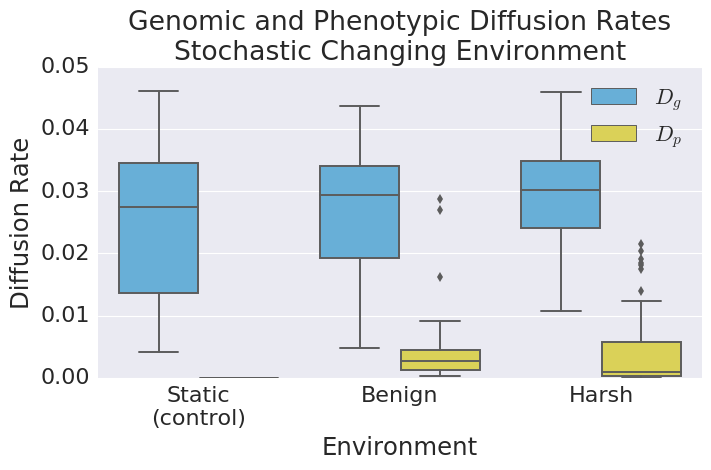

In [177]:
subdir = "../200_StochasticCE/"

tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial",
         ]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_wholepop/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2000" + bit + '_*.network_metrics.csv'
        
        #print final
        
        dfiles = sorted(glob.glob(final))

        #print dfiles
        #print
        
        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
            #print item

            dta = pd.read_csv(item, header=None, comment="#", 
                              delimiter=",",
                              skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            #print dta.head()
            #break
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])
            #print dta.head()

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            #print nu_g, nu_p
            #print F_neut, F_pheno

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
        #break
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = [r'$D_g$']*len(D_gs)
    dta['Environment'] = [tname[t]]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = [r'$D_p$']*len(D_ps)
    dta['Environment'] = [tname[t]]*len(D_ps)
    dfs.append(dta)
   
    
diffusion_rates_201_wholepop = pd.concat(dfs, axis=0)
#print diffusion_rates_201_wholepop.head()  
#print diffusion_rates_201_wholepop.tail()  

sns.set(#style="whitegrid", 
    color_codes=True, palette="colorblind")

sns.set_context('paper', font_scale=2)
g = sns.factorplot(x="Environment", y="Diffusion Rate",
                   hue="Metric",
                   data=diffusion_rates_201_wholepop,
                   size=5, aspect=1.5, #
                   palette={r'$D_g$': "c", 
                            r'$D_p$': "y"},
                   kind="box", 
                   legend=False
              )
plt.subplots_adjust(top=0.85)

titles = ["Genomic and Phenotypic Diffusion Rates\nStochastic Changing Environment"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    #ax.set_ylim([0,0.35])
    #ax.set_ylabel("Diffusion Rate")
    
L=plt.legend(loc="upper right")#, bbox_to_anchor=(1.05, 1))#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


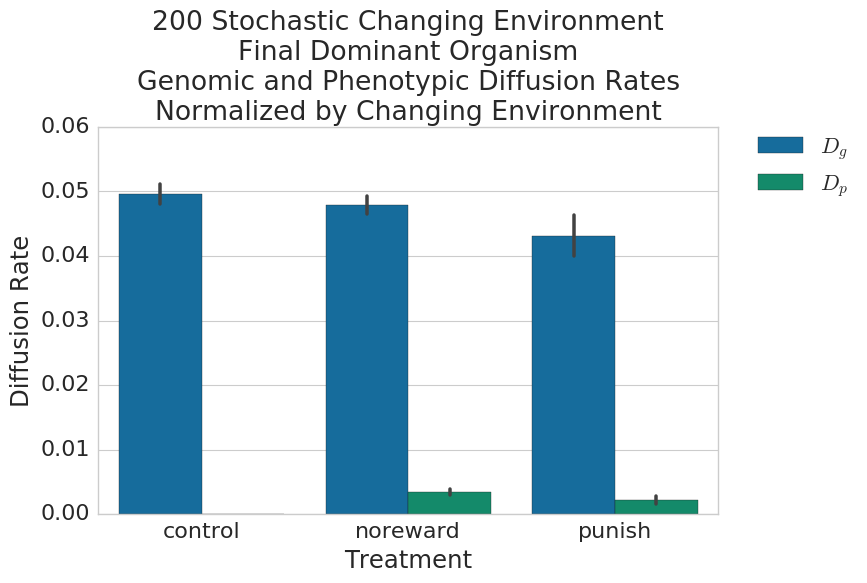

In [139]:
subdir = "../200_StochasticCE/"

    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial",
          #"whitenodes_cts_lethal", "whitenodes_cts_deleterious", "whitenodes_cts_neutral", "whitenodes_cts_beneficial",
          #"blacknodes_cts_lethal", "blacknodes_cts_deleterious", "blacknodes_cts_neutral", "blacknodes_cts_beneficial"
         ]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

#subts = {"control_intertwined": ['rewarded'],
#         "noreward_intertwined": ['rewarded', 'noreward'], 
#         "punish_intertwined": ['rewarded', 'punished']}

#print treatments

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_dominant/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2000" + bit + '_*.network_metrics.csv'
        
#        print final
        
        dfiles = sorted(glob.glob(final))

#        print dfiles
        #print
        
        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
#            print item
#            dta = pd.read_csv(item, header=None, comment="#", 
#                              skipinitialspace=True, names=fields)
            dta = pd.read_csv(item, header=None, comment="#", skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            #print dta.head()
            #break
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])
            #print dta.head()

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            #print nu_g, nu_p
            #print F_neut, F_pheno

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
        #break
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = ['D_g']*len(D_gs)
    dta['Treatment'] = [t]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = ['D_p']*len(D_ps)
    dta['Treatment'] = [t]*len(D_ps)
    dfs.append(dta)
    
    dta_joint = pd.DataFrame()
    dta_joint['D_g']= D_gs
    dta_joint['D_p'] = D_ps
    dta_joint['Treatment'] = [t]*len(D_ps)

    dfs_joint.append(dta_joint)
    
    
    
diffusion_rates = pd.concat(dfs, axis=0)
diffusion_rates_joint = pd.concat(dfs_joint, axis=0)
#print diffusion_rates    

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (8, 5)
ax1 = sns.barplot(x="Treatment", y="Diffusion Rate", hue="Metric", data=diffusion_rates)

handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles, [r'$D_g$',r'$D_p$'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax1.set_title("200 Stochastic Changing Environment\nFinal Dominant Organism\nGenomic and Phenotypic Diffusion Rates\nNormalized by Changing Environment")
ax1.set_ylabel("Diffusion Rate")
#ax1.set_ylim([-0.2,0.6])

### Whole Population D_p and D_g

   Diffusion Rate Metric Treatment
0        0.021873    D_g   control
1        0.017177    D_g   control
2        0.023240    D_g   control
3        0.037189    D_g   control
4        0.023834    D_g   control
    Diffusion Rate Metric Treatment
44        0.007853    D_p    punish
45        0.006098    D_p    punish
46        0.005801    D_p    punish
47        0.004499    D_p    punish
48        0.006976    D_p    punish


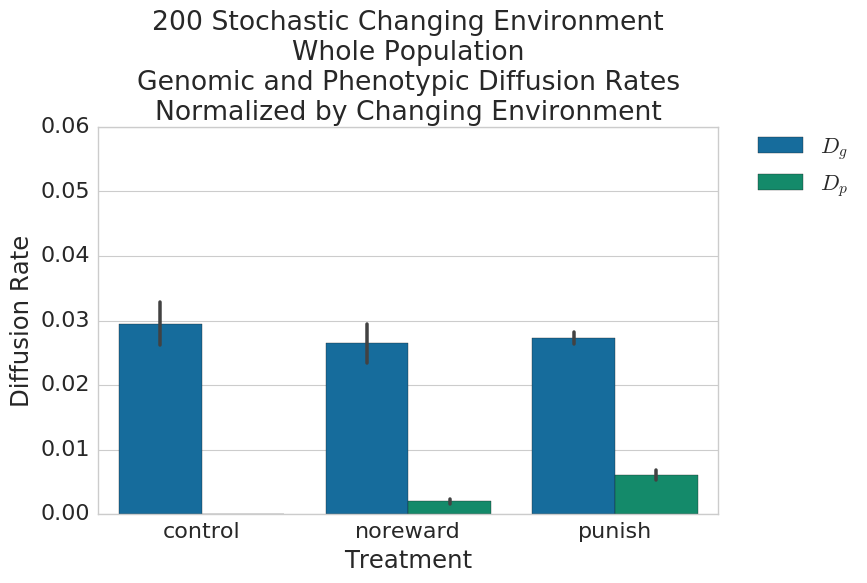

In [142]:
subdir = "../200_StochasticCE/"

    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial",
         ]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_wholepop/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2010" + bit + '_*.network_metrics.csv'
        
        #print final
        
        dfiles = sorted(glob.glob(final))

        #print dfiles
        #print
        
        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
            #print item

            dta = pd.read_csv(item, header=None, comment="#", 
                              delimiter=",",
                              skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            #print dta.head()
            #break
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])
            #print dta.head()

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            #print nu_g, nu_p
            #print F_neut, F_pheno

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
        #break
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = ['D_g']*len(D_gs)
    dta['Treatment'] = [t]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = ['D_p']*len(D_ps)
    dta['Treatment'] = [t]*len(D_ps)
    dfs.append(dta)
    
    dta_joint = pd.DataFrame()
    dta_joint['D_g']= D_gs
    dta_joint['D_p'] = D_ps
    dta_joint['Treatment'] = [t]*len(D_ps)

    dfs_joint.append(dta_joint)
    
    
    
diffusion_rates_201_wholepop = pd.concat(dfs, axis=0)
diffusion_rates_201_wholepop_wide = pd.concat(dfs_joint, axis=0)
print diffusion_rates_201_wholepop.head()  
print diffusion_rates_201_wholepop.tail()  

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (8, 5)
ax1 = sns.barplot(x="Treatment", y="Diffusion Rate", hue="Metric", 
                  data=diffusion_rates_201_wholepop)
ax1.set_ylim([0,0.06])


handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles, [r'$D_g$',r'$D_p$'], bbox_to_anchor=(1.05, 1), 
           loc=2, borderaxespad=0.)

ax1.set_title("200 Stochastic Changing Environment\nWhole Population\nGenomic and Phenotypic Diffusion Rates\nNormalized by Changing Environment")
ax1.set_ylabel("Diffusion Rate")
#ax1.set_ylim([-0.2,0.6])

# Supplemental Figures

## Active and Vestigial Sites Timeseries -- Count for All

### Generate the lineage maps from the raw data
Note, the raw content being pulled by the script below is not available in this archive. It's a few gigabites in a bunch of teeny tiny files, and will be hosted elsewhere. Please email me if you want access before it's up somewhere.

    rosiec@edi:/Core/home/rosiec/__research/evolution_of_modularity/raw_data/082/INTERTWINED$ for i in *intertwined_82*; do python2 ~/__research/scripts/analysis/extract_task_mappings.py --lineage_map -a ./complete_lineage_maps/$(basename $i)_complete_lineage_map.csv 5 6 8 $i/data/lineage.dat $i/data/phenotype/; done

In [60]:
## ripped from the plotting script:
# ColorsMapping = [
#     Colors.Default,     ## 0 - this is unused -- an error code
#     Colors.Gray,        ## 1 - KO.GainBB_GainFL -- neutral
#     Colors.Gray,        ## 2 - KO.GainBB_NeutFL -- neutral
#     Colors.Blue,        ## 3 - fluctuating site, but you also gain BB, so a little different
#     Colors.Gray,        ## 4 - KO.NeutBB_GainFL -- neutral
#     Colors.Gray,        ## 5 - KO.NeutBB_NeutFL -- neutral
#     Colors.Blue,        ## 6 - fluctuating only site
#     Colors.Red,         ## 7 - backbone site, but you gain FL, so interesting
#     Colors.Red,         ## 8 - backbone only site
#     Colors.Purple,      ## 9 - both site
#     Colors.Black,       ## 10 - knocking out this site kills you -- KnockOuts.Dead
#     Colors.LightGray,   ## 11 - empty -- KnockOuts.Empty -- WEIRD -- 11
#     Colors.LightBlue,   ## 12 - degenerate fluctuating site -- KODegen.FLNeut
#     Colors.LightPink,   ## 13 - degenerate backbone site -- KODegen.BBNeut
#     Colors.LightPurple, ## 14 - degenerate both site -- KODegen.BBFLNeut
#     Colors.Yellow,      ## Point Mutation -- 15
#     Colors.Green,       ## Insertion -- 16
#     Colors.Orange,      ## Deletion -- 17
#     Colors.DarkPink,    ## No Mutation -- 18
#     Colors.White,       ## Phases.Reward -- 19
#     Colors.Red,         ## Phases.NoReward
#     Colors.Black]       ## Phases.Border -- 21

### So, what we're interested in is
## 12 - Vestigial Fluctuating
## 13 - Vestigial Backbone
## 14 - Vestigial Both

glob_string = "complete_lineage_maps/*.csv"
other_glob = "*intertwined_82*"
path = data_path+'/'+other_glob
path = path.replace("\\", "")
print path
import glob

vestigial_ct = {}

datafiles = glob.glob(path)
#print datafiles
bip = ""
for item in sorted(datafiles):
    lin = item + "/data/lineage.dat"
    
    topdir = os.path.basename(os.path.normpath(item))
    linmap = data_path + "/complete_lineage_maps/lineage_map__" + topdir + "_complete_lineage_map.csv__values_only.csv"
    vestigial_ct[topdir] = [0] * 2000
    
    df = pd.read_csv(lin, sep=" ", header=None, usecols=[0],
                names=["update_born"],
                comment="#",
                skip_blank_lines=True,
                )
    lm = open(linmap)
    ct = 0;
    for line in lm:
        
        update_born = df['update_born'][ct]
        if update_born == -1:
            update_born = 0
            
        slot = update_born / 100    
        
        vestigials = line.count("12") + line.count("13") + line.count("14")
        vestigial_ct[topdir][slot] =+ vestigials
        ct += 1

!rm *vestigial_timeseries.csv        
        
ctrl_out = open(analysis_path + "/control_intertwined__vestigial_timeseries.csv", 'w')
nrwd_out = open(analysis_path + "/noreward_intertwined__vestigial_timeseries.csv", 'w')
puni_out = open(analysis_path + "/punish_intertwined__vestigial_timeseries.csv", 'w')

for key in vestigial_ct:
    if "control" in key:
        out = ctrl_out
    if "noreward" in key:
        out = nrwd_out
    if "punish" in key:
        out = puni_out
        
    out.write(",".join([str(x) for x in vestigial_ct[key]]))
    out.write("\n")

ctrl_out.close()
nrwd_out.close()
puni_out.close()       

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/*intertwined_82*


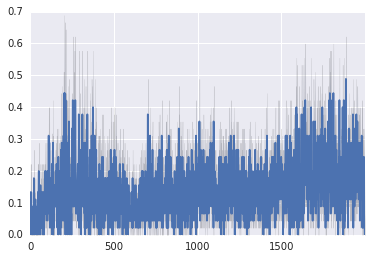

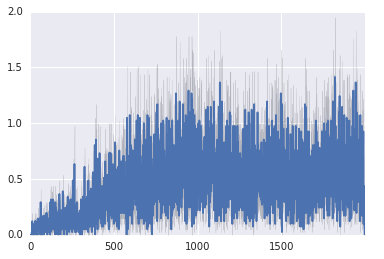

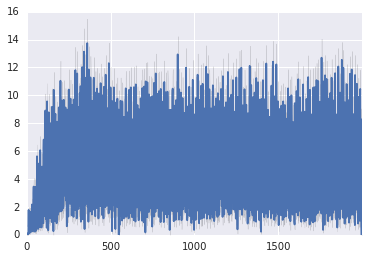

In [121]:
def timeseries_plot(filename):
    df = pd.read_csv(filename) ## it's in a matrix, each row is a replicate
    df = df.transpose() ## make it so the columns are replicates
    df.index = range(0, 200000, 100) ## apply the updates,since we sampled every 100

    ## gather them into an array
    vals = [df[x] for x in df]
    #vals = vals[1:]
    #print vals[0]
    sns.tsplot(vals)

timeseries_plot(analysis_path + "/control_intertwined__vestigial_timeseries.csv")
plt.show()
timeseries_plot(analysis_path + "/noreward_intertwined__vestigial_timeseries.csv")
plt.show()
timeseries_plot(analysis_path + "/punish_intertwined__vestigial_timeseries.csv")


# Old or Development Figures

## Figure 5 Old

### Alife CE Paper Figure

```bash
rosiec@13-42-76:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/INTERTWINED/last_common_ancestor_mutation_landscapes$ python ../../../../../scripts/graph_generation/bar_chart_from_csv.py  --error --groups 3 --xticks "Static (control),Benign,Hostile" --columns "1,2,3" --legend "Fluctuating Task Only,Backbone Task Only,Both Tasks" --pair --title "Vestigial Site Count by Task

and Treatment Environment" --ylabel "Vestigial Sites" --xlabel "Treatment Environment" --separator "," degenerate_sites__intertwined___nototal.png c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv

rosiec@13-42-76:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/INTERTWINED/last_common_ancestor_mutation_landscapes$ python ../../../../../scripts/graph_generation/bar_chart_from_csv.py --error --groups 3 --xticks "Static (control),Benign,Hostile" --columns "1,2,3" --legend "Fluctuating Task Only,Backbone Task Only,Both Tasks" --pair --title "Functional Site Count by Task

and Treatment Environment" --ylabel "Functional Sites" --xlabel "Treatment Environment" --separator "," active_sites__intertwined___nototal.png c*_active_site_count.csv n*_active_site_count.csv p*_active_site_count.csv
#```

control
noreward
punish
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/bar_chart_from_csv.py --error --xsize 850 --ysize 400 --groups 3 --xticks "Static (control),Benign,Harsh" --columns "1,2,3" --legend "EQU Only,XOR Only,XOR & EQU" --pair --title "Vestigial Site Count" --ylabel "Sites" --xlabel "Treatment Environment" --separator "," degenerate_sites__intertwined___nototal.png ../last_common_ancestor_mutation_landscapes/control*_degenerate_site_count.csv ../last_common_ancestor_mutation_landscapes/noreward*_degenerate_site_count.csv ../last_common_ancestor_mutation_landscapes/punish*_degenerate_site_count.csv 


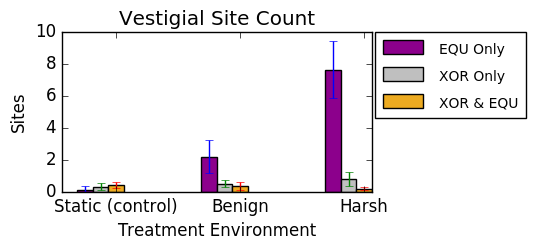

In [9]:

############ OOOOLD -- ignore

datafiles = ""
subdir = "../last_common_ancestor_mutation_landscapes"
for treatment in treatments:
    print (treatment)
    datafiles += subdir + "/" + treatment + "*_degenerate_site_count.csv "
    #datafiles += 'average.dat 4 "../' + treatment + '_*/data*/" "' 
    #datafiles += "_".join(treatments[treatment].split(" ")) + '" '  

script = scripts_path + 'graph_generation/bar_chart_from_csv.py '
script += '--error '
script += '--xsize 850 --ysize 400 '
script += '--groups 3 --xticks "Static (control),Benign,Harsh" ' 
script += '--columns "1,2,3" --legend "EQU Only,XOR Only,XOR & EQU" ' 
script += '--pair --title "Vestigial Site Count" '
script += '--ylabel "Sites" --xlabel "Treatment Environment" '
script += '--separator "," '
script += 'degenerate_sites__intertwined___nototal.png '
script += datafiles
#script += 'c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv '

print (script)

!python2 $script

ipyImage('degenerate_sites__intertwined___nototal.png') 

control
noreward
punish
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/bar_chart_from_csv.py --error --xsize 850 --ysize 400 --groups 3 --xticks "Static (control),Benign,Harsh" --columns "1,2,3" --legend "EQU Only,XOR Only,XOR & EQU" --pair --title "Functional Site Count" --ylabel "Sites" --xlabel "Treatment Environment" --separator "," functional_sites__intertwined___nototal.png ../last_common_ancestor_mutation_landscapes/control*_active_site_count.csv ../last_common_ancestor_mutation_landscapes/noreward*_active_site_count.csv ../last_common_ancestor_mutation_landscapes/punish*_active_site_count.csv 


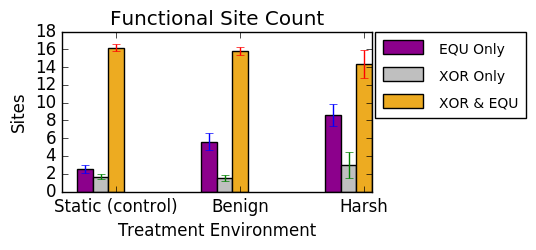

In [8]:
######### OOOOLD
datafiles = ""
subdir = "../last_common_ancestor_mutation_landscapes"
for treatment in treatments:
    print (treatment)
    datafiles += subdir + "/" + treatment + "*_active_site_count.csv "
    #datafiles += 'average.dat 4 "../' + treatment + '_*/data*/" "' 
    #datafiles += "_".join(treatments[treatment].split(" ")) + '" '  

script = scripts_path + 'graph_generation/bar_chart_from_csv.py '
script += '--error '
script += '--xsize 850 --ysize 400 '
script += '--groups 3 --xticks "Static (control),Benign,Harsh" ' 
script += '--columns "1,2,3" --legend "EQU Only,XOR Only,XOR & EQU" ' 
script += '--pair --title "Functional Site Count" '
script += '--ylabel "Sites" --xlabel "Treatment Environment" '
script += '--separator "," '
script += 'functional_sites__intertwined___nototal.png '
script += datafiles
#script += 'c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv '

print (script)

!python2 $script

ipyImage('functional_sites__intertwined___nototal.png') 


### OLD + Seaborn 

#### Vestigial

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/control_intertwined_degenerate_site_count.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/noreward_intertwined_degenerate_site_count.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/punish_intertwined_degenerate_site_count.csv


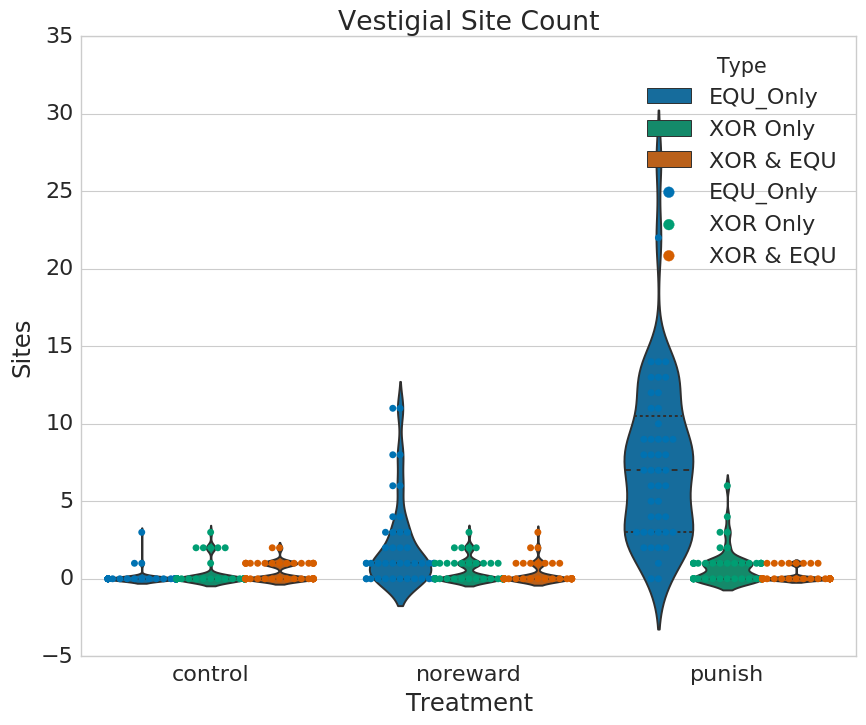

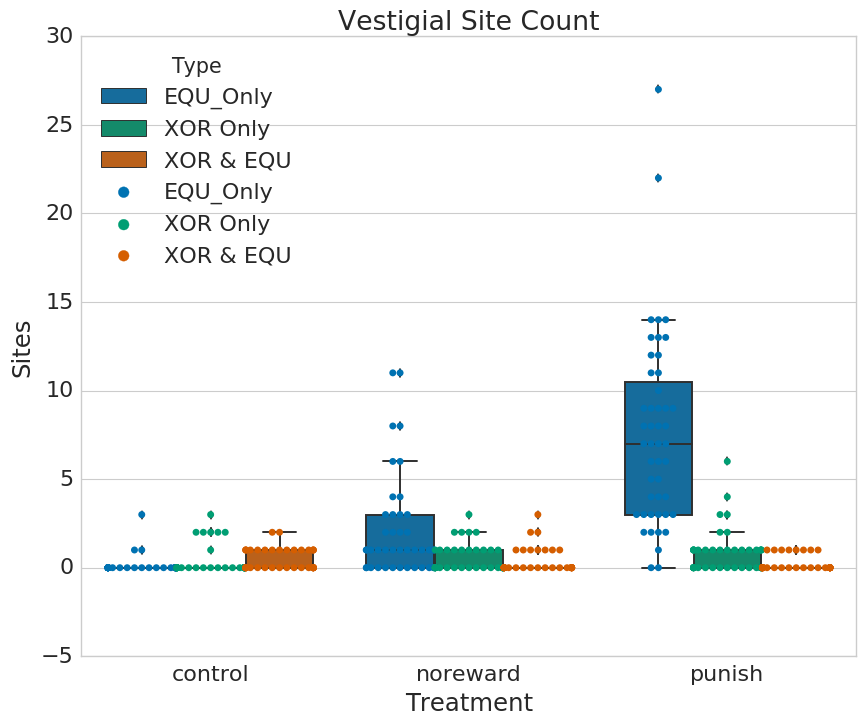

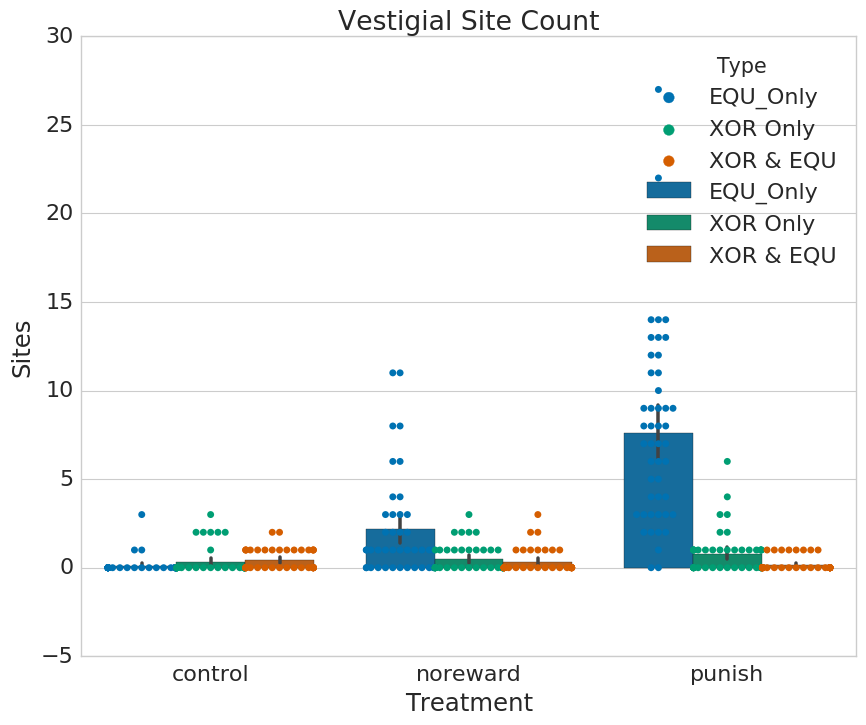

In [24]:
subdir = "last_common_ancestor_mutation_landscapes/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_intertwined_degenerate_site_count.csv"
    filepath = filepath.replace("\\", "")
    print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Vestigial Site Count")
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Vestigial Site Count")
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Vestigial Site Count")
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )



#### Active

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/control_intertwined_active_site_count.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/noreward_intertwined_active_site_count.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/punish_intertwined_active_site_count.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/intermediate_data


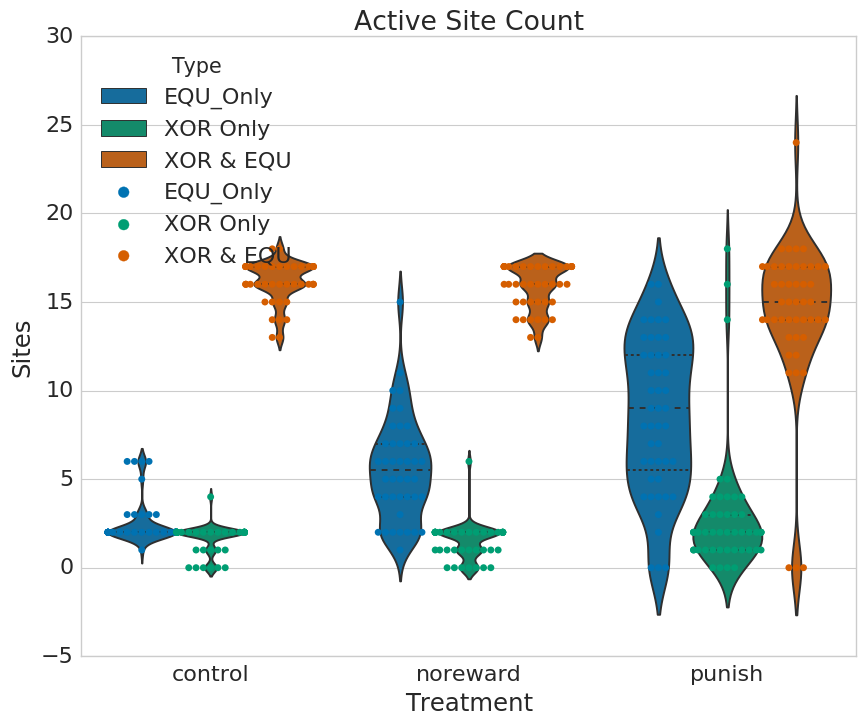

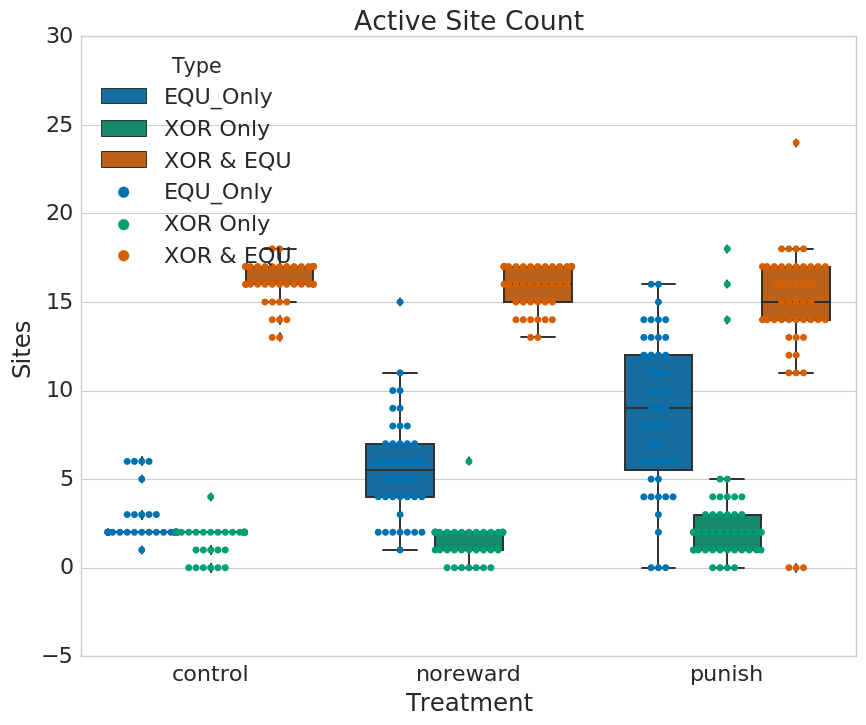

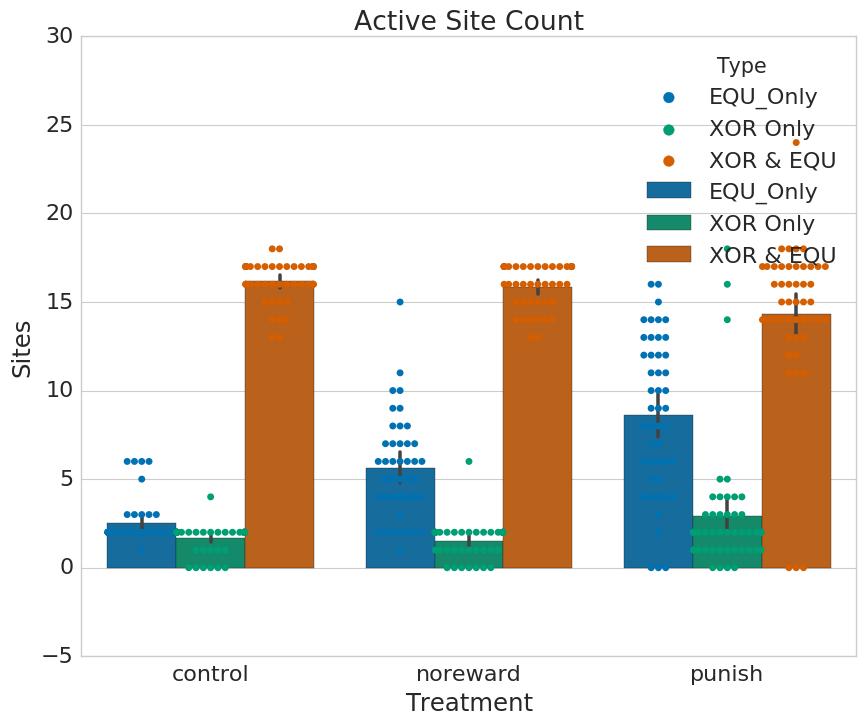

In [29]:
subdir = "last_common_ancestor_mutation_landscapes/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_intertwined_active_site_count.csv"
    filepath = filepath.replace("\\", "")
    print filepath
    !pwd
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Active Site Count")
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               #scale="count", scale_hue=False, bw=.3,
               #inner="quart", 
               
               )
plt.show()
sns.plt.title("Active Site Count")
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               #scale="count", scale_hue=False, bw=.3,
               #inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               #scale="count", scale_hue=False, bw=.3,
               #inner="quart", 
               
               )
plt.show()
sns.plt.title("Active Site Count")
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               #scale="count", scale_hue=False, bw=.3,
               #inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               #scale="count", scale_hue=False, bw=.3,
               #inner="quart", 
               
               )
# sns.swarmplot(x="Label", y=fieldname, #hue='Treatment', 
#               data=df, 
#               split=True,
#                  )
#     print df.head()



### New/Devel

#### Vestigial

Generate the lineage maps from the raw data

Note, the raw content being pulled by the script below is not available in this archive. It's a few gigabites in a bunch of teeny tiny files, and will be hosted elsewhere. Please email me if you want access before it's up somewhere.

    rosiec@edi:/Core/home/rosiec/__research/evolution_of_modularity/raw_data/082/INTERTWINED$ for i in *intertwined_82*; do python2 ~/__research/scripts/analysis/extract_task_mappings.py --lineage_map -a ./complete_lineage_maps/$(basename $i)_complete_lineage_map.csv 5 6 8 $i/data/lineage.dat $i/data/phenotype/; done


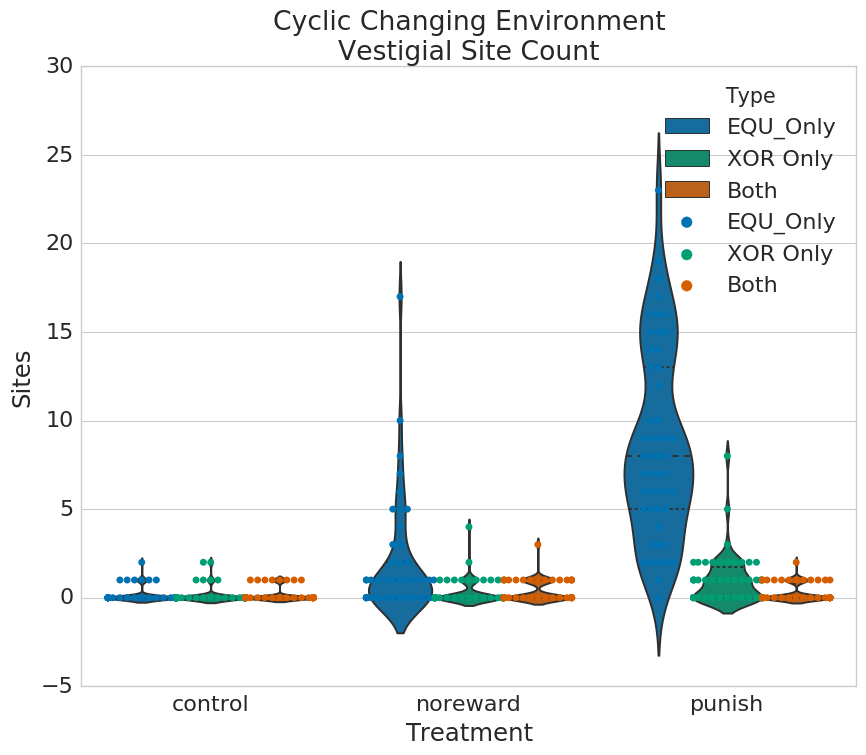

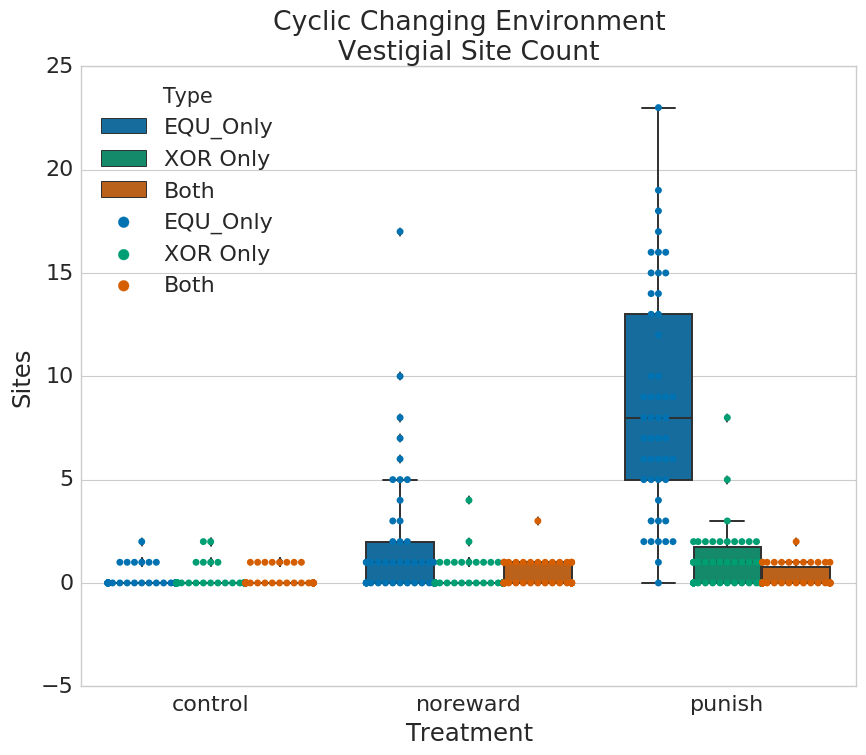

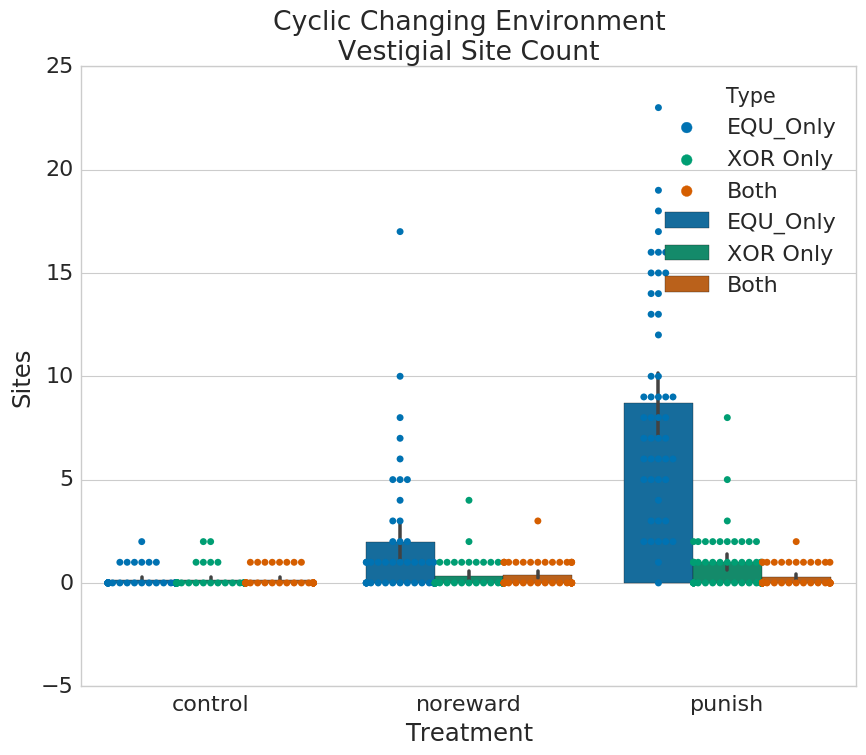

In [87]:
subdir = "../201_CyclicCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Cyclic Changing Environment\nVestigial Site Count"
sns.plt.title(title)
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )





#### Active

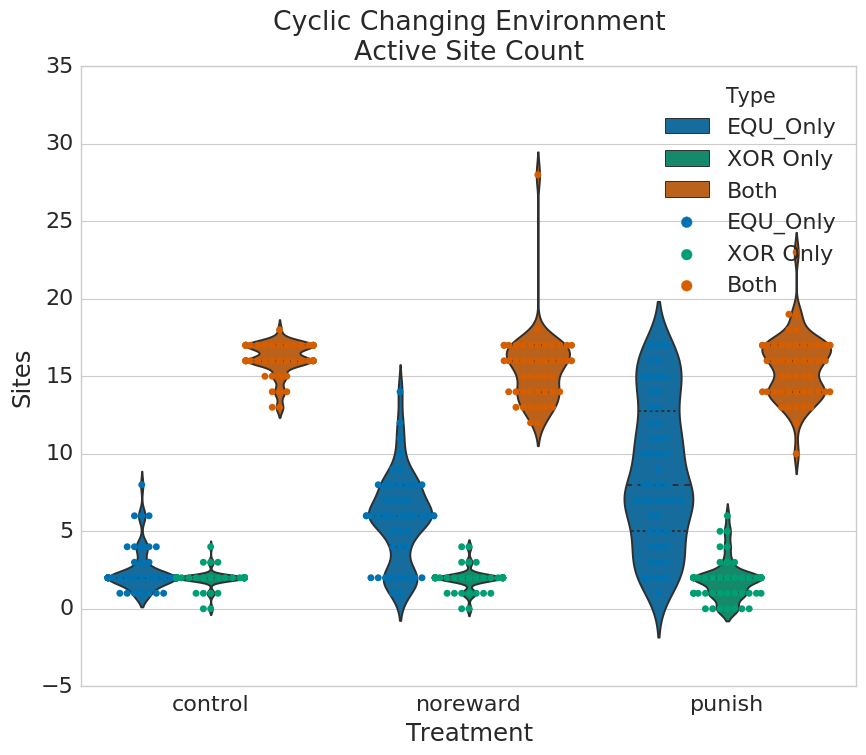

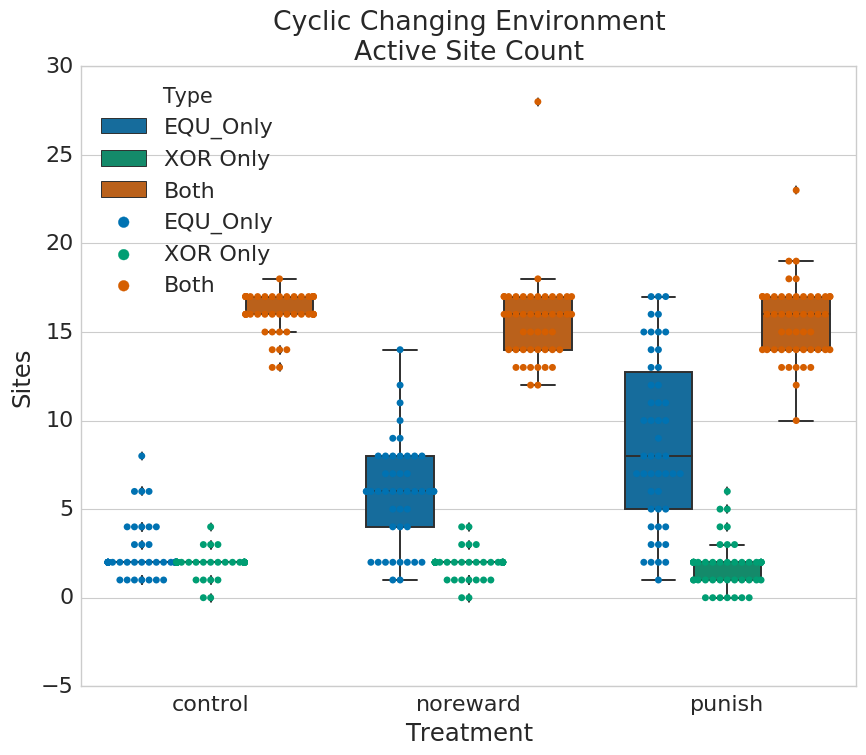

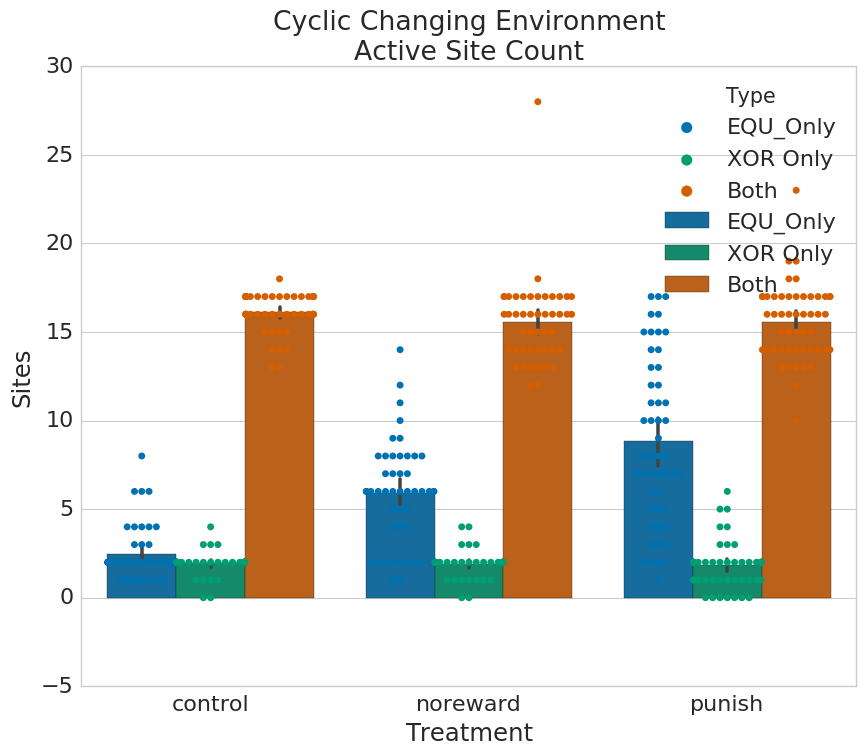

In [88]:
subdir = "../201_CyclicCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Cyclic Changing Environment\nActive Site Count"
sns.plt.title(title)
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )





#### Combined

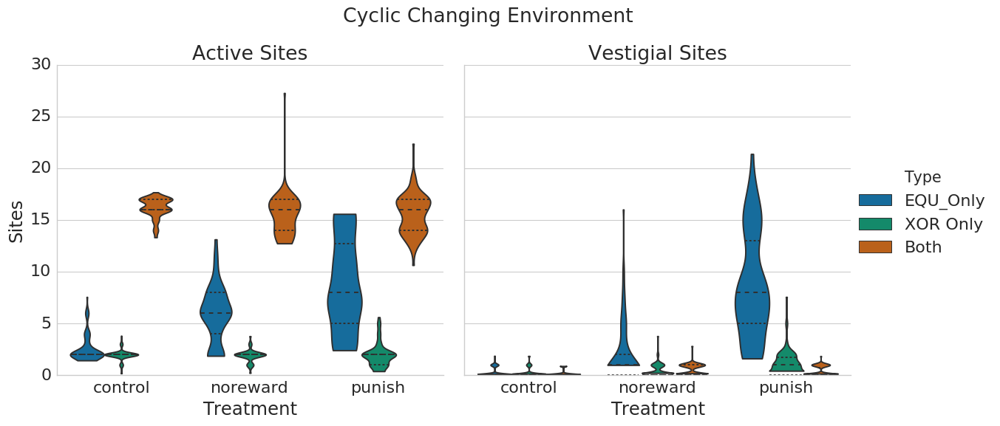

In [136]:
subdir = "../201_CyclicCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    df['Site'] = ["Active"] * len(df)
    dfs.append(df)
    
actives = pd.concat(dfs)

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    df['Site'] = ["Vestigial"] * len(df)
    dfs.append(df)
    
vestigials = pd.concat(dfs)

combined = pd.concat([actives, vestigials])

#print combined.head()
#print combined.tail()

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
#plt.rcParams['figure.figsize'] = (10, 8)
title="Cyclic Changing Environment"
#sns.plt.title(title)

g = sns.factorplot(x="Treatment", y="Sites",
               #hue="Site", 
               hue="Type",
               #col="Treatment",
               col="Site",
                data=combined,
               #orient="h",         
               size=6, aspect=1, #palette={"Active": "r", "Vestigial": "b"},
               kind="violin", 
               #split=True, 
               cut=-1, bw=.3, scale="count", scale_hue=False,
               inner="quart"
              )
plt.subplots_adjust(top=0.85)
g.fig.suptitle(title) # can also get the figure from plt.gcf()   

titles = ["Active Sites", "Vestigial Sites"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)

# sns.factorplot(x="Type", y="Sites",
#                 hue="Site", col="Treatment",
#                 data=combined,
#                #orient="h",         
#                size=12, aspect=.5, palette={"Active": "r", "Vestigial": "b"},
#                kind="violin", 
#                split=True, 
#                cut=-1, bw=.3, scale="count", scale_hue=False,
#                inner="quart"
#               )

    
# sns.factorplot(x="Type", y="Sites",
#                 hue="Site", col="Treatment",
#                 data=combined,
#                #orient="h",         
#                size=12, aspect=.5, palette="Set4",
#                kind="swarm", split=True, 
#                #cut=-1, bw=.3, scale="count", scale_hue=False,
#                #inner="quart"
#               )
# sns.violinplot(x="Treatment", y="Sites", hue='Type', 
#                data=actives, 
#                #split=True, 
#                scale="count", scale_hue=False, bw=.3,
#                inner="quart", 
               
#                )
# sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
#                data=actives, 
#                split=True, 
#                )






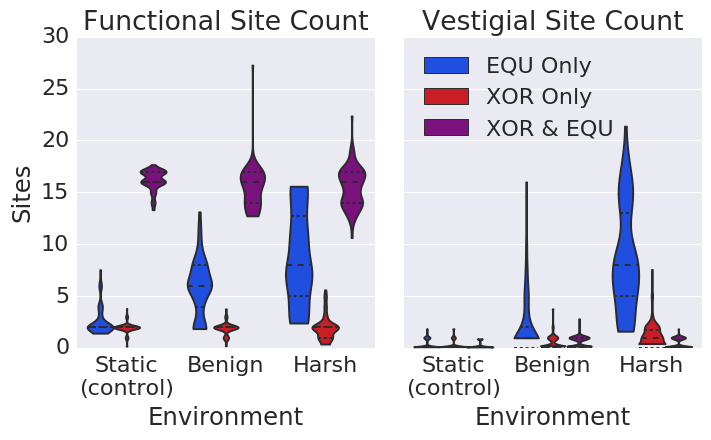

In [92]:
subdir = "../201_CyclicCE/"

dfs = []

tname = {"control": "Static\n(control)",
        "noreward": "Benign",
        "punish": "Harsh"}

for treatment in treatments:
    
    
    
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Active"] * len(df)
    dfs.append(df)
    
actives = pd.concat(dfs)

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU Only", "XOR Only", "XOR & EQU"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Environment'] = [tname[treatment]] * len(df)
    df['Site'] = ["Vestigial"] * len(df)
    dfs.append(df)
    
vestigials = pd.concat(dfs)

combined = pd.concat([actives, vestigials])

#print combined.head()
#print combined.tail()

sns.set(#style="whitegrid", 
        color_codes=True, 
        palette="bright"
)
sns.set_context('paper', font_scale=2)
#plt.rcParams['figure.figsize'] = (10, 8)

#sns.plt.title(title)

g = sns.factorplot(x="Environment", y="Sites",
               #hue="Site", 
               hue="Type",
               #col="Treatment",
               col="Site",
                data=combined,
               #orient="h",         
               size=5, aspect=.75, #
                   palette={"EQU Only": "b", 
                            "XOR Only": "r",
                            "XOR & EQU": "89008E"},
               kind="violin", 
               #split=True, 
               cut=-1, bw=.3, scale="count", scale_hue=False,
               inner="quart",
                legend=False
              )
plt.subplots_adjust(top=0.85)
#title="Cyclic Changing Environment"
#g.fig.suptitle(title) # can also get the figure from plt.gcf()   

titles = ["Functional Site Count", "Vestigial Site Count"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)
    #ax.set_ylim([0,35])
    
L=plt.legend(loc="upper left")#, bbox_to_anchor=(1.05, 1))#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#L.get_texts()[0].set_text('EQU Only')
#L.get_texts()[0].set_text('EQU Only')
#L.get_texts()[2].set_text('XOR & EQU')







## Figure 6 Old

### ALife CE Paper Figure

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/082/INTERTWINED/last_common_ancestor_mutation_landscapes$ python ../../../../../scripts/graph_generation/bar_chart_from_csv.py 
    --groups 3 
    --xticks "Control,Benign,Hostile" 
    --columns "12" 
    --pair 
    --title "Fraction of Single-step Mutants that Lost Fluctuating Task" 
    --ylabel "Fraction" 
    --xlabel "Treatment" 
    --separator "," 
    --error 
    --show twostep_does_fluct.png 
    c*_*/mutation_landscape_metrics.csv 
    n*_*/mutation_landscape_metrics.csv 
    p*_*/mutation_landscape_metrics.csv &

control
noreward
punish
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/bar_chart_from_csv.py --error --xsize 1000 --ysize 500 --groups 3 --xticks "Static (control),Benign,Harsh" --columns "12" --pair --title "Fraction of 1-Step Mutants That Lost EQU 
" --ylabel "Fraction of Mutants" --xlabel "Treatment Environment" --separator "," onestep_lost_fluct.png ../last_common_ancestor_mutation_landscapes/control*_*/mutation_landscape_metrics.csv ../last_common_ancestor_mutation_landscapes/noreward*_*/mutation_landscape_metrics.csv ../last_common_ancestor_mutation_landscapes/punish*_*/mutation_landscape_metrics.csv 


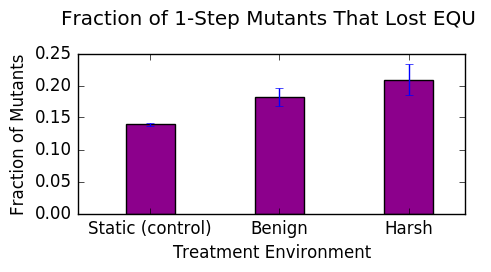

In [12]:
datafiles = ""
subdir = "../last_common_ancestor_mutation_landscapes"
for treatment in treatments:
    print (treatment)
    datafiles += subdir + "/" + treatment + "*_*/mutation_landscape_metrics.csv "
    #datafiles += 'average.dat 4 "../' + treatment + '_*/data*/" "' 
    #datafiles += "_".join(treatments[treatment].split(" ")) + '" '  

script = scripts_path + 'graph_generation/bar_chart_from_csv.py '
script += '--error '
script += '--xsize 1000 --ysize 500 '
script += '--groups 3 --xticks "Static (control),Benign,Harsh" ' 
script += '--columns "12" '
#script += '--legend "EQU Only,XOR Only,XOR & EQU" ' 
script += '--pair --title "Fraction of 1-Step Mutants That Lost EQU \n" '
script += '--ylabel "Fraction of Mutants" --xlabel "Treatment Environment" '
script += '--separator "," '
script += 'onestep_lost_fluct.png '
script += datafiles
#script += 'c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv '

print (script)

!python2 $script

ipyImage('onestep_lost_fluct.png') 


control
noreward
punish
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/bar_chart_from_csv.py --error --xsize 850 --ysize 500 --groups 3 --xticks "Static (control),Benign,Harsh" --columns "12,11,13" --legend "Lost EQU,Lost XOR,Lost Both" --pair --title "Fraction of 1-Step Mutants
That Lost XOR or EQU" --ylabel "Fraction of Mutants" --xlabel "Treatment Environment" --separator "," onestep_lost_fluct.png ../last_common_ancestor_mutation_landscapes/control*_*/mutation_landscape_metrics.csv ../last_common_ancestor_mutation_landscapes/noreward*_*/mutation_landscape_metrics.csv ../last_common_ancestor_mutation_landscapes/punish*_*/mutation_landscape_metrics.csv 


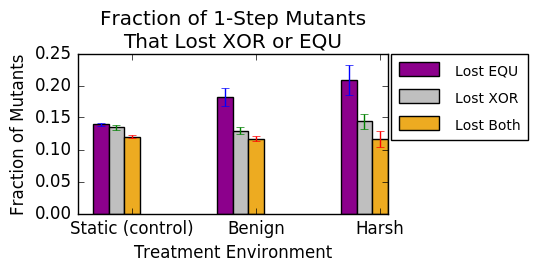

In [13]:
datafiles = ""
subdir = "../last_common_ancestor_mutation_landscapes"
for treatment in treatments:
    print (treatment)
    datafiles += subdir + "/" + treatment + "*_*/mutation_landscape_metrics.csv "
    #datafiles += 'average.dat 4 "../' + treatment + '_*/data*/" "' 
    #datafiles += "_".join(treatments[treatment].split(" ")) + '" '  

script = scripts_path + 'graph_generation/bar_chart_from_csv.py '
script += '--error '
script += '--xsize 850 --ysize 500 '
script += '--groups 3 --xticks "Static (control),Benign,Harsh" ' 
script += '--columns "12,11,13" '
script += '--legend "Lost EQU,Lost XOR,Lost Both" ' 
script += '--pair --title "Fraction of 1-Step Mutants\nThat Lost XOR or EQU" '
script += '--ylabel "Fraction of Mutants" --xlabel "Treatment Environment" '
script += '--separator "," '
script += 'onestep_lost_fluct.png '
script += datafiles
#script += 'c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv '

print (script)

!python2 $script

ipyImage('onestep_lost_fluct.png') 


### Newer Seaborn Figure using 4-year-old 082 data (same as ALife CE Paper Figure)

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/control_intertwined/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/noreward_intertwined/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/punish_intertwined/mutation_landscape_metrics.csv


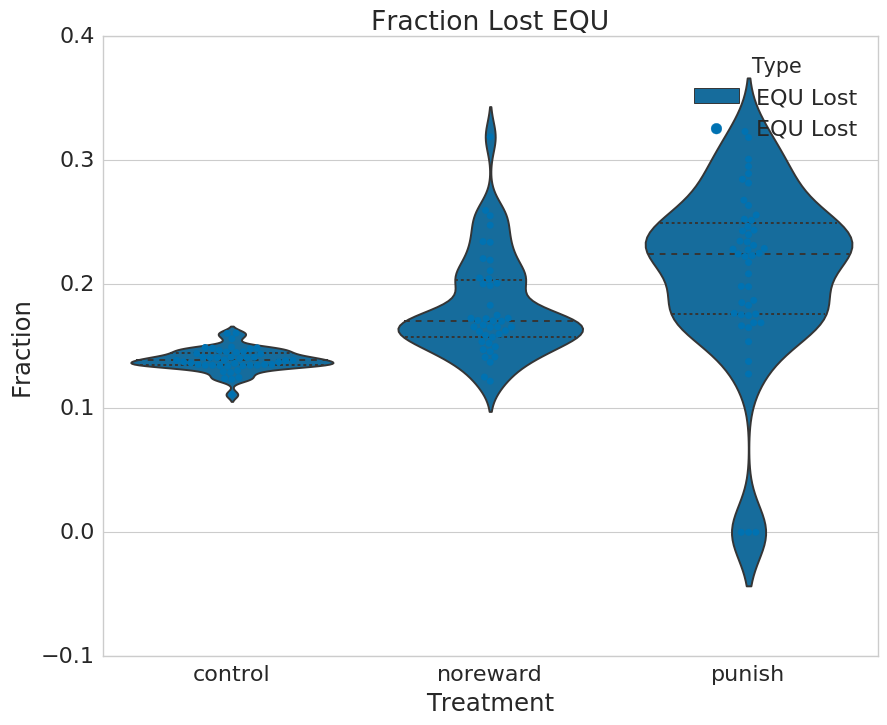

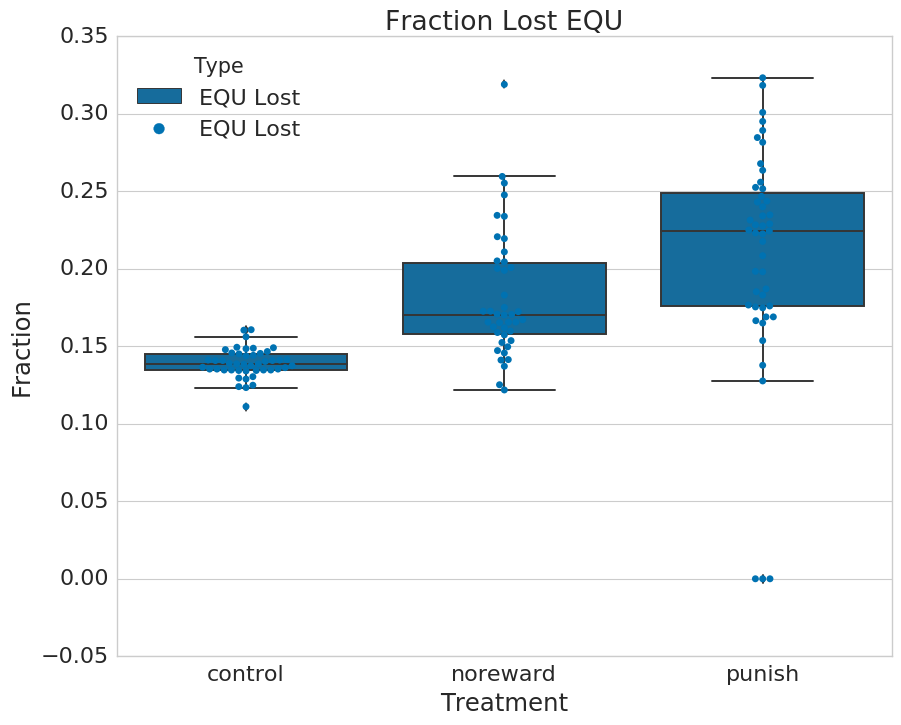

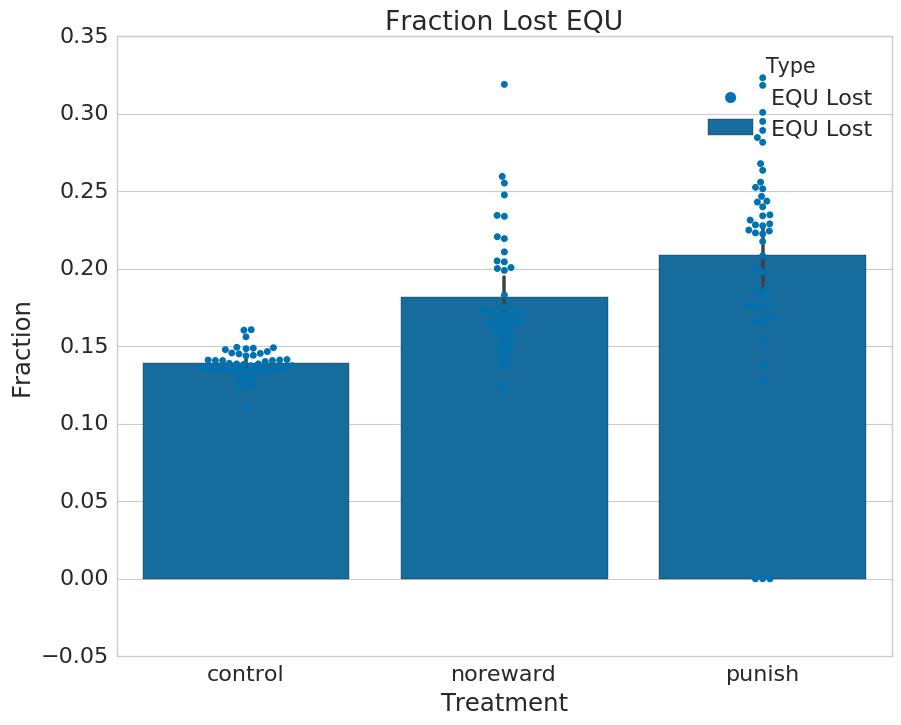

In [36]:
subdir = "last_common_ancestor_mutation_landscapes/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_intertwined/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
                names=["EQU Lost"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Fraction Lost EQU")
sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )


/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/control_intertwined/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/noreward_intertwined/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/last_common_ancestor_mutation_landscapes/punish_intertwined/mutation_landscape_metrics.csv


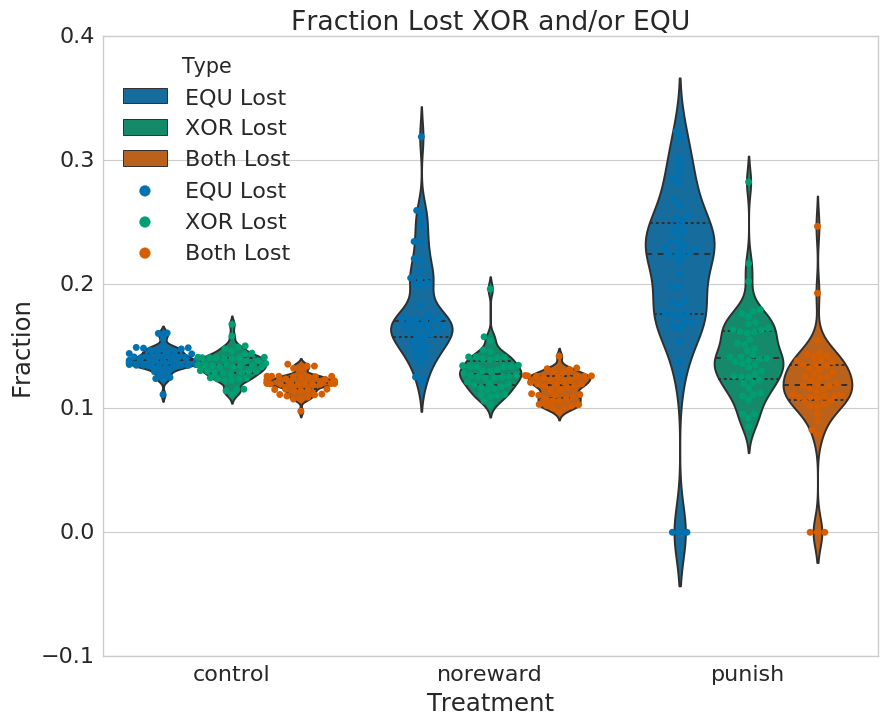

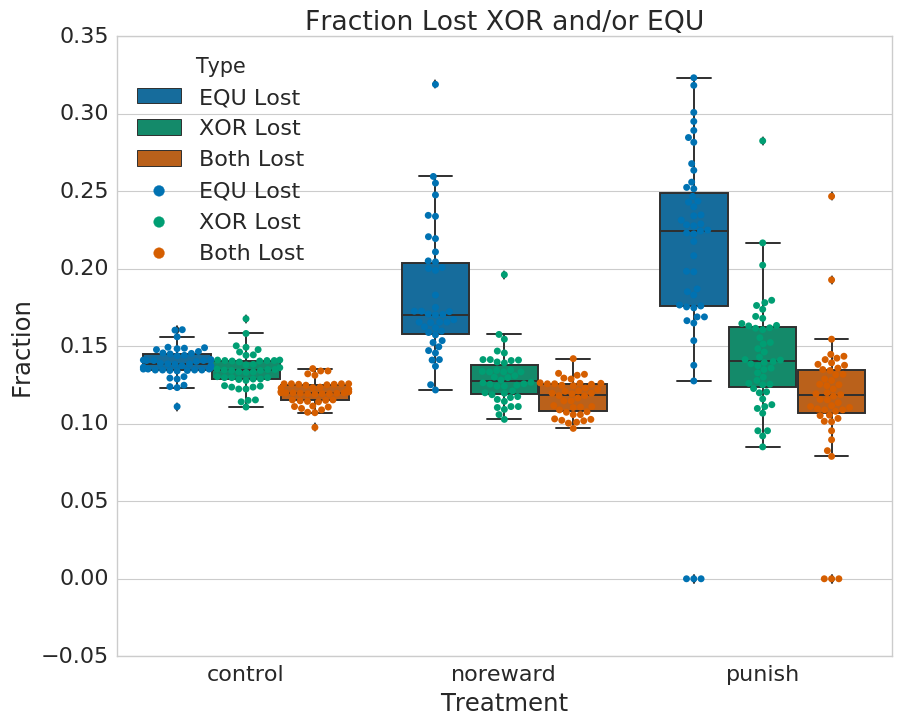

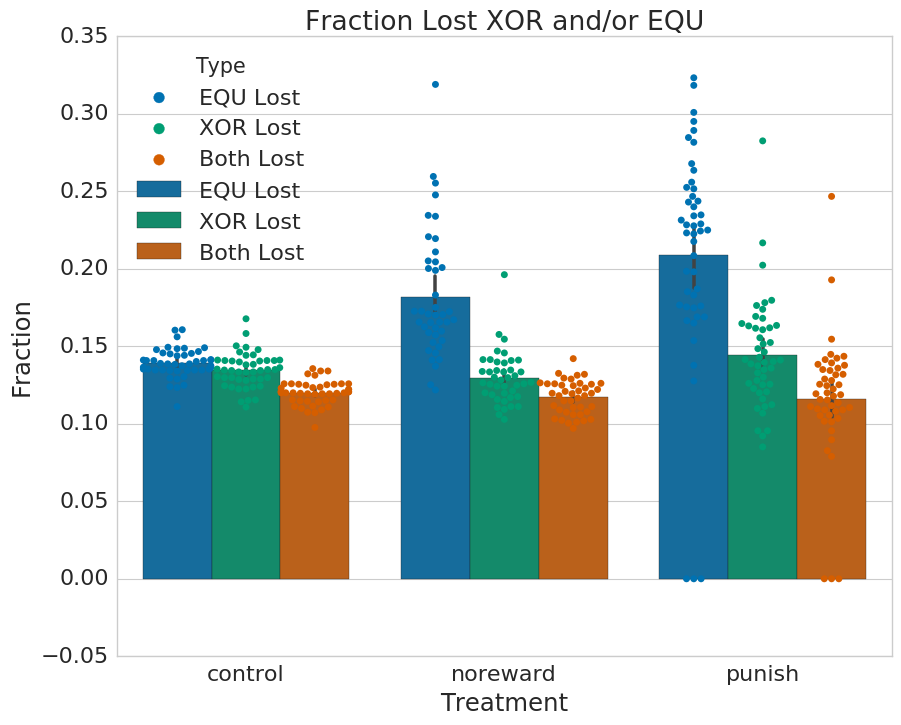

In [44]:
subdir = "last_common_ancestor_mutation_landscapes/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_intertwined/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[10, 11,
                                                              12
                                                             ],
                names=["XOR Lost", "EQU Lost"
                       , "Both Lost"
                      ],
                comment="#",
                skip_blank_lines=True,
                )
    
#     df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
#             names=["EQU Lost"],
#             comment="#",
#             skip_blank_lines=True,
#             )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Fraction Lost XOR and/or EQU")
order = ["EQU Lost","XOR Lost","Both Lost"]
sns.violinplot(x="Treatment", y="Fraction", hue='Type', hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost XOR and/or EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )


### New/Dev - 1-Step, Pulled from MutLand:201_CE

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/control/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/noreward/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/punish/data/mutation_landscape_metrics.csv


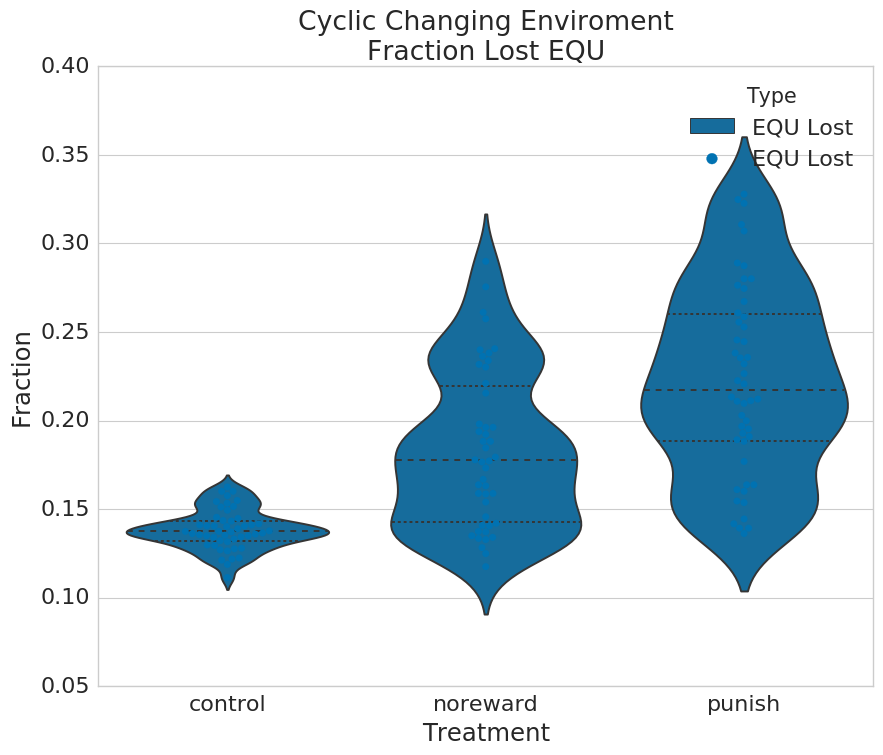

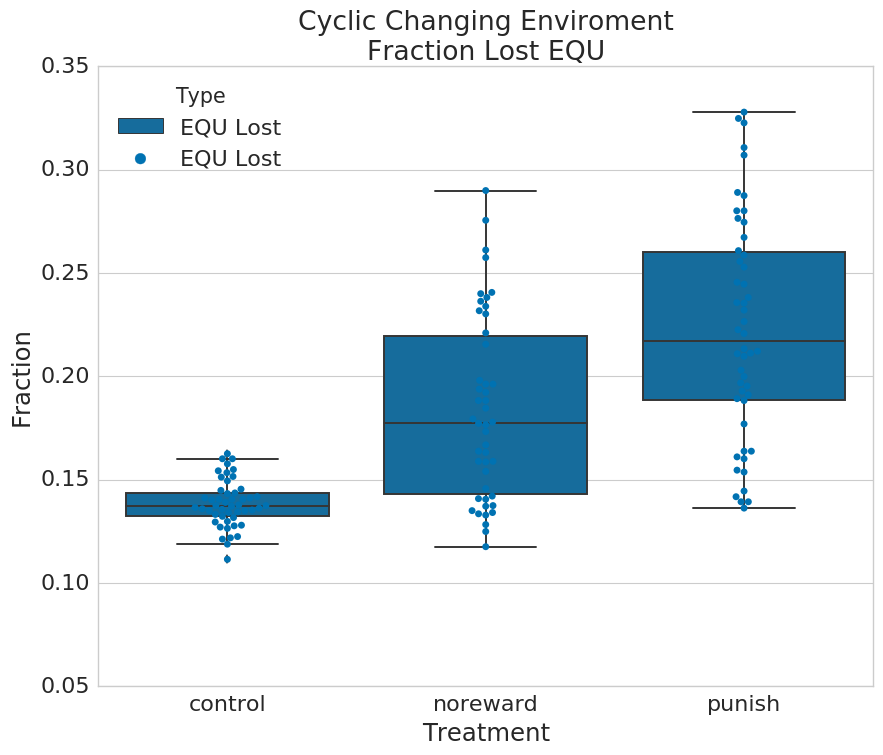

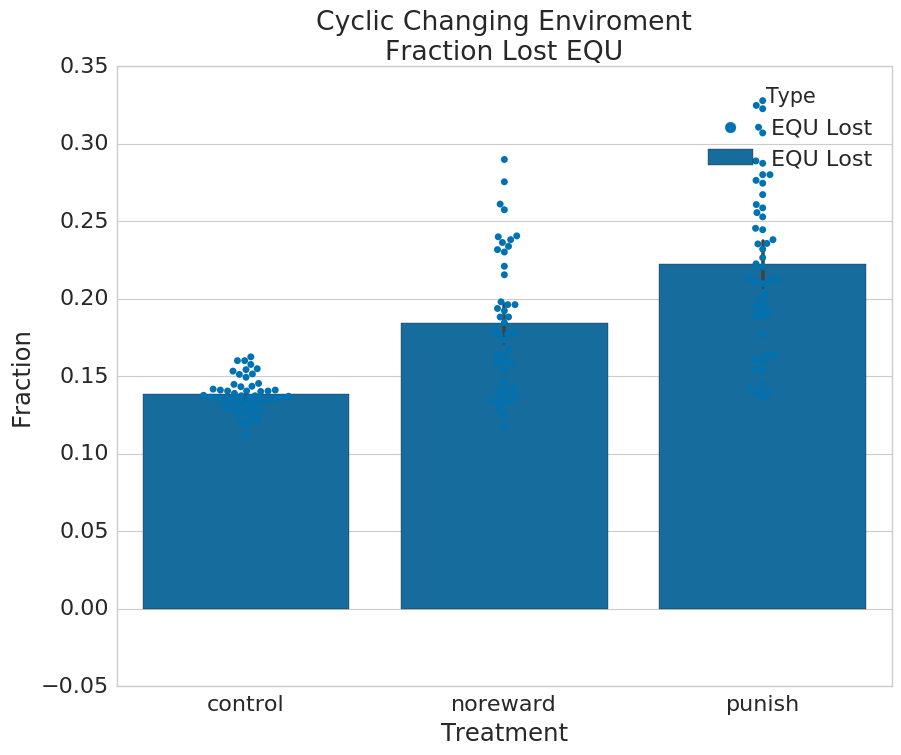

In [69]:
subdir = "../203_CyclicCE__MutLandscape_1Step/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
                names=["EQU Lost"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Cyclic Changing Enviroment\nFraction Lost EQU")
sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Cyclic Changing Enviroment\nFraction Lost EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Cyclic Changing Enviroment\nFraction Lost EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/control/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/noreward/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/punish/data/mutation_landscape_metrics.csv


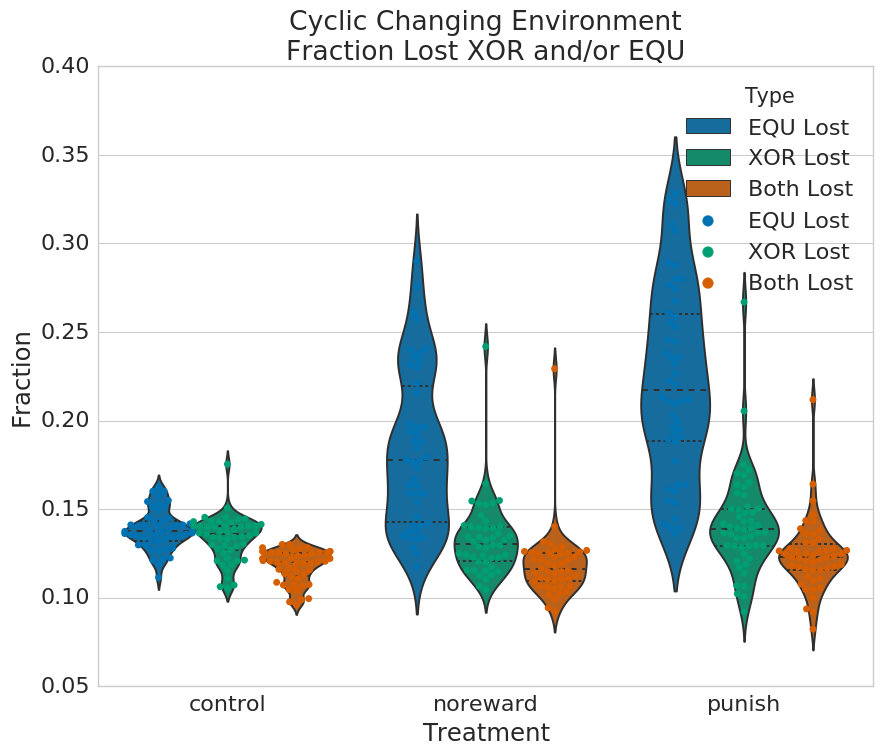

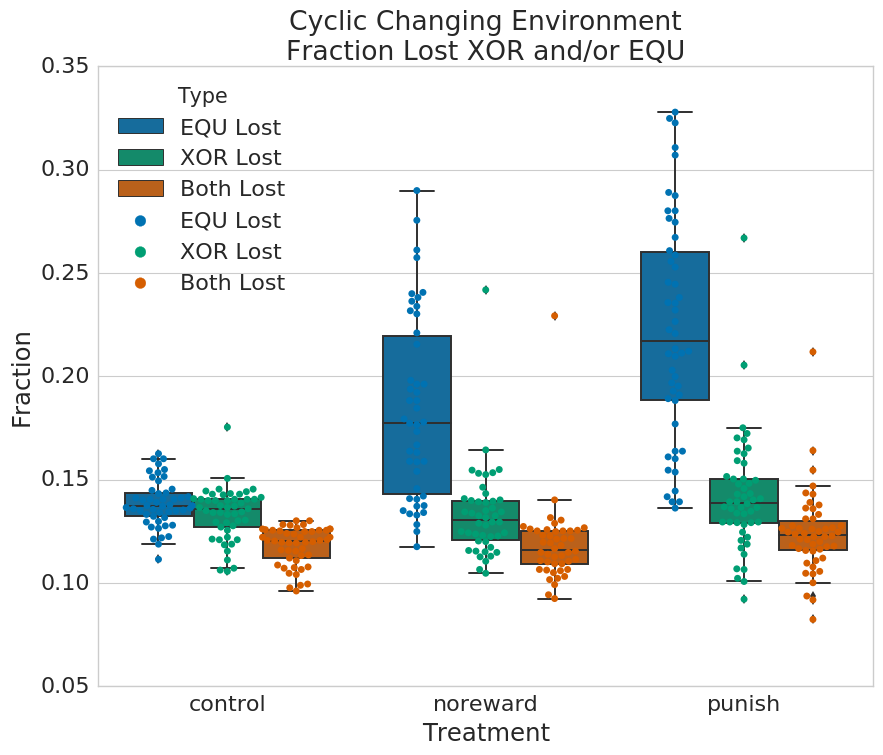

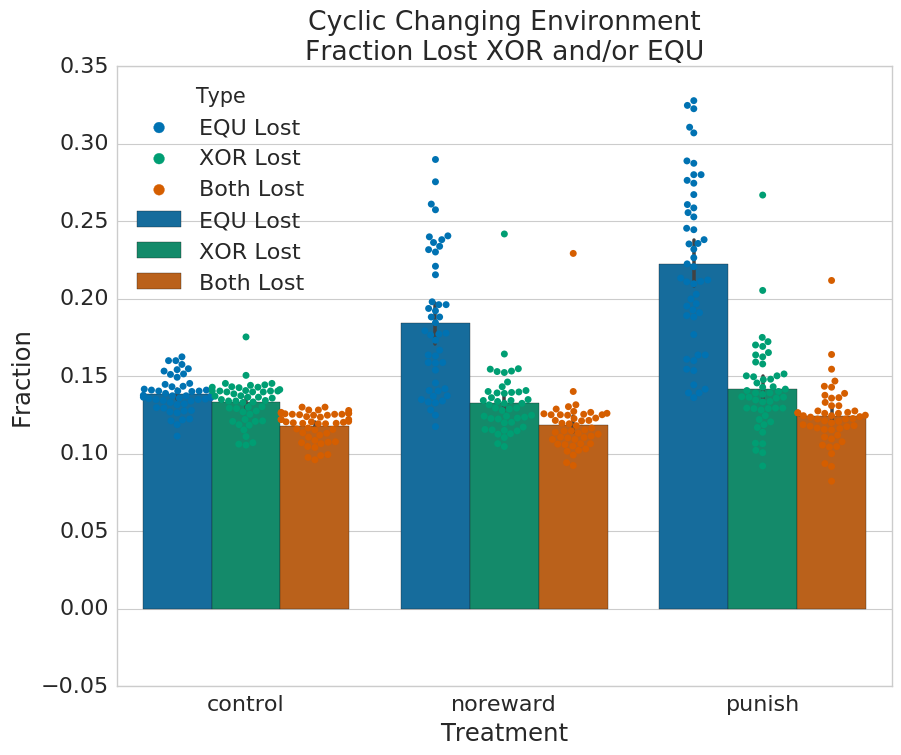

In [68]:
subdir = "../203_CyclicCE__MutLandscape_1Step/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[10, 11,
                                                              12
                                                             ],
                names=["XOR Lost", "EQU Lost"
                       , "Both Lost"
                      ],
                comment="#",
                skip_blank_lines=True,
                )
    
#     df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
#             names=["EQU Lost"],
#             comment="#",
#             skip_blank_lines=True,
#             )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
order = ["EQU Lost","XOR Lost","Both Lost"]
sns.violinplot(x="Treatment", y="Fraction", hue='Type', hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )


/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/control/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/noreward/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../203_CyclicCE__MutLandscape_1Step/punish/data/mutation_landscape_metrics.csv


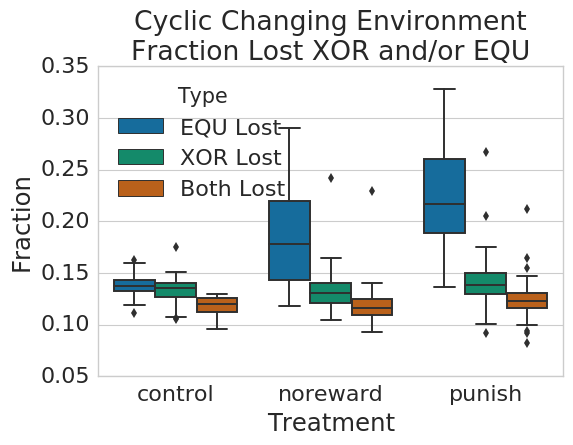

In [109]:
subdir = "../203_CyclicCE__MutLandscape_1Step/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[10, 11,
                                                              12
                                                             ],
                names=["XOR Lost", "EQU Lost"
                       , "Both Lost"
                      ],
                comment="#",
                skip_blank_lines=True,
                )
    
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (6, 4)
sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
order = ["EQU Lost","XOR Lost","Both Lost"]
sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )


## Figure 7 Old & Dev

### Dev

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/control__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/noreward__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/punish__mutation_landscape_metrics.csv
           Type  Fraction Treatment
0  Regained EQU  0.009795   control
1  Regained EQU  0.009795   control
2  Regained EQU  0.003061   control
3  Regained EQU  0.009795   control
4  Regained EQU  0.003061   control
               Type  Fraction Treatment
15990  Regained EQU  0.011938    punish
15991  Regained EQU  0.011938    punish
15992  Regained EQU  0.018978    punish
15993  Regained EQU  0.011325    punish
15994  Regained EQU  0.011325    punish


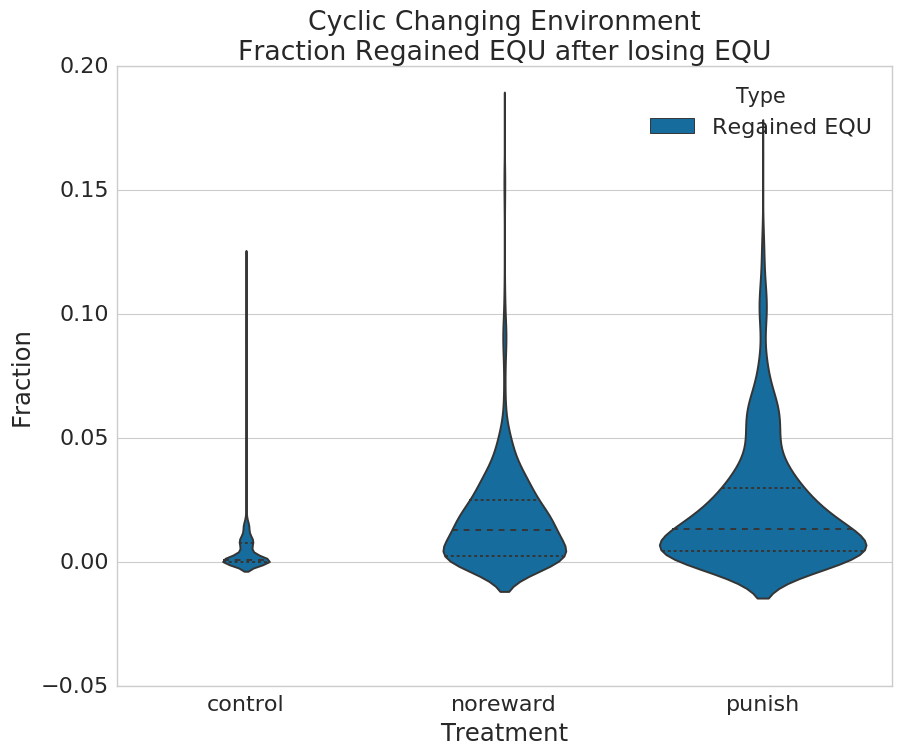

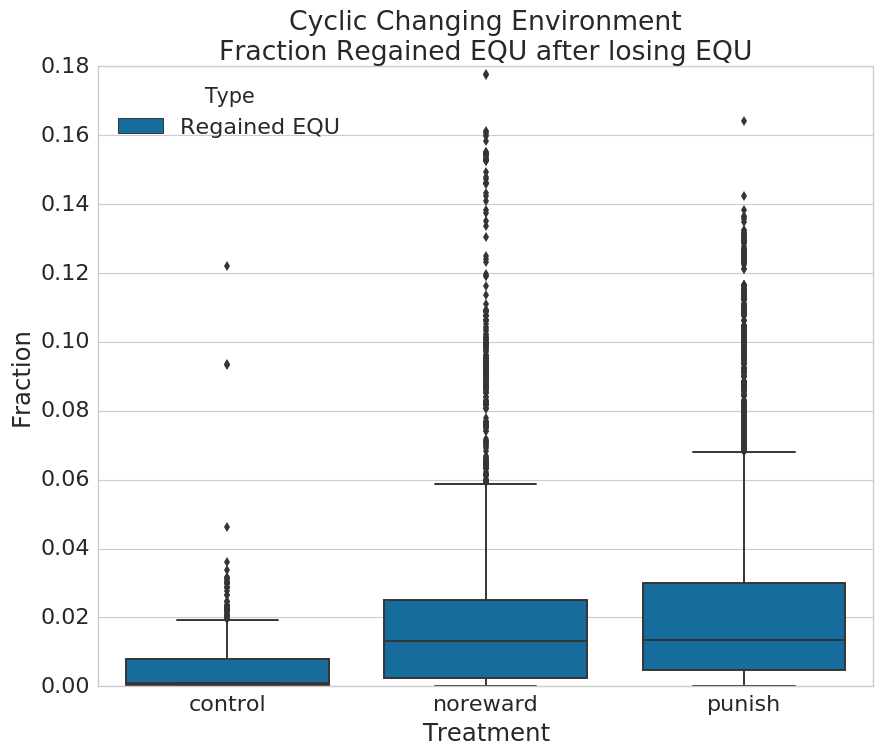

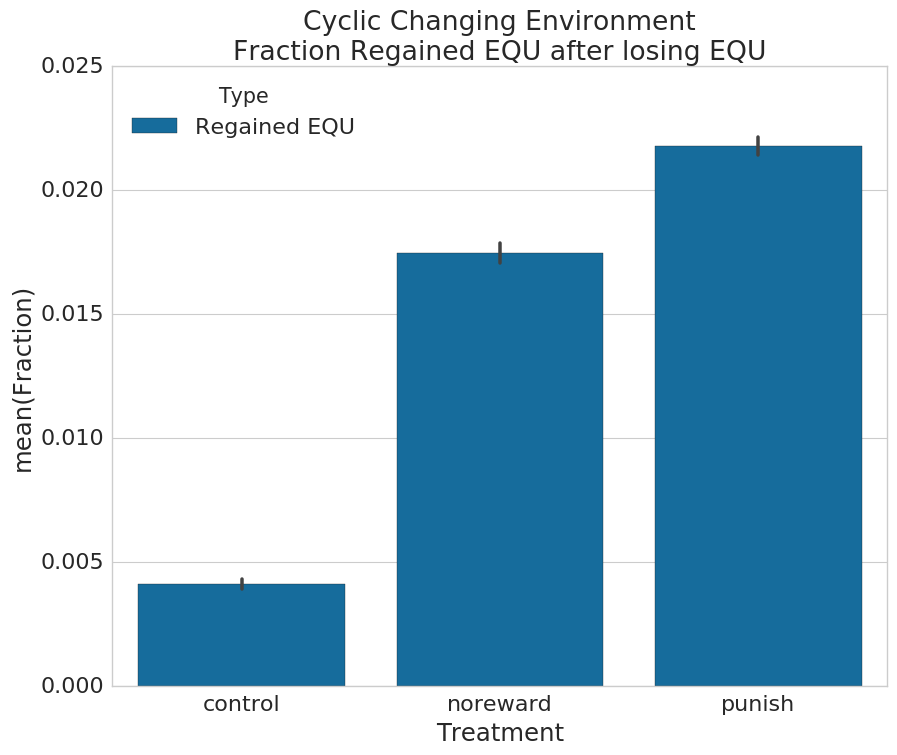

In [21]:
subdir = "../205_CyclicCE__MutLandscape_2ndStep/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "__mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[8],
                names=["Regained EQU"],
                comment="#",
                skip_blank_lines=True,
                )

    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)
print bigdf.head()
print bigdf.tail()

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Cyclic Changing Environment\nFraction Regained EQU after losing EQU"
sns.plt.title(title)
order = ["Regained EQU"]
ax = sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
#ax.set_ylim([0,0.02])
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
# sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
sns.plt.title(title)
    # sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
            hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )


### Old

#### ALife CE Figure

    rosiec@Loki:/Volumes/rosiec/__research/devolab_research/evolution_of_modularity/raw_data/085$ python ../../../scripts/graph_generation/bar_chart_from_csv.py 
    --groups 3 
    --xticks "Control,Control,Hostile" 
    --columns "3" 
    --pair --title "Fraction of Second-step Mutants that Regained Fluctuating Task" 
    --ylabel "Fraction" --xlabel "Treatment" --separator "," --show --error 
    two_step__regained_fluct.png 
    c*_i/mutation_landscape_metrics.csv 
    n*_i/mutation_landscape_metrics.csv 
    p*_i/mutation_landscape_metrics.csv &

control
noreward
punish
~/Dropbox/School_Docs/Research/research_scripts/graph_generation/bar_chart_from_csv.py --error --xsize 1000 --ysize 500 --groups 3 --xticks "Static (control),Benign,Harsh" --columns "3" --pair --title "Fraction of 2-Step Mutants That Regained EQU 
" --ylabel "Fraction of Mutants" --xlabel "Treatment Environment" --separator "," twostep_regained_fluct.png ../../085/c*_i/mutation_landscape_metrics.csv ../../085/n*_i/mutation_landscape_metrics.csv ../../085/p*_i/mutation_landscape_metrics.csv 


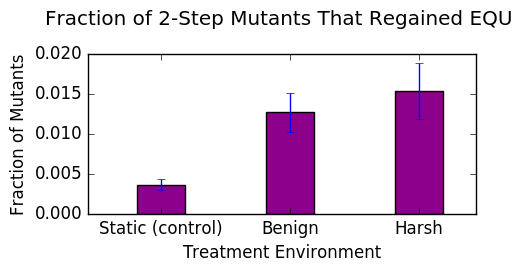

In [15]:
datafiles = ""
subdir = "../../085"
for treatment in treatments:
    print (treatment)
    datafiles += subdir + "/" + treatment[0] + "*_i/mutation_landscape_metrics.csv "
    #datafiles += 'average.dat 4 "../' + treatment + '_*/data*/" "' 
    #datafiles += "_".join(treatments[treatment].split(" ")) + '" '  

script = scripts_path + 'graph_generation/bar_chart_from_csv.py '
script += '--error '
script += '--xsize 1000 --ysize 500 '
script += '--groups 3 --xticks "Static (control),Benign,Harsh" ' 
script += '--columns "3" '
#script += '--legend "EQU Only,XOR Only,XOR & EQU" ' 
script += '--pair --title "Fraction of 2-Step Mutants That Regained EQU \n" '
script += '--ylabel "Fraction of Mutants" --xlabel "Treatment Environment" '
script += '--separator "," '
script += 'twostep_regained_fluct.png '
script += datafiles
#script += 'c*_degenerate_site_count.csv n*_degenerate_site_count.csv p*_degenerate_site_count.csv '

print (script)

!python2 $script

ipyImage('twostep_regained_fluct.png') 


/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../085/c_i/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../085/n_i/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../085/p_i/mutation_landscape_metrics.csv


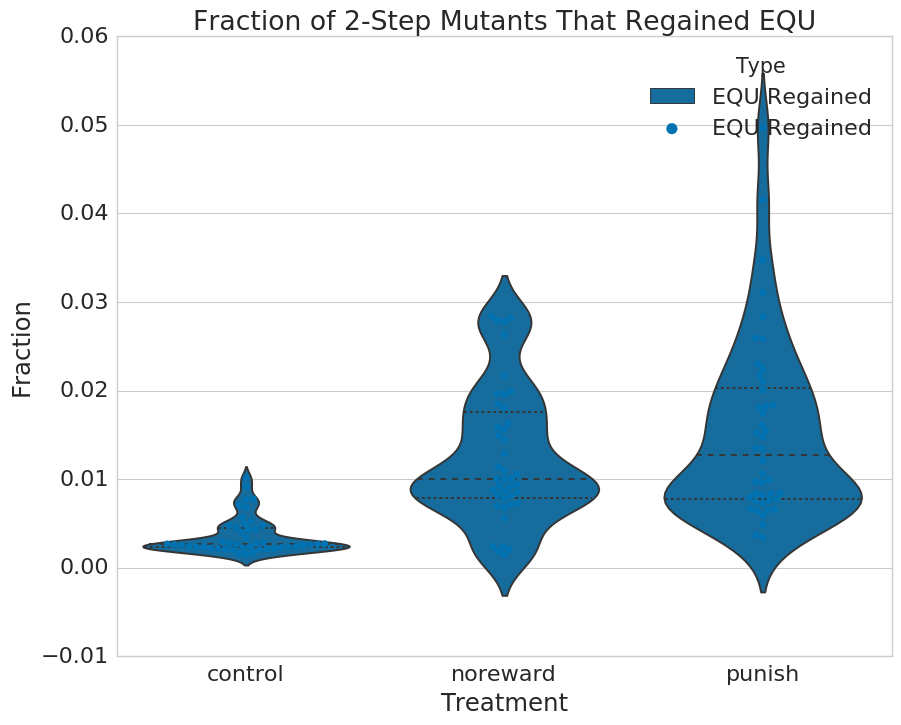

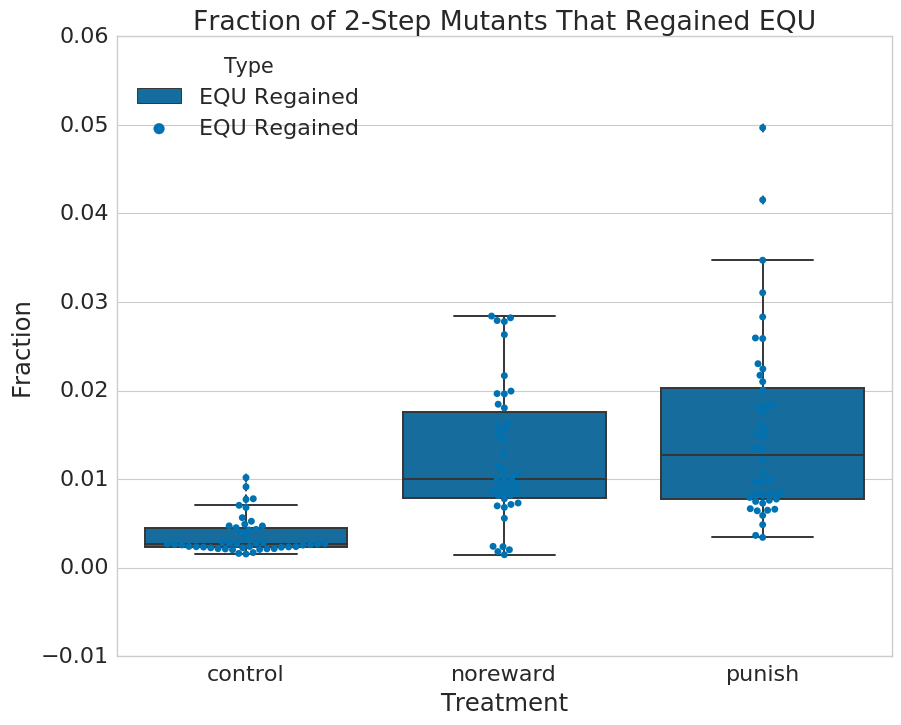

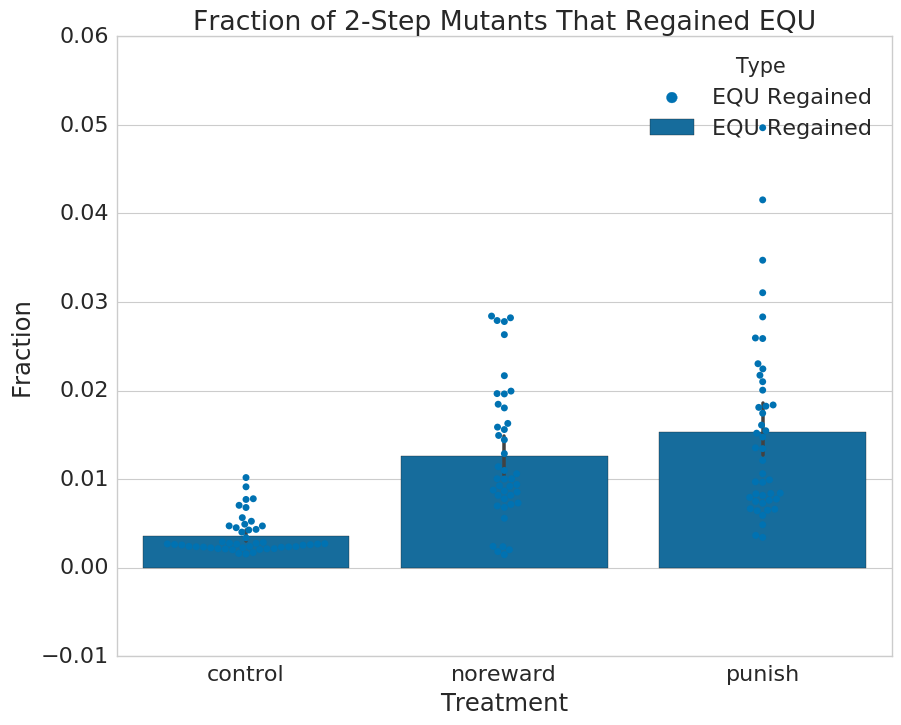

In [47]:
#subdir = "last_common_ancestor_mutation_landscapes/"
subdir = "../085"

dfs = []
for treatment in treatments:
    #print (treatment)
    #filepath = data_path + "/" + subdir + treatment + "_intertwined/mutation_landscape_metrics.csv"
    filepath = data_path + "/" + subdir + "/" + treatment[0] + "_i/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, usecols=[2], names=["EQU Regained"],
                sep=",", header=None, comment="#", skip_blank_lines=True,)
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Fraction of 2-Step Mutants That Regained EQU")
#order = ["EQU Lost","XOR Lost","Both Lost"]
sns.violinplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction of 2-Step Mutants That Regained EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction of 2-Step Mutants That Regained EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=bigdf, 
               split=True, 
               )


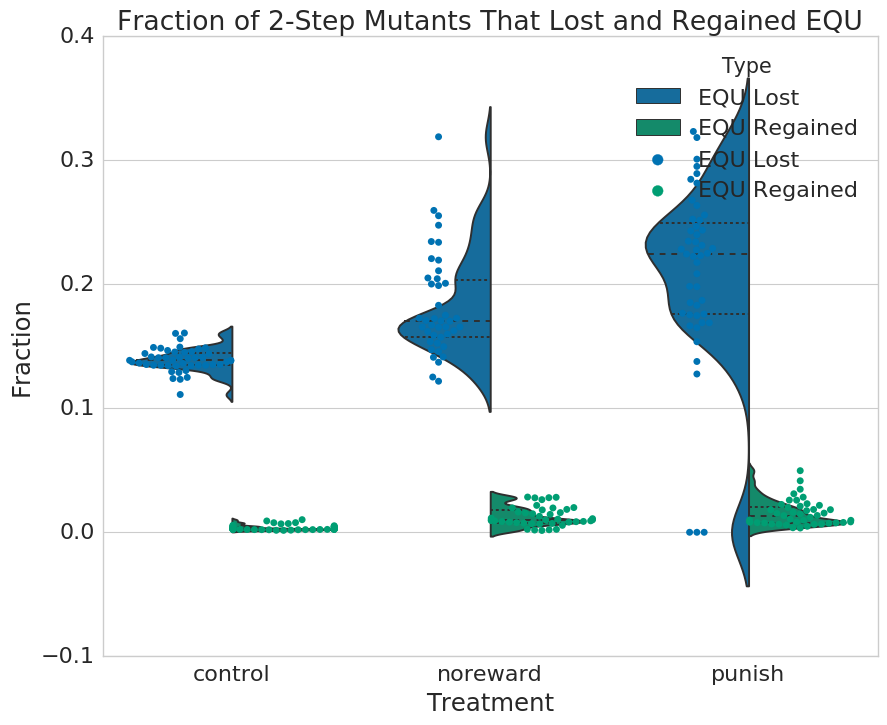

In [54]:
subdir = "last_common_ancestor_mutation_landscapes/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_intertwined/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    #print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
                names=["EQU Lost"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
equ_lost = pd.concat(dfs)

#subdir = "last_common_ancestor_mutation_landscapes/"
subdir = "../085"

dfs = []
for treatment in treatments:
    #print (treatment)
    #filepath = data_path + "/" + subdir + treatment + "_intertwined/mutation_landscape_metrics.csv"
    filepath = data_path + "/" + subdir + "/" + treatment[0] + "_i/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    #print filepath

    df = pd.read_csv(filepath, usecols=[2], names=["EQU Regained"],
                sep=",", header=None, comment="#", skip_blank_lines=True,)
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
equ_regained = pd.concat(dfs)

together = pd.concat([equ_lost, equ_regained])


sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Fraction of 2-Step Mutants That Lost and Regained EQU")
#order = ["EQU Lost","XOR Lost","Both Lost"]
sns.violinplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order,
               data=together, 
               split=True,
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', #hue_order=order, 
               data=together, 
               split=True, 
               )


### New/Dev

#### 2-Step, Pulled from MutLand:203_CE

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/control__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/noreward__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../205_CyclicCE__MutLandscape_2ndStep/punish__mutation_landscape_metrics.csv
           Type  Fraction Treatment
0  Regained EQU  0.009795   control
1  Regained EQU  0.009795   control
2  Regained EQU  0.003061   control
3  Regained EQU  0.009795   control
4  Regained EQU  0.003061   control
               Type  Fraction Treatment
15990  Regained EQU  0.011938    punish
15991  Regained EQU  0.011938    punish
15992  Regained EQU  0.018978    punish
15993  Regained EQU  0.011325    punish
15994  Regained EQU  0.011325    punish


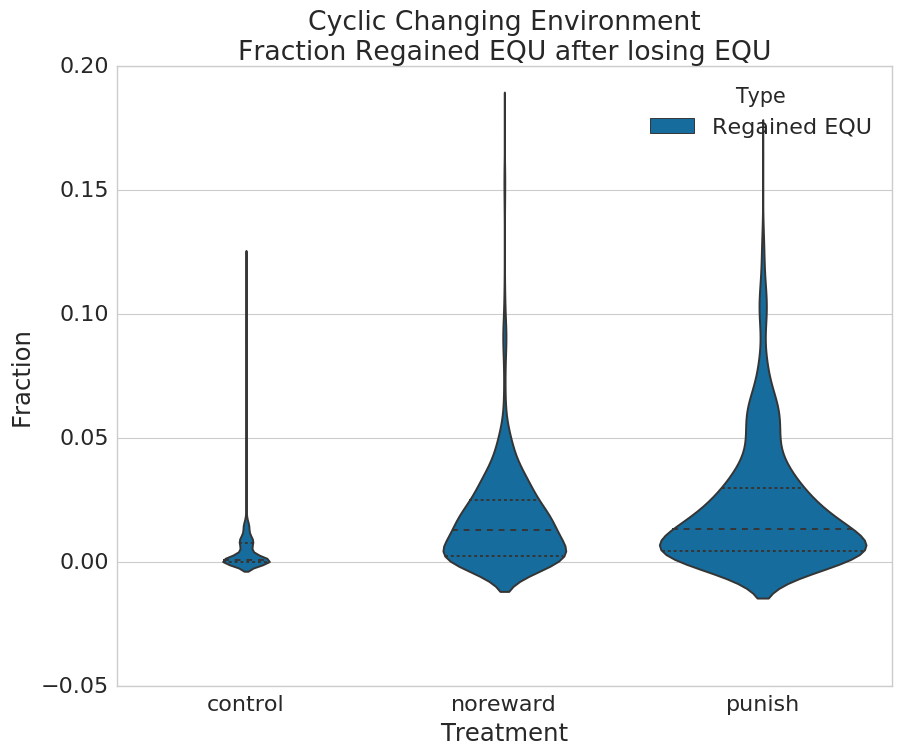

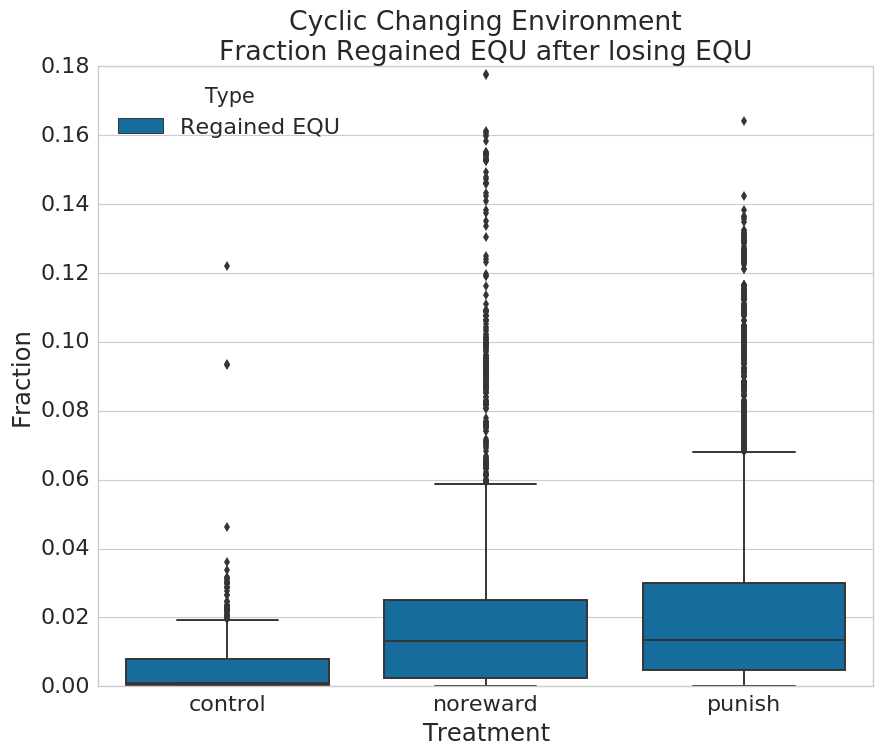

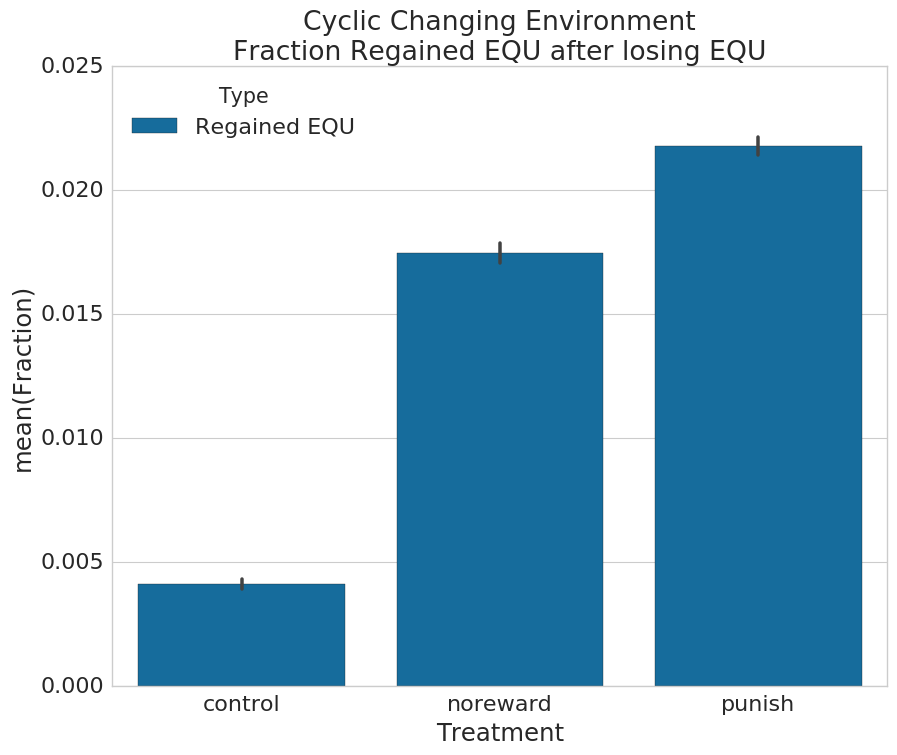

In [21]:
subdir = "../205_CyclicCE__MutLandscape_2ndStep/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "__mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[8],
                names=["Regained EQU"],
                comment="#",
                skip_blank_lines=True,
                )

    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)
print bigdf.head()
print bigdf.tail()

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Cyclic Changing Environment\nFraction Regained EQU after losing EQU"
sns.plt.title(title)
order = ["Regained EQU"]
ax = sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
#ax.set_ylim([0,0.02])
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
# sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
sns.plt.title(title)
    # sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
            hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )


## Figure 8 Devel

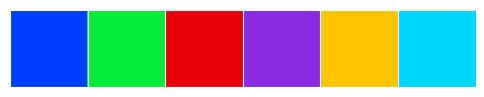

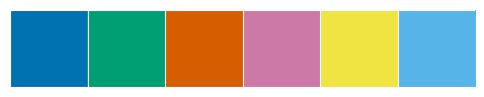

In [165]:
sns.palplot(sns.color_palette("bright"))
sns.palplot(sns.color_palette("colorblind"))

### Dominant Only D_p and D_g

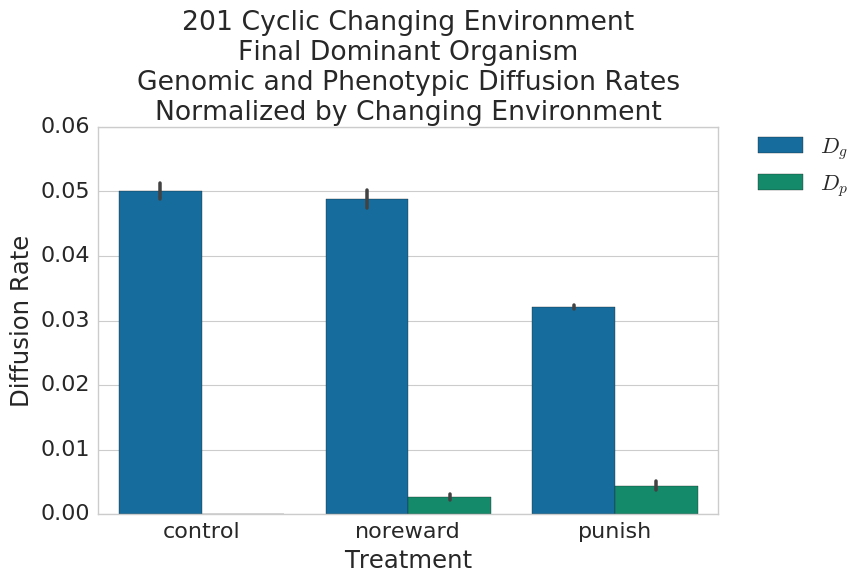

In [64]:
subdir = "../201_CyclicCE/"

    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial",
          #"whitenodes_cts_lethal", "whitenodes_cts_deleterious", "whitenodes_cts_neutral", "whitenodes_cts_beneficial",
          #"blacknodes_cts_lethal", "blacknodes_cts_deleterious", "blacknodes_cts_neutral", "blacknodes_cts_beneficial"
         ]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

#subts = {"control_intertwined": ['rewarded'],
#         "noreward_intertwined": ['rewarded', 'noreward'], 
#         "punish_intertwined": ['rewarded', 'punished']}

#print treatments

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_dominant/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2010" + bit + '_*.network_metrics.csv'
        
#        print final
        
        dfiles = sorted(glob.glob(final))

#        print dfiles
        #print
        
        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
#            print item
#            dta = pd.read_csv(item, header=None, comment="#", 
#                              skipinitialspace=True, names=fields)
            dta = pd.read_csv(item, header=None, comment="#", skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            #print dta.head()
            #break
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])
            #print dta.head()

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            #print nu_g, nu_p
            #print F_neut, F_pheno

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
        #break
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = ['D_g']*len(D_gs)
    dta['Treatment'] = [t]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = ['D_p']*len(D_ps)
    dta['Treatment'] = [t]*len(D_ps)
    dfs.append(dta)
    
    dta_joint = pd.DataFrame()
    dta_joint['D_g']= D_gs
    dta_joint['D_p'] = D_ps
    dta_joint['Treatment'] = [t]*len(D_ps)

    dfs_joint.append(dta_joint)
    
    
    
diffusion_rates = pd.concat(dfs, axis=0)
diffusion_rates_joint = pd.concat(dfs_joint, axis=0)
#print diffusion_rates.head()  
#print diffusion_rates.tail()    

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (8, 5)
ax1 = sns.barplot(x="Treatment", y="Diffusion Rate", hue="Metric", data=diffusion_rates)
ax1.set_ylim([0,0.06])

handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles, [r'$D_g$',r'$D_p$'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax1.set_title("201 Cyclic Changing Environment\nFinal Dominant Organism\nGenomic and Phenotypic Diffusion Rates\nNormalized by Changing Environment")
ax1.set_ylabel("Diffusion Rate")
#ax1.set_ylim([-0.2,0.6])

### Whole Population D_p and D_g

   Diffusion Rate Metric Treatment
0        0.021873    D_g   control
1        0.017177    D_g   control
2        0.023240    D_g   control
3        0.037189    D_g   control
4        0.023834    D_g   control
    Diffusion Rate Metric Treatment
44        0.007853    D_p    punish
45        0.006098    D_p    punish
46        0.005801    D_p    punish
47        0.004499    D_p    punish
48        0.006976    D_p    punish


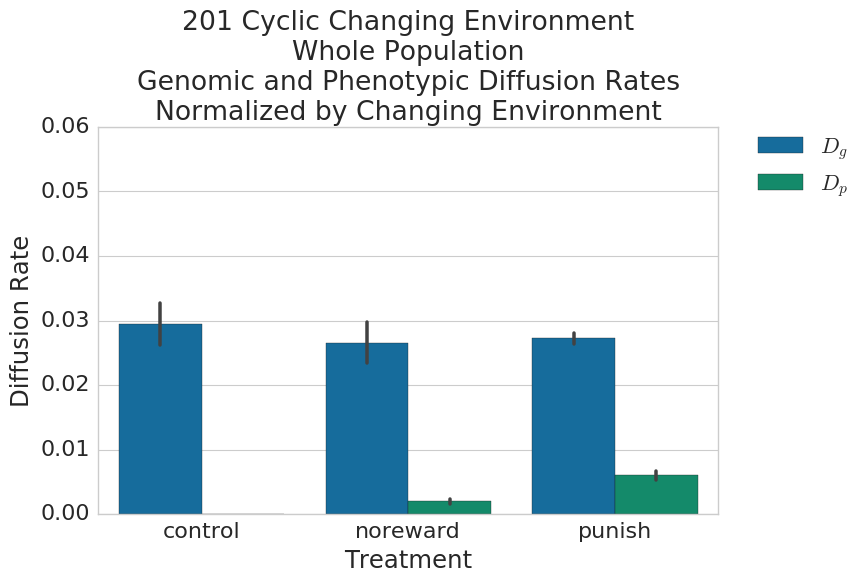

In [63]:
subdir = "../201_CyclicCE/"

    
    
## CALCULATE Genomic Diffusion Rate and Phenotypic Diffusion Rate
fields = ["num_cpus", "lethal", "deleterious", "neutral", "beneficial", 
          "same_p_lethal", "same_p_deleterious", "same_p_neutral", "same_p_beneficial", 
          "diff_p_lethal", "diff_p_deleterious", "diff_p_neutral", "diff_p_beneficial",
         ]
## defaults
mu = 0.00075 # per-site copy mutation rate -- R_c in the paper
l = 121 # genome length
D = 26 # inst-set size        
### Fidelity -- probability of birthing a genetically unchanged offspring
F = (1 - mu)**l

dfs = []
dfs_joint = []

for t in treatments:  
    
    D_gs = []
    D_ps = []

    for i in range(1, 50): 
        bit = str(i).zfill(2)
        filepath = data_path + "/" + subdir + "/network_metrics_wholepop/metrics"
        filepath = filepath.replace("\\", "")
        final = filepath + '/*' + t + "*_2010" + bit + '_*.network_metrics.csv'
        
        #print final
        
        dfiles = sorted(glob.glob(final))

        #print dfiles
        #print
        
        D_g_pair = []
        D_p_pair = []
        for item in dfiles:
            #print item

            dta = pd.read_csv(item, header=None, comment="#", 
                              delimiter=",",
                              skipinitialspace=True, 
                              names=fields, usecols=range(0,len(fields)))
    
            #print dta.head()
            #break
    
            nu_g = np.mean(dta['neutral'] + dta['beneficial'])
            nu_p = np.mean(dta['same_p_neutral'] + dta['same_p_beneficial'])
            #print dta.head()

            f_c_prob_nonneut = mu * (1 - nu_g)
            F_neut = (1 - f_c_prob_nonneut)**l

            f_cp_prob_nonneut_diffphen = mu * (1 - nu_p)
            F_pheno = (1 - f_cp_prob_nonneut_diffphen)**l

            #print nu_g, nu_p
            #print F_neut, F_pheno

            aD_g = F_neut - F
            aD_p = F_neut - F_pheno        

            D_g_pair.append(aD_g)
            D_p_pair.append(aD_p)
        #break
        if len(dfiles) > 1 or (len(dfiles) == 1 and t == "control"): ## make sure there's something here            
            D_g = np.mean(D_g_pair)
            D_p = np.mean(D_p_pair)

            D_gs.append(D_g)
            D_ps.append(D_p)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_gs
    dta['Metric'] = ['D_g']*len(D_gs)
    dta['Treatment'] = [t]*len(D_gs)    
    dfs.append(dta)

    dta = pd.DataFrame()
    dta['Diffusion Rate'] = D_ps
    dta['Metric'] = ['D_p']*len(D_ps)
    dta['Treatment'] = [t]*len(D_ps)
    dfs.append(dta)
    
    dta_joint = pd.DataFrame()
    dta_joint['D_g']= D_gs
    dta_joint['D_p'] = D_ps
    dta_joint['Treatment'] = [t]*len(D_ps)

    dfs_joint.append(dta_joint)
    
    
    
diffusion_rates_201_wholepop = pd.concat(dfs, axis=0)
diffusion_rates_201_wholepop_wide = pd.concat(dfs_joint, axis=0)
print diffusion_rates_201_wholepop.head()  
print diffusion_rates_201_wholepop.tail()  

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (8, 5)
ax1 = sns.barplot(x="Treatment", y="Diffusion Rate", hue="Metric", 
                  data=diffusion_rates_201_wholepop)
ax1.set_ylim([0,0.06])


handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles, [r'$D_g$',r'$D_p$'], bbox_to_anchor=(1.05, 1), 
           loc=2, borderaxespad=0.)

ax1.set_title("201 Cyclic Changing Environment\nWhole Population\nGenomic and Phenotypic Diffusion Rates\nNormalized by Changing Environment")
ax1.set_ylabel("Diffusion Rate")
#ax1.set_ylim([-0.2,0.6])

## Figure 9 Old & Devel

### Vestigial

Generate the lineage maps from the raw data

Note, the raw content being pulled by the script below is not available in this archive. It's a few gigabites in a bunch of teeny tiny files, and will be hosted elsewhere. Please email me if you want access before it's up somewhere.

    rosiec@edi:/Core/home/rosiec/__research/evolution_of_modularity/raw_data/082/INTERTWINED$ for i in *intertwined_82*; do python2 ~/__research/scripts/analysis/extract_task_mappings.py --lineage_map -a ./complete_lineage_maps/$(basename $i)_complete_lineage_map.csv 5 6 8 $i/data/lineage.dat $i/data/phenotype/; done


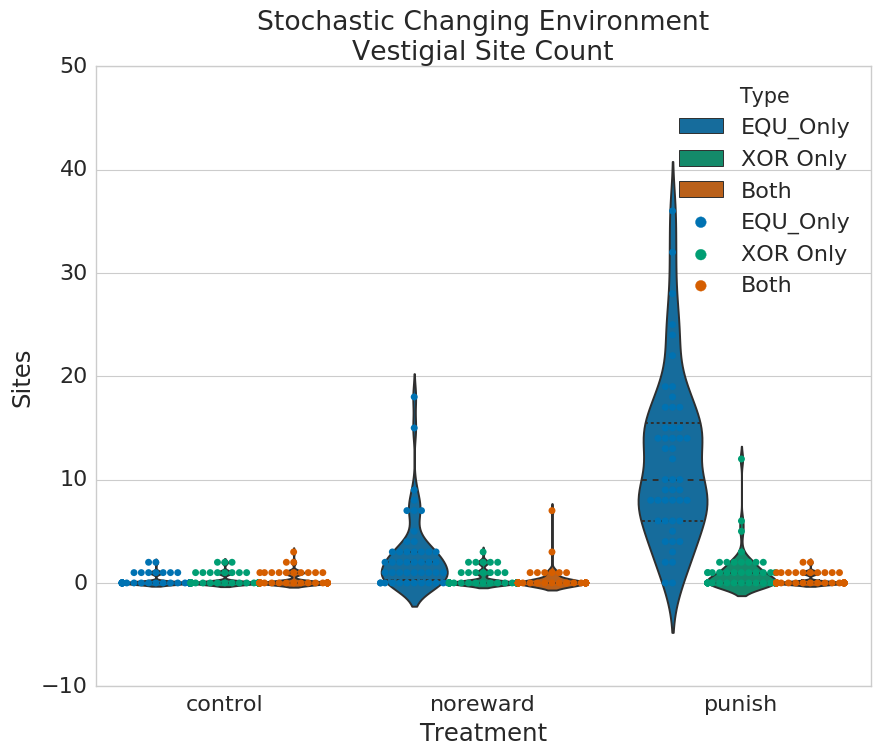

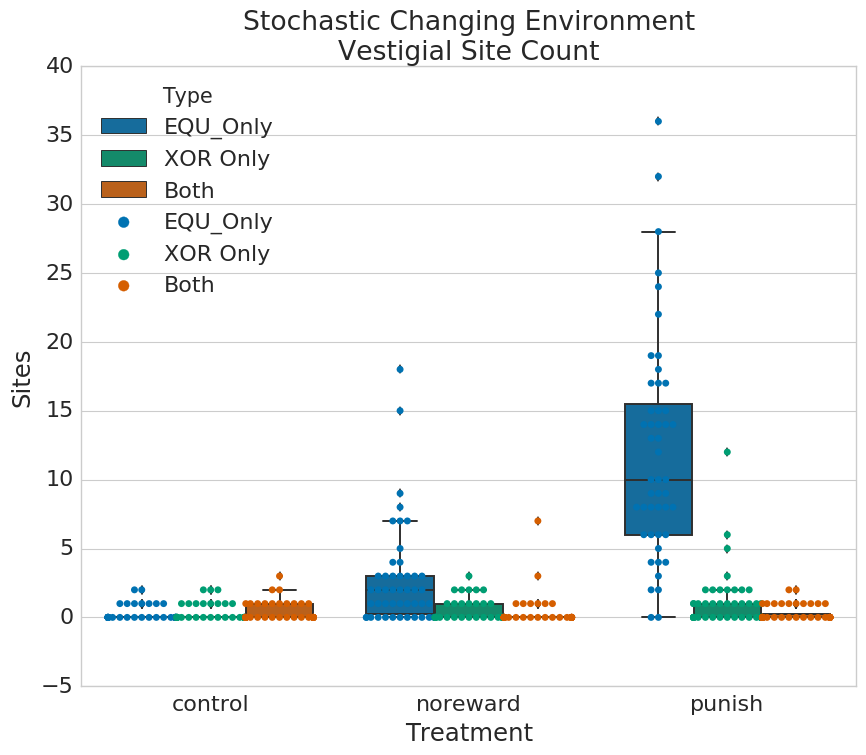

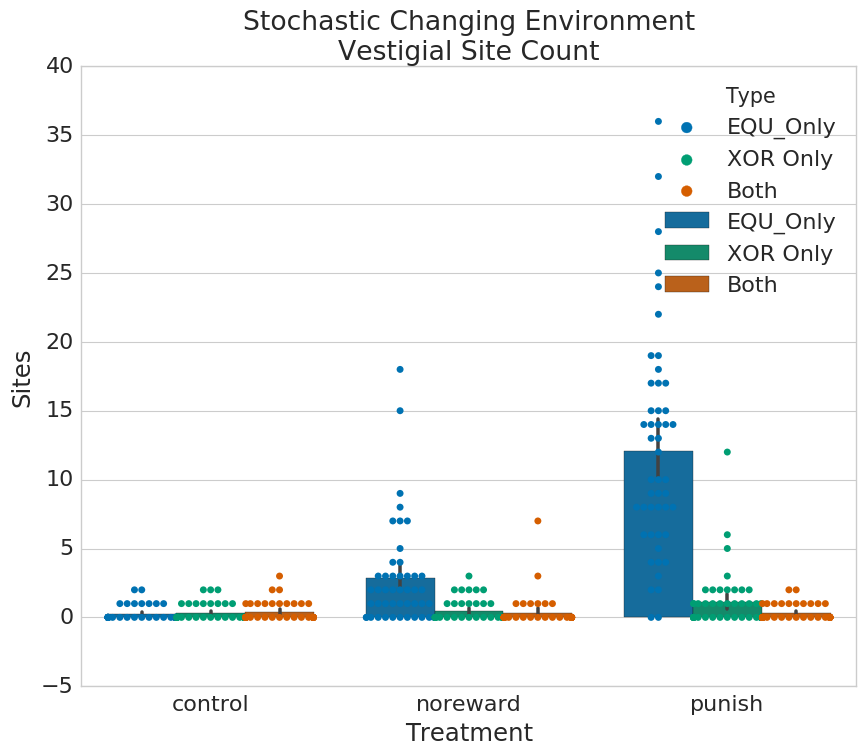

In [83]:
subdir = "../200_StochasticCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Stochastic Changing Environment\nVestigial Site Count"
sns.plt.title(title)
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )





### Active

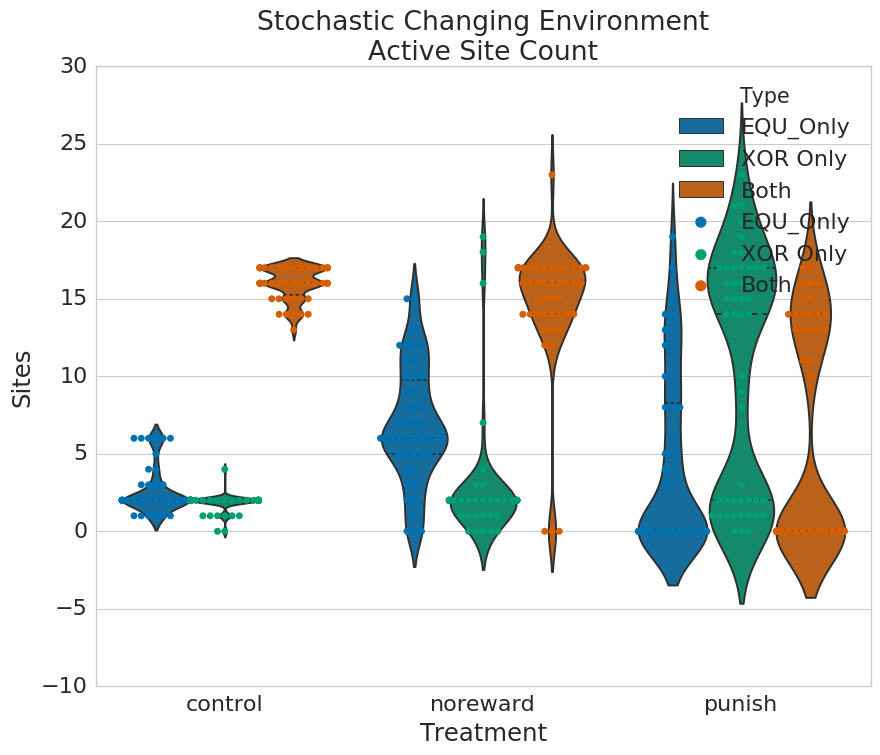

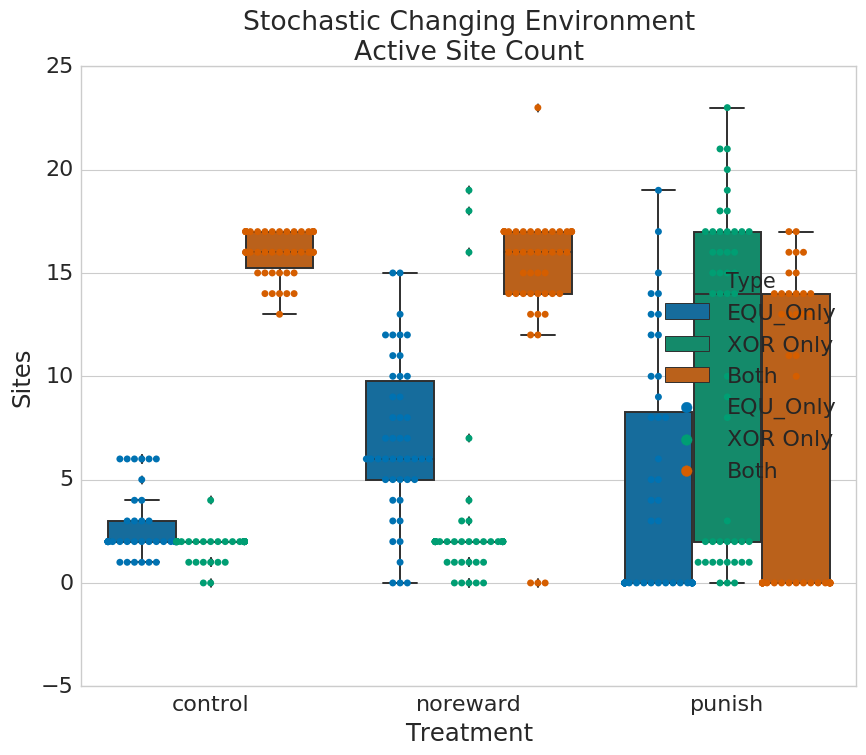

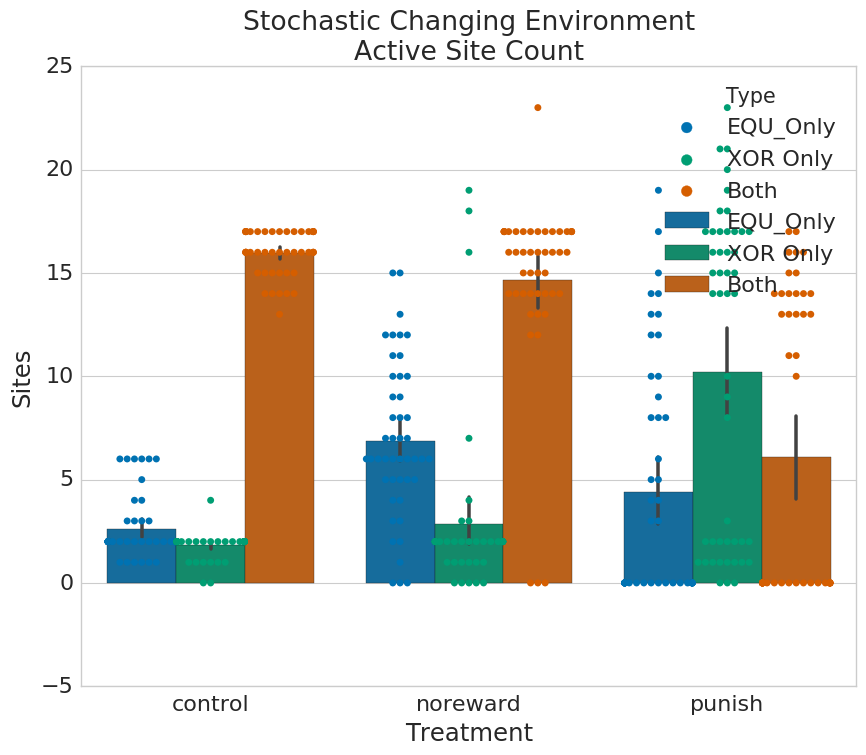

In [81]:
subdir = "../200_StochasticCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Stochastic Changing Environment\nActive Site Count"
sns.plt.title(title)
sns.violinplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               #split=True, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart", 
               
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title(title)
sns.barplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
               data=bigdf, 
               split=True, 
               )





### Combined

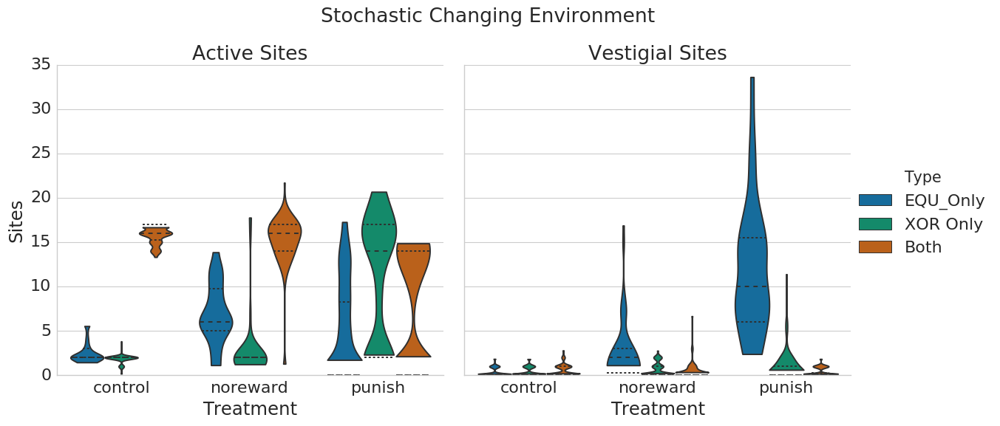

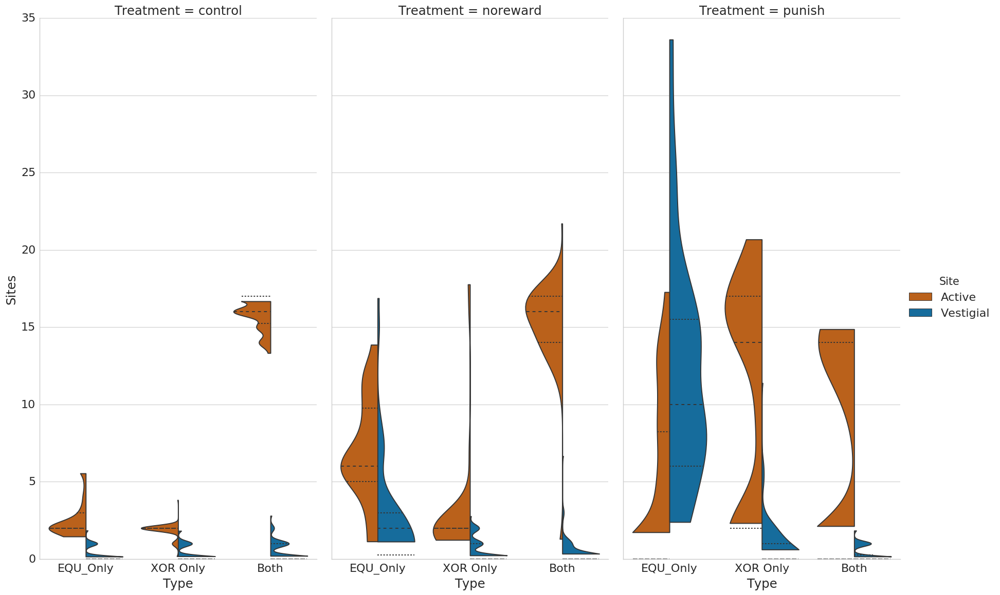

In [137]:
subdir = "../200_StochasticCE/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_active_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    df['Site'] = ["Active"] * len(df)
    dfs.append(df)
    
actives = pd.concat(dfs)

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + "/*" + treatment + "*dominant_vestigial_site_counts.csv"
    filepath = filepath.replace("\\", "")
    #print filepath
    filepath = sorted(glob.glob(filepath))[0]
    
    #print filepath
        
    df = pd.read_csv(filepath, sep=",", header=None, usecols=[0, 1, 2],
                names=["EQU_Only", "XOR Only", "Both"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Sites", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    df['Site'] = ["Vestigial"] * len(df)
    dfs.append(df)
    
vestigials = pd.concat(dfs)

combined = pd.concat([actives, vestigials])

#print combined.head()
#print combined.tail()

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
#plt.rcParams['figure.figsize'] = (10, 8)
title="Stochastic Changing Environment"
#sns.plt.title(title)

g = sns.factorplot(x="Treatment", y="Sites",
               #hue="Site", 
               hue="Type",
               #col="Treatment",
               col="Site",
                data=combined,
               #orient="h",         
               size=6, aspect=1, #palette={"Active": "r", "Vestigial": "b"},
               kind="violin", 
               #split=True, 
               cut=-1, bw=.3, scale="count", scale_hue=False,
               inner="quart"
              )

plt.subplots_adjust(top=0.85)
g.fig.suptitle(title) # can also get the figure from plt.gcf()   

titles = ["Active Sites", "Vestigial Sites"]
for ax, title in zip(g.axes.flat, titles):
    ax.set_title(title)

sns.factorplot(x="Type", y="Sites",
                hue="Site", col="Treatment",
                data=combined,
               #orient="h",         
               size=12, aspect=.5, palette={"Active": "r", "Vestigial": "b"},
               kind="violin", 
               split=True, 
               cut=-1, bw=.3, scale="count", scale_hue=False,
               inner="quart"
              )

# sns.factorplot(x="Type", y="Sites",
#                 hue="Site", col="Treatment",
#                 data=combined,
#                #orient="h",         
#                size=12, aspect=.5, palette="Set4",
#                kind="swarm", split=True, 
#                #cut=-1, bw=.3, scale="count", scale_hue=False,
#                #inner="quart"
#               )
# sns.violinplot(x="Treatment", y="Sites", hue='Type', 
#                data=actives, 
#                #split=True, 
#                scale="count", scale_hue=False, bw=.3,
#                inner="quart", 
               
#                )
# sns.swarmplot(x="Treatment", y="Sites", hue='Type', 
#                data=actives, 
#                split=True, 
#                )






## Figure 10 Old & Devel

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/control_env/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/noreward_env/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/punish_env/data/mutation_landscape_metrics.csv


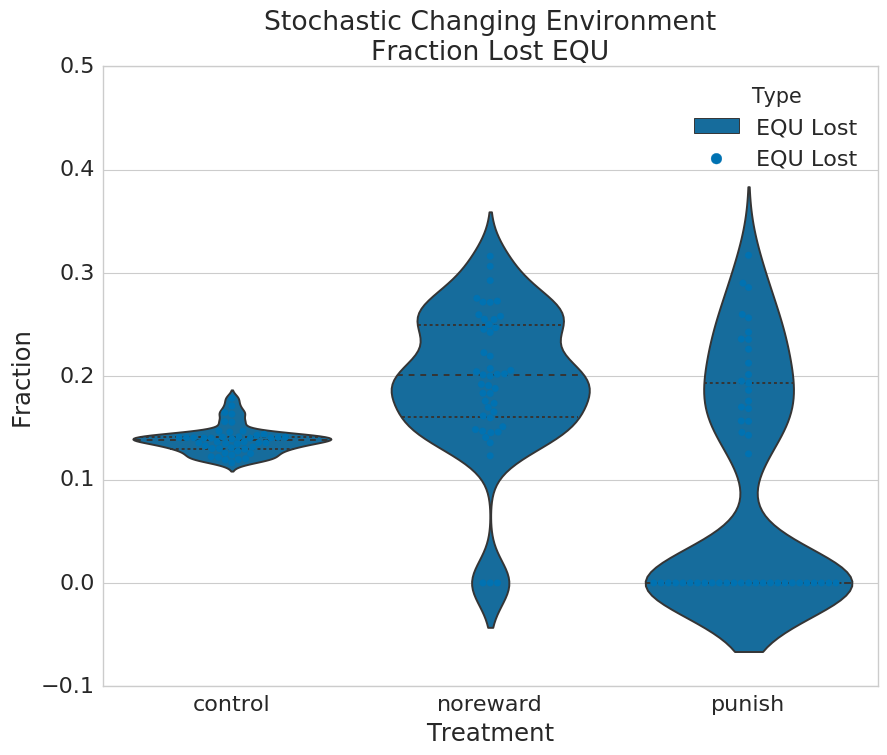

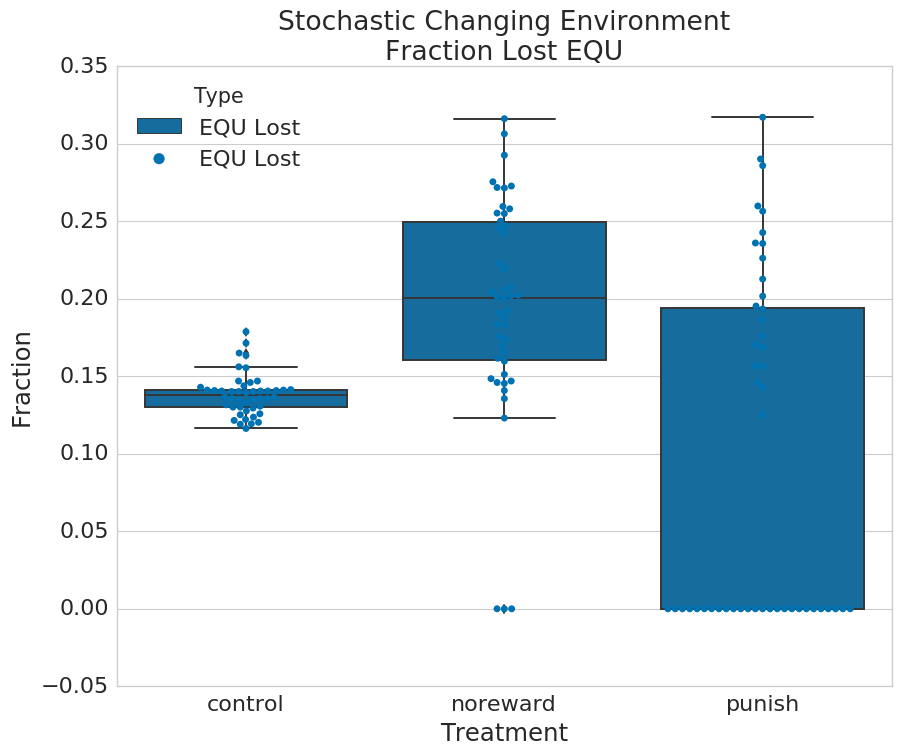

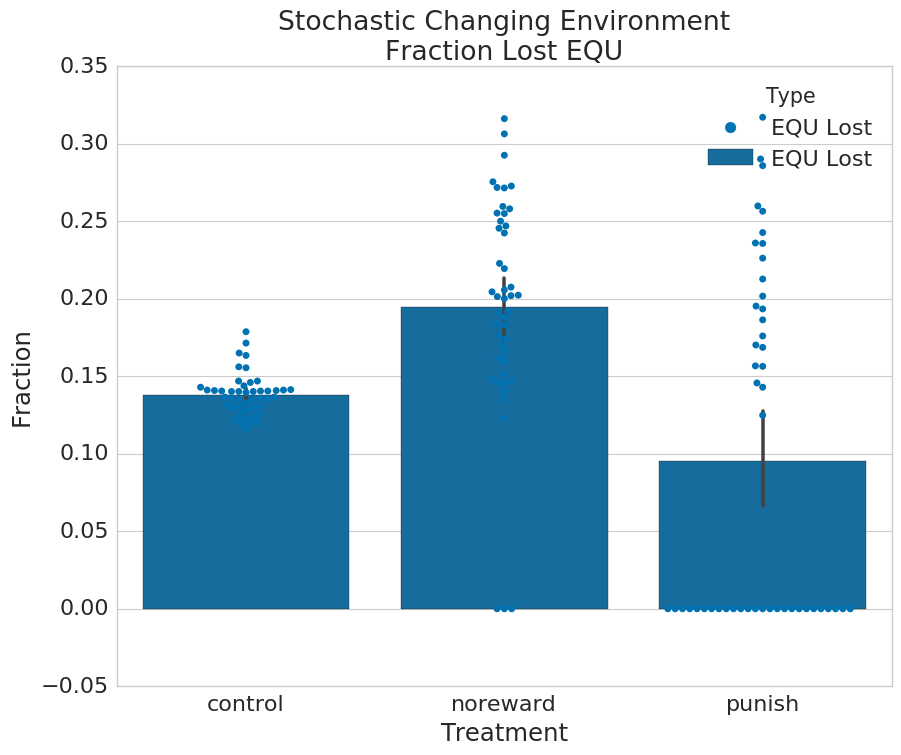

In [67]:
subdir = "../202_StochasticCE__MutLandscape_1Step/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_env/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
                names=["EQU Lost"],
                comment="#",
                skip_blank_lines=True,
                )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Stochastic Changing Environment\nFraction Lost EQU")
sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Stochastic Changing Environment\nFraction Lost EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Stochastic Changing Environment\nFraction Lost EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', 
               data=bigdf, 
               split=True, 
               )

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/control_env/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/noreward_env/data/mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../202_StochasticCE__MutLandscape_1Step/punish_env/data/mutation_landscape_metrics.csv


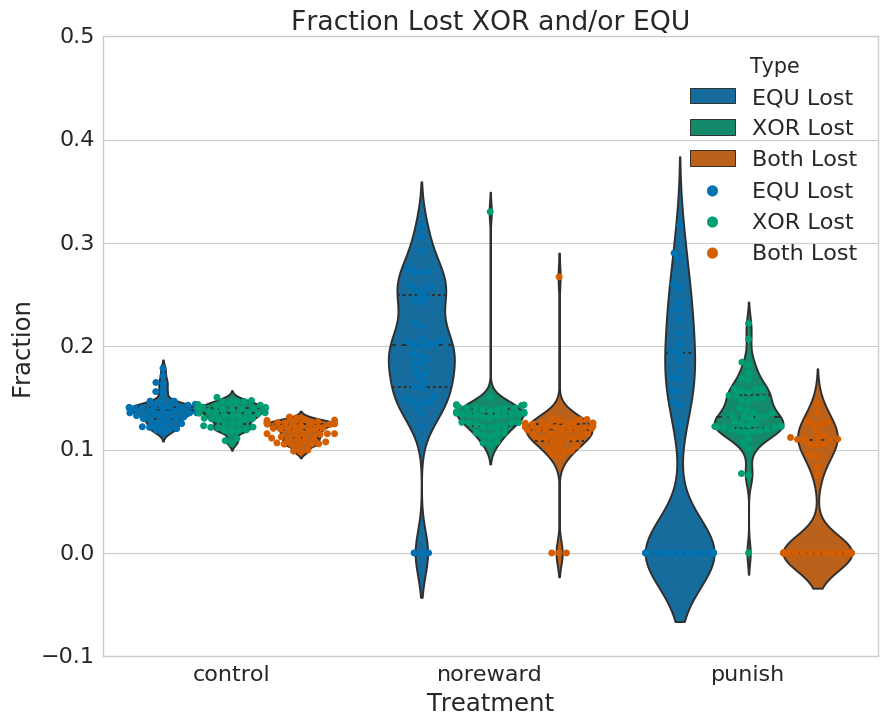

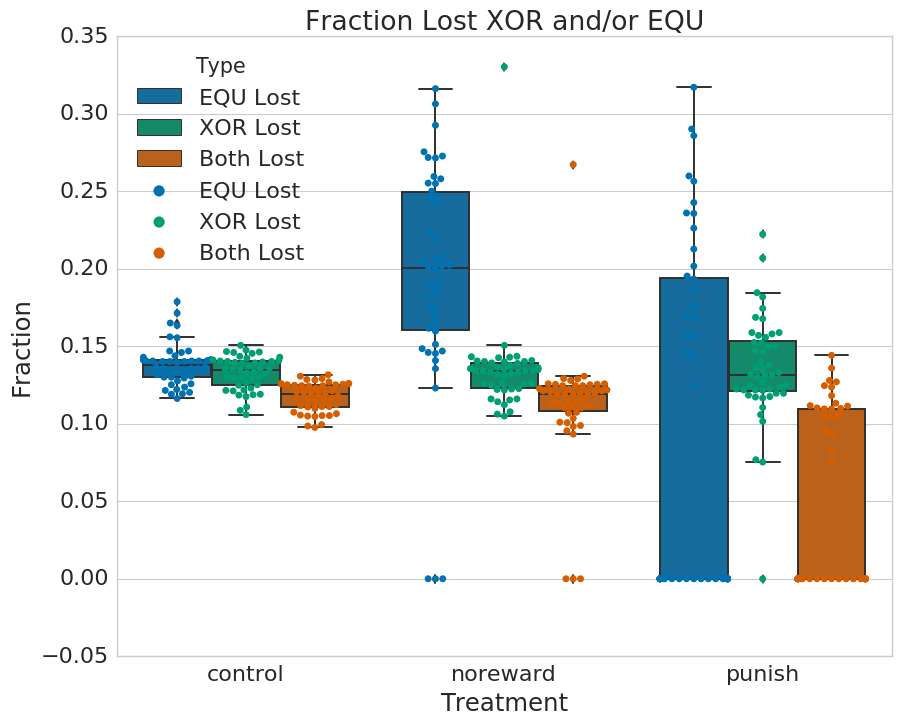

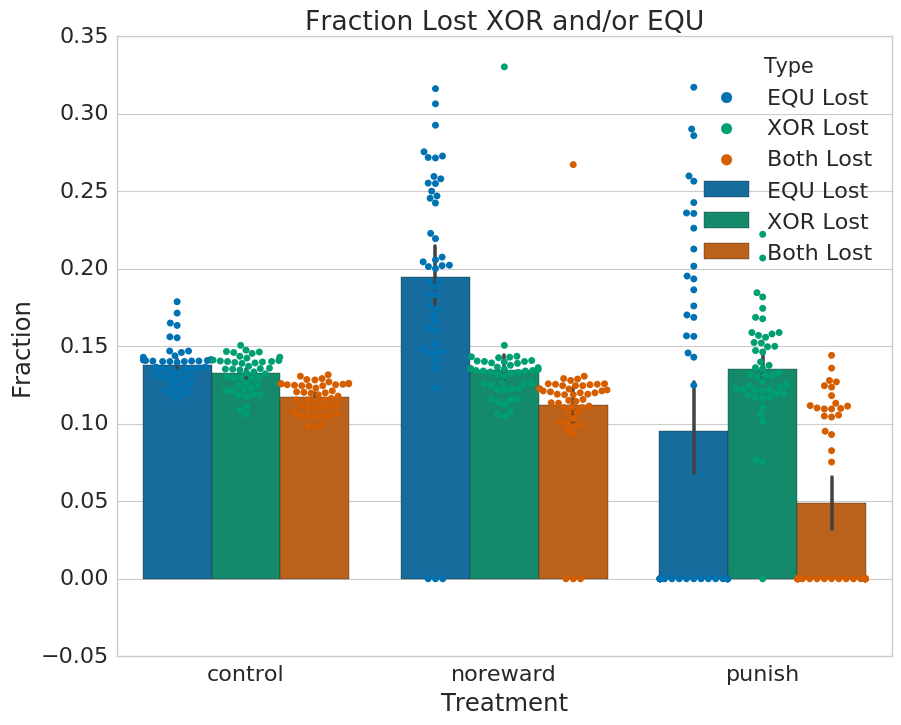

In [65]:
subdir = "../202_StochasticCE__MutLandscape_1Step/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "_env/data/mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[10, 11,
                                                              12
                                                             ],
                names=["XOR Lost", "EQU Lost"
                       , "Both Lost"
                      ],
                comment="#",
                skip_blank_lines=True,
                )
    
#     df = pd.read_csv(filepath, sep=",", header=None, usecols=[11],
#             names=["EQU Lost"],
#             comment="#",
#             skip_blank_lines=True,
#             )
    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
sns.plt.title("Fraction Lost XOR and/or EQU")
order = ["EQU Lost","XOR Lost","Both Lost"]
sns.violinplot(x="Treatment", y="Fraction", hue='Type', hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost XOR and/or EQU")
sns.boxplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )
plt.show()
sns.plt.title("Fraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               )
sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
               data=bigdf, 
               split=True, 
               )


## Figure 11 Old & Devel

/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../204_StochasticCE__MutLandscape_2ndStep/control__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../204_StochasticCE__MutLandscape_2ndStep/noreward__mutation_landscape_metrics.csv
/home/rosiec/Dropbox/School_Docs/Papers/Journal CE Paper/data_analysis/raw_data/082_Final/../204_StochasticCE__MutLandscape_2ndStep/punish__mutation_landscape_metrics.csv
           Type  Fraction Treatment
0  Regained EQU  0.000306   control
1  Regained EQU  0.000612   control
2  Regained EQU  0.000612   control
3  Regained EQU  0.000612   control
4  Regained EQU  0.000612   control
              Type  Fraction Treatment
6962  Regained EQU  0.029691    punish
6963  Regained EQU  0.000918    punish
6964  Regained EQU  0.000918    punish
6965  Regained EQU  0.003979    punish
6966  Regained EQU  0.045608    punish


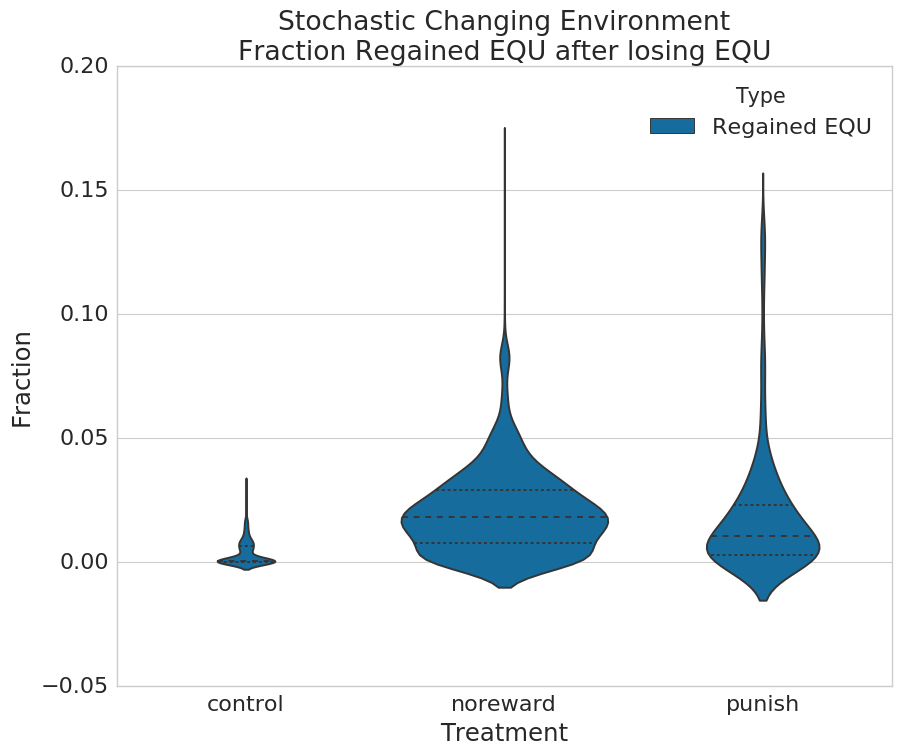

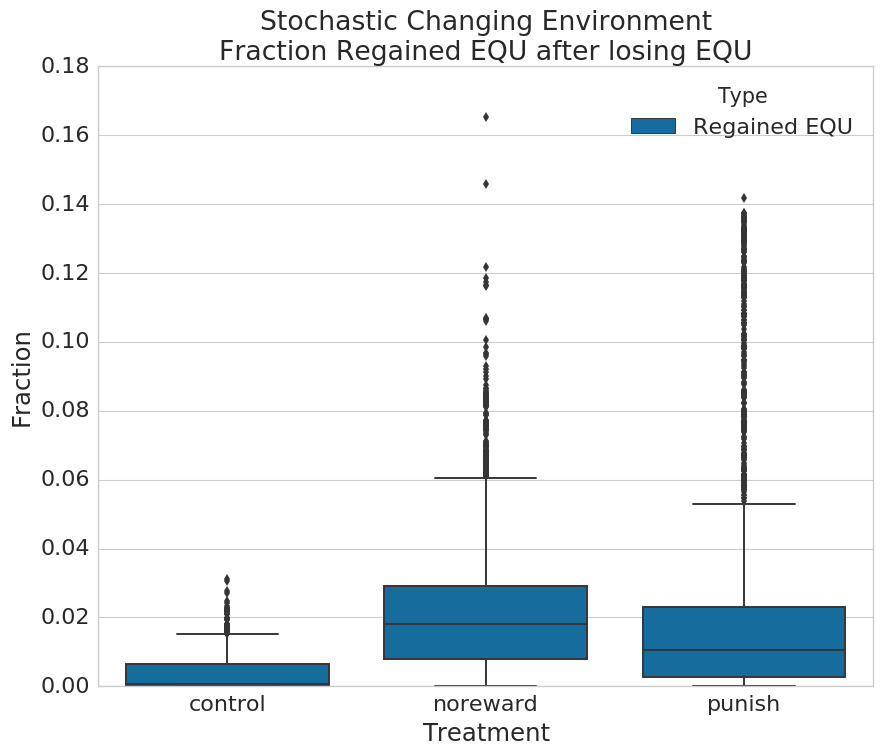

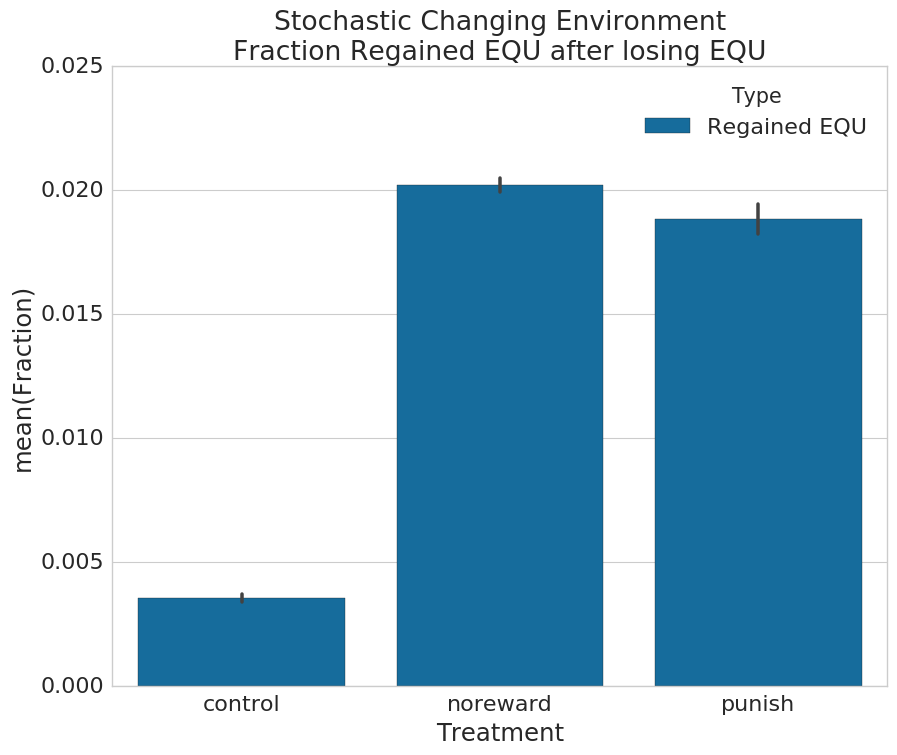

In [22]:
subdir = "../204_StochasticCE__MutLandscape_2ndStep/"

dfs = []
for treatment in treatments:
    #print (treatment)
    filepath = data_path + "/" + subdir + treatment + "__mutation_landscape_metrics.csv"
    filepath = filepath.replace("\\", "")
    print filepath

    df = pd.read_csv(filepath, sep=",", header=None, usecols=[8],
                names=["Regained EQU"],
                comment="#",
                skip_blank_lines=True,
                )

    df = pd.melt(df, value_name="Fraction", var_name=["Type"])
    df['Treatment'] = [treatment] * len(df)
    dfs.append(df)
    
bigdf = pd.concat(dfs)
print bigdf.head()
print bigdf.tail()

sns.set(style="whitegrid", color_codes=True, palette="colorblind")
sns.set_context('paper', font_scale=2)
plt.rcParams['figure.figsize'] = (10, 8)
title="Stochastic Changing Environment\nFraction Regained EQU after losing EQU"
sns.plt.title(title)
order = ["Regained EQU"]
ax = sns.violinplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order,
               data=bigdf, 
               scale="count", scale_hue=False, bw=.3,
               inner="quart",                
               )
#ax.set_ylim([0,0.02])
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
# sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.plt.title(title)
sns.boxplot(x="Treatment", y="Fraction", hue='Type', 
               hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )
plt.show()
sns.plt.title(title)
    # sns.plt.title("Cyclic Changing Environment\nFraction Lost XOR and/or EQU")
sns.barplot(x="Treatment", y="Fraction", hue='Type', 
            hue_order=order, 
               data=bigdf, 
               )
# sns.swarmplot(x="Treatment", y="Fraction", hue='Type', hue_order=order, 
#                data=bigdf, 
#                split=True, 
#                )


## Bottom